<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_python_latest_SD_viral.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

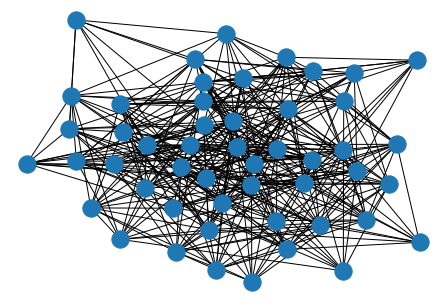

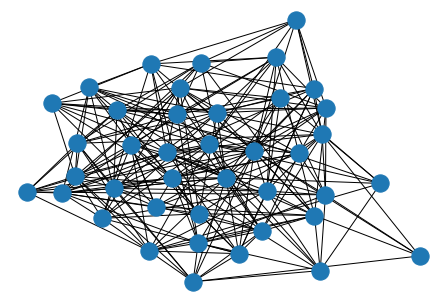

In [1]:
#Erdos-Renyi Graph in Networkx
import numpy as np
from statistics import mean
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 40 nodes (contact places) of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .3      #Probabibilty for Node Connection in random graph
PP = .3
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 1 1 ... 0 1 0]
 [1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 1]
 ...
 [0 0 0 ... 0 0 1]
 [1 0 0 ... 0 0 1]
 [0 0 1 ... 1 1 0]]
[[0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 1 0 0]
 ...
 [0 0 1 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]]


In [3]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [4]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [5]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'C' : 0})
    Agent[k].append({'State' : Rand_state, 'C' : 0 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [6]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [7]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load']*.5)})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  neighbors.append(Agent_next[a_id][3]['First_node'])
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:  
                      I1=(Node[Agent_next[a_id][4]['First_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][4]['First_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][4]['First_nodeN'][2]][2]['I'])
                      I2=(Node[Agent_next[a_id][6]['Second_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][6]['Second_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][6]['Second_nodeN'][2]][2]['I'])
                      IH=(Node[Agent_next[a_id][2]['Home_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][2]['Home_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][2]['Home_nodeN'][2]][2]['I'])
                      V1 = (Node[Agent_next[a_id][4]['First_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][4]['First_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][4]['First_nodeN'][2]][0]['Viral_load'])
                      V2 = (Node[Agent_next[a_id][6]['Second_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][6]['Second_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][6]['Second_nodeN'][2]][0]['Viral_load'])
                      VH = (Node[Agent_next[a_id][2]['Home_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][2]['Home_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][2]['Home_nodeN'][2]][0]['Viral_load'])
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      PH = IH/(IH**2 + .01) + VH/(VH**2+.01)
                      if max(P1,P2,PH) == PH:
                        PH = 3*PH
                        P1 = P1/3
                        P2 = P2/3
                      elif max(P1,P2,PH) == P1:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      else:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      P = P1 + P2 + PH                      
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1 = PH/P 
                        PNN2 = P1/P
                        PNN3 = P2/P 
                      #next = random.choices(neighbors,weights=(PNN1,PNN2,PNN3), k=1)[0] 
                      next = random.choices(neighbors,weights=(.95,.025,.025), k=1)[0]
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      I2 = Node[Agent_next[a_id][8]['Current_nodeN'][1]][2]['I']
                      I3 = Node[Agent_next[a_id][8]['Current_nodeN'][2]][2]['I']
                      I1 = Node[Agent_next[a_id][8]['Current_nodeN'][0]][2]['I']
                      V2 = Node[Agent_next[a_id][8]['Current_nodeN'][1]][0]['Viral_load']
                      V3 = Node[Agent_next[a_id][8]['Current_nodeN'][2]][0]['Viral_load']
                      V1 = Node[Agent_next[a_id][8]['Current_nodeN'][0]][0]['Viral_load']
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      P3 = I3/(I3**2 + .01) + V3/(V3**2+.01)
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      if max(P1,P2,P3) == P1:
                        P1 = 3*P1
                        P2 = P2
                        P3 = P3
                      elif max(P1,P2,P3) == P2:
                        P1 = 3*P1
                        P2 = 2*P2
                        P3 = P1
                      else:
                        P1 = 3*P1
                        P2 = P2
                        P3 = 2*P3
                      P = P1+P2+P3
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1=P1/P
                        PNN2=P2/P
                        PNN3=P3/P
                       
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(PNN1,PNN2,PNN3),k=1)[0]
                      #nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(.90,.05,.05),k=1)[0]
                      #if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                      #  Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      #elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                      #  Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      #else:
                      #  Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['C']+=1
            if nex != cur:
              Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          walks.append(nex)

    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'C' : 0})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['C'] == 4:   #Time-steps of 4 to get cured(I -> R)
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('C') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home) 

    return Node,Node_next,Agent,Agent_next

In [8]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  total_V=0.0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
    total_V+=Node[i][0]['Viral_load']
  return count_S,count_I,count_R,total_V

In [9]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9806, 9581, 9268, 8832, 8386, 7925, 7202, 6274, 5242, 4221, 3182, 2154, 1375, 876, 587, 436, 367, 331, 312, 291, 280, 270, 266, 262, 260, 258, 258, 258, 258, 257, 256, 256, 255, 255, 255, 254, 252, 252, 252, 251, 250, 250, 250, 250, 250, 250]
[194, 419, 732, 1168, 1420, 1656, 2066, 2558, 3144, 3704, 4020, 4120, 3867, 3345, 2595, 1718, 1008, 545, 275, 145, 87, 61, 46, 29, 20, 12, 8, 4, 2, 1, 2, 2, 3, 2, 1, 2, 3, 3, 3, 3, 2, 2, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 419, 732, 1168, 1614, 2075, 2798, 3726, 4758, 5779, 6818, 7846, 8625, 9124, 9413, 9564, 9633, 9669, 9688, 9709, 9720, 9730, 9734, 9738, 9740, 9742, 9742, 9742, 9742, 9743, 9744, 9744, 9745, 9745, 9745, 9746, 9748, 9748, 9748, 9749, 9750, 9750]
[0.0, 33.0, 62.5, 133.25, 198.625, 267.3125, 550.65625, 744.328125, 926.1640625, 1071.08203125, 1451.541015625, 2147.7705078125, 2364.88525390625, 2290.442626953125, 2100.2213134765625, 1791.1106567382812, 1341.5553283691406, 936.7776641845703, 597.3888320922852, 358.6944160461426, 212.34720802

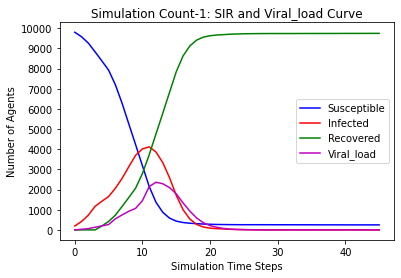

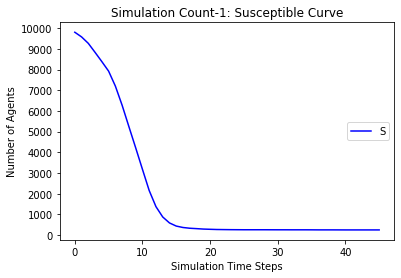

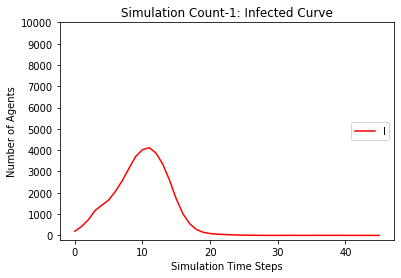

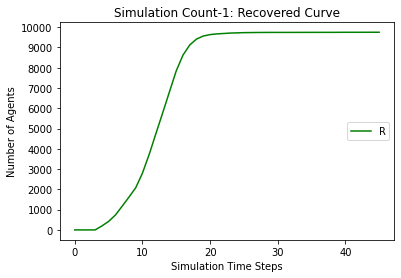

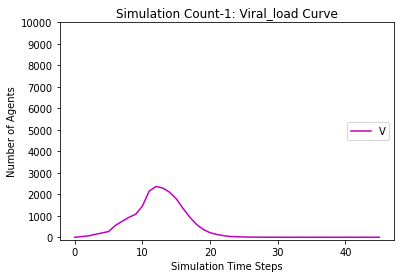

[9806, 9585, 9279, 8874, 8470, 8064, 7528, 6828, 6014, 5229, 4392, 3572, 2802, 2194, 1639, 1229, 957, 793, 681, 593, 530, 495, 468, 455, 447, 440, 435, 432, 429, 427, 423, 422, 422, 422, 422, 422]
[194, 415, 721, 1126, 1336, 1521, 1751, 2046, 2456, 2835, 3136, 3256, 3212, 3035, 2753, 2343, 1845, 1401, 958, 636, 427, 298, 213, 138, 83, 55, 33, 23, 18, 13, 12, 10, 7, 5, 1, 0]
[0, 0, 0, 0, 194, 415, 721, 1126, 1530, 1936, 2472, 3172, 3986, 4771, 5608, 6428, 7198, 7806, 8361, 8771, 9043, 9207, 9319, 9407, 9470, 9505, 9532, 9545, 9553, 9560, 9565, 9568, 9571, 9573, 9577, 9578]
[0.0, 35.0, 62.5, 113.25, 189.625, 275.8125, 369.90625, 501.953125, 613.9765625, 664.98828125, 821.494140625, 1058.7470703125, 1266.37353515625, 1326.186767578125, 1444.0933837890625, 1483.0466918945312, 1324.5233459472656, 1110.2616729736328, 913.1308364868164, 707.5654182434082, 534.7827091217041, 377.39135456085205, 262.695677280426, 179.347838640213, 123.6739193201065, 76.83695966005325, 48.41847983002663, 27.2092

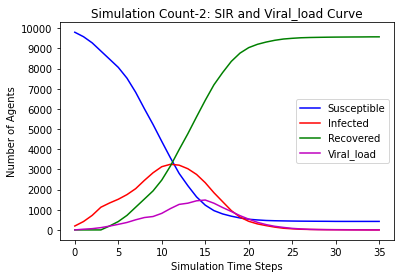

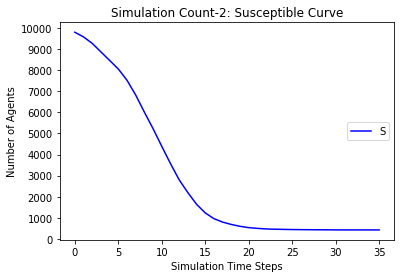

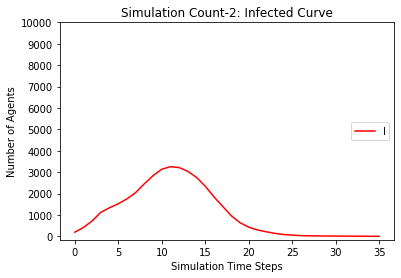

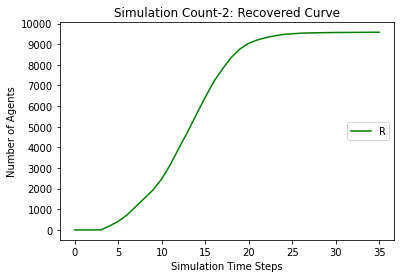

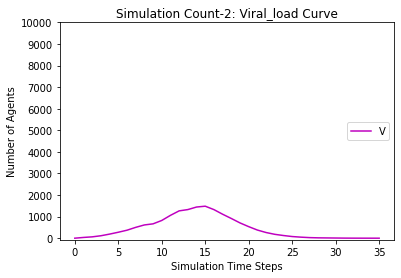

[9806, 9582, 9242, 8794, 8249, 7522, 6610, 5550, 4372, 3132, 2049, 1321, 809, 522, 345, 280, 250, 225, 216, 214, 211, 207, 206, 205, 203, 201, 201, 198, 198, 198, 196, 196, 195, 194, 194, 194, 194, 194]
[194, 418, 758, 1206, 1557, 2060, 2632, 3244, 3877, 4390, 4561, 4229, 3563, 2610, 1704, 1041, 559, 297, 129, 66, 39, 18, 10, 9, 8, 6, 5, 7, 5, 3, 5, 2, 3, 4, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 418, 758, 1206, 1751, 2478, 3390, 4450, 5628, 6868, 7951, 8679, 9191, 9478, 9655, 9720, 9750, 9775, 9784, 9786, 9789, 9793, 9794, 9795, 9797, 9799, 9799, 9802, 9802, 9802, 9804, 9804, 9805, 9806]
[0.0, 30.0, 78.0, 135.0, 267.5, 455.75, 652.875, 864.4375, 1219.21875, 1762.609375, 2292.3046875, 2629.15234375, 2912.576171875, 2747.2880859375, 2285.64404296875, 1651.822021484375, 1104.9110107421875, 709.4555053710938, 433.7277526855469, 251.86387634277344, 146.93193817138672, 82.46596908569336, 44.23298454284668, 24.11649227142334, 14.05824613571167, 9.029123067855835, 5.5145615339279175, 3.757280766963958

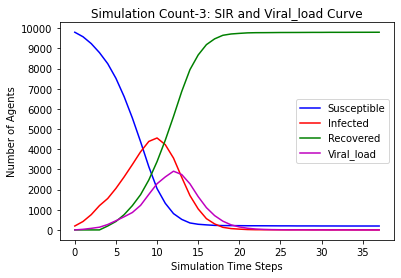

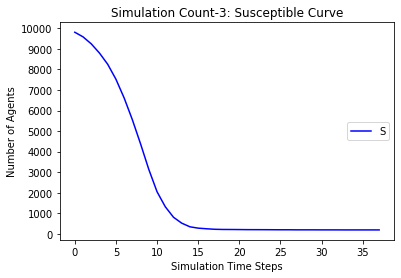

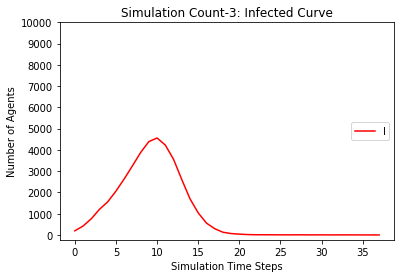

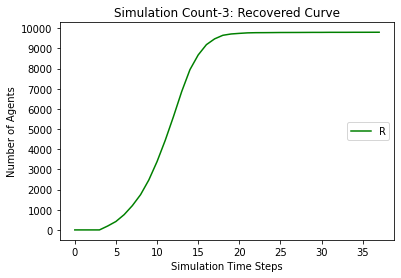

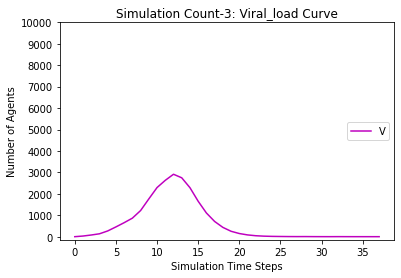

[9806, 9602, 9281, 8913, 8420, 7848, 7106, 6210, 5270, 4229, 3152, 2228, 1548, 1070, 754, 568, 454, 374, 323, 291, 276, 267, 258, 254, 252, 250, 249, 246, 244, 242, 240, 239, 238, 238, 238, 237, 235, 233, 232, 230, 230, 229, 228, 227, 224, 222, 222, 222, 221, 220, 220, 219, 218, 218, 217, 217, 217, 216, 216, 216, 216, 216]
[194, 398, 719, 1087, 1386, 1754, 2175, 2703, 3150, 3619, 3954, 3982, 3722, 3159, 2398, 1660, 1094, 696, 431, 277, 178, 107, 65, 37, 24, 17, 9, 8, 8, 8, 9, 7, 6, 4, 2, 2, 3, 5, 6, 7, 5, 4, 4, 3, 6, 7, 6, 5, 3, 2, 2, 3, 3, 2, 3, 2, 1, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 398, 719, 1087, 1580, 2152, 2894, 3790, 4730, 5771, 6848, 7772, 8452, 8930, 9246, 9432, 9546, 9626, 9677, 9709, 9724, 9733, 9742, 9746, 9748, 9750, 9751, 9754, 9756, 9758, 9760, 9761, 9762, 9762, 9762, 9763, 9765, 9767, 9768, 9770, 9770, 9771, 9772, 9773, 9776, 9778, 9778, 9778, 9779, 9780, 9780, 9781, 9782, 9782, 9783, 9783, 9783, 9784]
[0.0, 30.0, 62.0, 106.0, 253.0, 336.5, 513.25, 667.625, 828.8125, 10

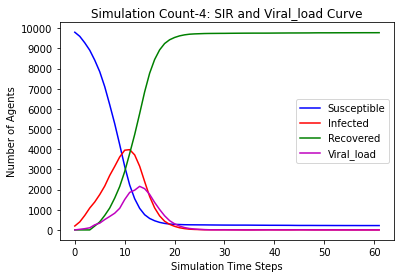

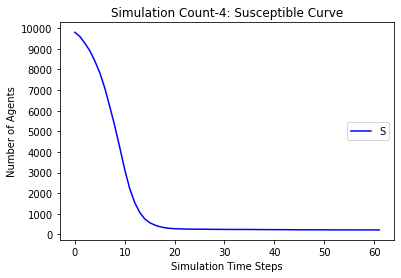

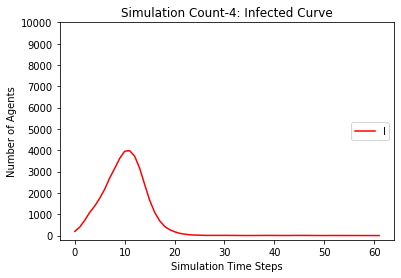

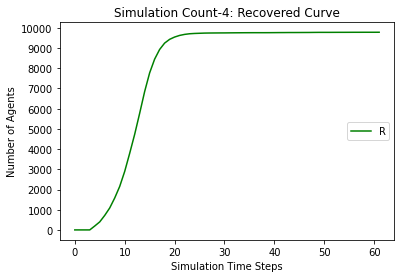

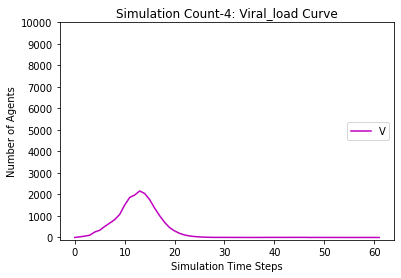

[9806, 9608, 9249, 8820, 8274, 7704, 7073, 6195, 5235, 4192, 3175, 2220, 1476, 940, 608, 451, 365, 320, 292, 279, 273, 269, 265, 264, 260, 259, 259, 259, 259, 259, 258, 256, 256, 256, 256, 256]
[194, 392, 751, 1180, 1532, 1904, 2176, 2625, 3039, 3512, 3898, 3975, 3759, 3252, 2567, 1769, 1111, 620, 316, 172, 92, 51, 27, 15, 13, 10, 6, 5, 1, 0, 1, 3, 3, 3, 2, 0]
[0, 0, 0, 0, 194, 392, 751, 1180, 1726, 2296, 2927, 3805, 4765, 5808, 6825, 7780, 8524, 9060, 9392, 9549, 9635, 9680, 9708, 9721, 9727, 9731, 9735, 9736, 9740, 9741, 9741, 9741, 9741, 9741, 9742, 9744]
[0.0, 31.0, 92.5, 128.25, 245.125, 323.5625, 444.78125, 759.390625, 914.6953125, 1139.34765625, 1544.673828125, 2022.3369140625, 2272.16845703125, 2315.084228515625, 2220.5421142578125, 1942.2710571289062, 1542.1355285644531, 1109.0677642822266, 733.5338821411133, 453.76694107055664, 270.8834705352783, 162.44173526763916, 99.22086763381958, 55.61043381690979, 29.805216908454895, 16.902608454227448, 9.451304227113724, 4.725652113556

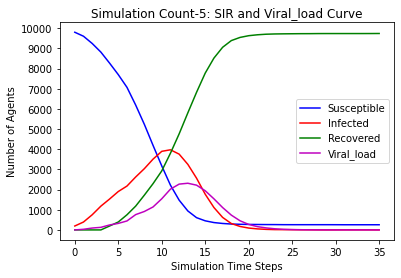

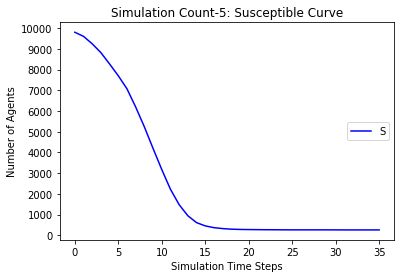

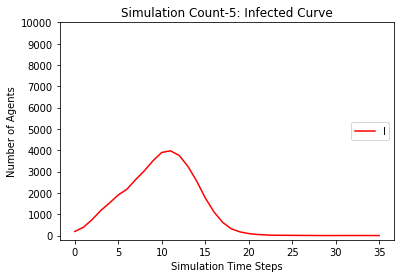

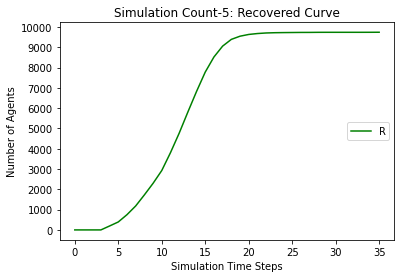

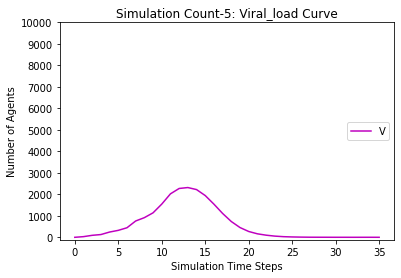

[9806, 9571, 9234, 8849, 8416, 7938, 7236, 6313, 5299, 4245, 3207, 2129, 1431, 945, 614, 434, 354, 287, 250, 229, 218, 211, 206, 204, 203, 199, 199, 199, 199, 198, 198, 198, 198, 198]
[194, 429, 766, 1151, 1390, 1633, 1998, 2536, 3117, 3693, 4029, 4184, 3868, 3300, 2593, 1695, 1077, 658, 364, 205, 136, 76, 44, 25, 15, 12, 7, 5, 4, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 429, 766, 1151, 1584, 2062, 2764, 3687, 4701, 5755, 6793, 7871, 8569, 9055, 9386, 9566, 9646, 9713, 9750, 9771, 9782, 9789, 9794, 9796, 9797, 9801, 9801, 9801, 9801, 9802]
[0.0, 35.0, 64.5, 117.25, 191.625, 355.8125, 540.90625, 717.453125, 933.7265625, 1318.86328125, 1709.431640625, 2025.7158203125, 2181.85791015625, 2226.928955078125, 2339.4644775390625, 2069.7322387695312, 1540.8661193847656, 1111.4330596923828, 740.7165298461914, 461.3582649230957, 279.67913246154785, 173.83956623077393, 104.91978311538696, 65.45989155769348, 41.72994577884674, 27.86497288942337, 16.932486444711685, 9.466243222355843, 5.733121611177921, 2.8

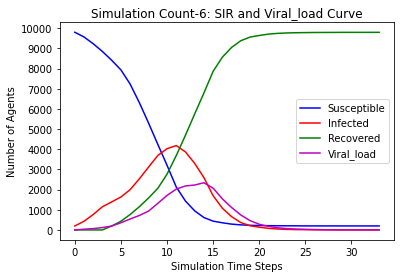

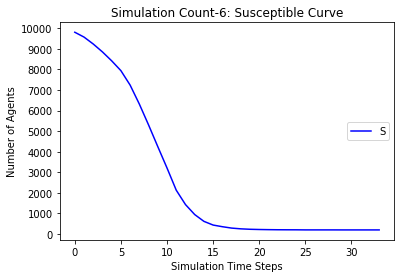

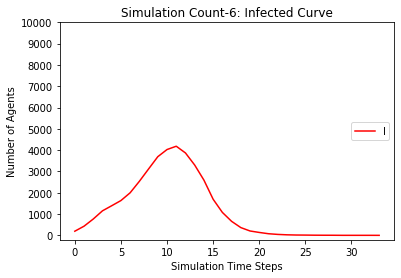

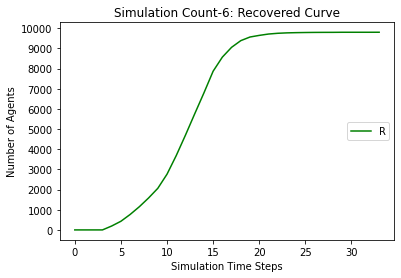

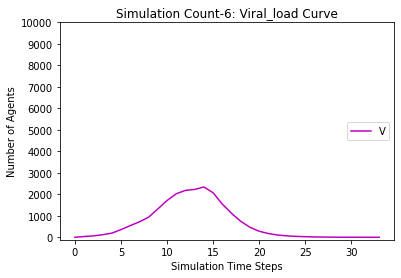

[9806, 9577, 9252, 8853, 8418, 7856, 7168, 6362, 5537, 4687, 3754, 2819, 1994, 1438, 1072, 815, 661, 551, 482, 455, 434, 421, 411, 405, 404, 403, 402, 402, 401, 401, 401, 401, 400, 399, 398, 398, 398, 398, 398]
[194, 423, 748, 1147, 1388, 1721, 2084, 2491, 2881, 3169, 3414, 3543, 3543, 3249, 2682, 2004, 1333, 887, 590, 360, 227, 130, 71, 50, 30, 18, 9, 3, 3, 2, 1, 1, 1, 2, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 423, 748, 1147, 1582, 2144, 2832, 3638, 4463, 5313, 6246, 7181, 8006, 8562, 8928, 9185, 9339, 9449, 9518, 9545, 9566, 9579, 9589, 9595, 9596, 9597, 9598, 9598, 9599, 9599, 9599, 9599, 9600, 9601, 9602]
[0.0, 28.0, 69.0, 123.5, 181.75, 358.875, 462.4375, 574.21875, 660.109375, 937.0546875, 1261.52734375, 1611.763671875, 1664.8818359375, 1718.44091796875, 1642.220458984375, 1509.1102294921875, 1240.5551147460938, 970.2775573730469, 721.1387786865234, 489.5693893432617, 305.78469467163086, 189.89234733581543, 109.94617366790771, 66.97308683395386, 41.48654341697693, 24.743271708488464, 1

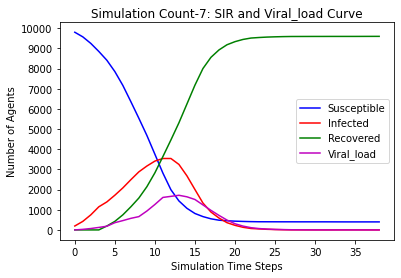

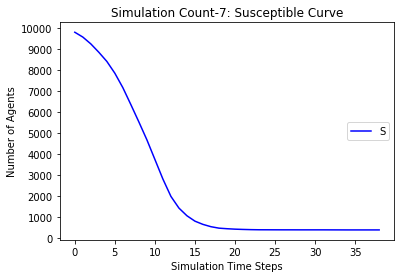

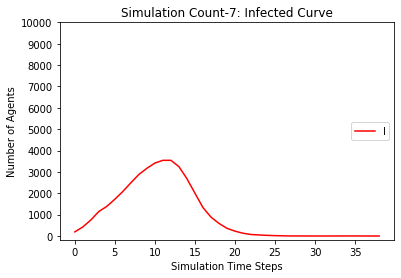

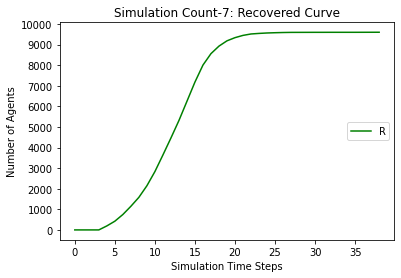

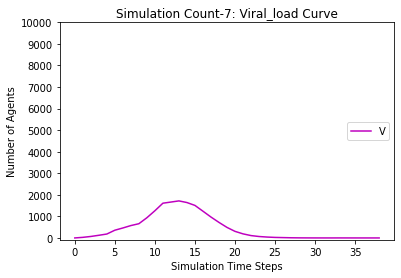

[9806, 9574, 9253, 8846, 8333, 7678, 6842, 5883, 4927, 3938, 2899, 2015, 1336, 889, 648, 508, 411, 376, 357, 336, 324, 315, 309, 307, 305, 304, 302, 302, 301, 299, 299, 299, 296, 296, 296, 296, 296, 296]
[194, 426, 747, 1154, 1473, 1896, 2411, 2963, 3406, 3740, 3943, 3868, 3591, 3049, 2251, 1507, 925, 513, 291, 172, 87, 61, 48, 29, 19, 11, 7, 5, 4, 5, 3, 3, 5, 3, 3, 3, 0, 0]
[0, 0, 0, 0, 194, 426, 747, 1154, 1667, 2322, 3158, 4117, 5073, 6062, 7101, 7985, 8664, 9111, 9352, 9492, 9589, 9624, 9643, 9664, 9676, 9685, 9691, 9693, 9695, 9696, 9698, 9698, 9699, 9701, 9701, 9701, 9704, 9704]
[0.0, 30.0, 67.0, 134.5, 301.25, 406.625, 550.3125, 764.15625, 977.078125, 1243.5390625, 1647.76953125, 2007.884765625, 2290.9423828125, 2193.47119140625, 1998.735595703125, 1730.3677978515625, 1300.1838989257812, 902.0919494628906, 567.0459747314453, 361.52298736572266, 222.76149368286133, 127.38074684143066, 79.69037342071533, 50.845186710357666, 30.422593355178833, 19.211296677589417, 13.60564833879470

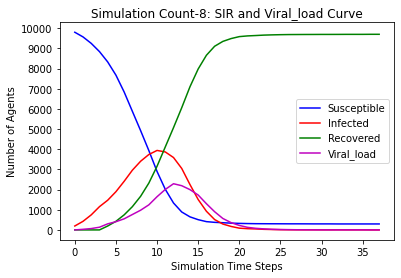

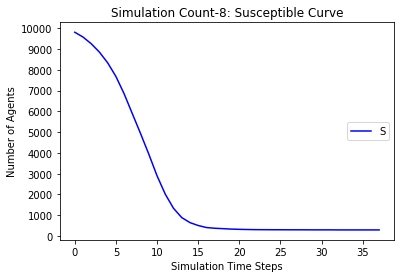

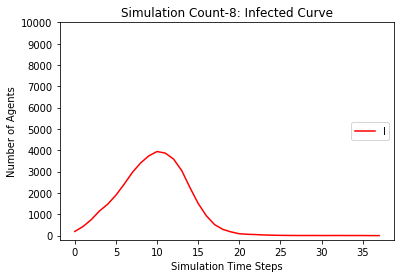

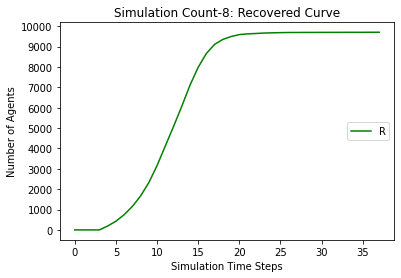

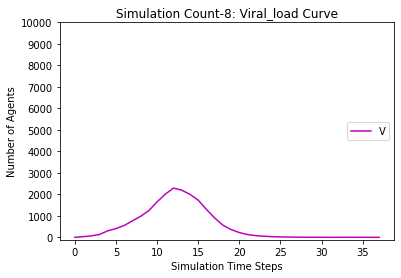

[9806, 9605, 9325, 8962, 8574, 8199, 7652, 7044, 6343, 5491, 4596, 3644, 2757, 2042, 1538, 1161, 926, 750, 620, 536, 476, 447, 425, 416, 406, 396, 390, 385, 381, 381, 381, 381, 381, 380, 378, 377, 377, 376, 376, 376, 376, 375, 374, 374, 374, 374, 374]
[194, 395, 675, 1038, 1232, 1406, 1673, 1918, 2231, 2708, 3056, 3400, 3586, 3449, 3058, 2483, 1831, 1292, 918, 625, 450, 303, 195, 120, 70, 51, 35, 31, 25, 15, 9, 4, 0, 1, 3, 4, 4, 4, 2, 1, 1, 1, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 395, 675, 1038, 1426, 1801, 2348, 2956, 3657, 4509, 5404, 6356, 7243, 7958, 8462, 8839, 9074, 9250, 9380, 9464, 9524, 9553, 9575, 9584, 9594, 9604, 9610, 9615, 9619, 9619, 9619, 9619, 9619, 9620, 9622, 9623, 9623, 9624, 9624, 9624, 9624, 9625, 9626]
[0.0, 26.0, 61.0, 86.5, 169.25, 218.625, 381.3125, 412.65625, 597.328125, 781.6640625, 903.83203125, 1130.916015625, 1405.4580078125, 1621.72900390625, 1646.864501953125, 1553.4322509765625, 1372.7161254882812, 1162.3580627441406, 938.1790313720703, 712.0895156860352, 

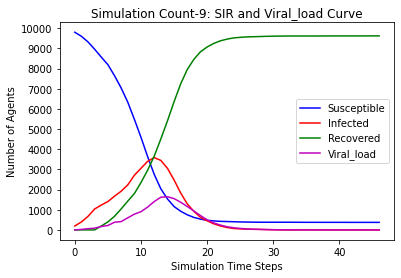

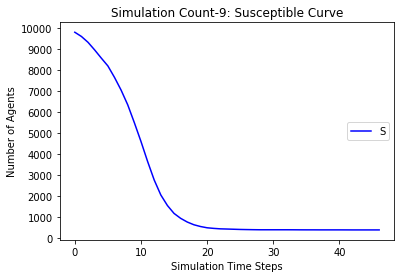

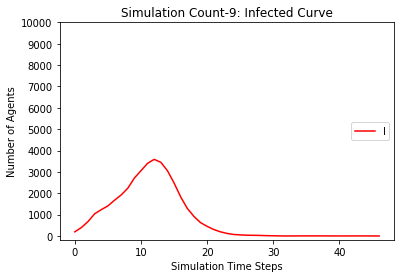

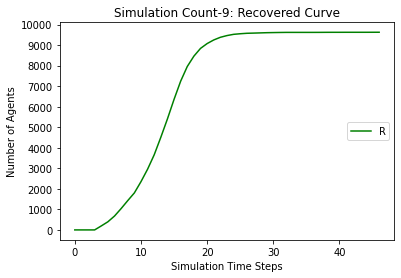

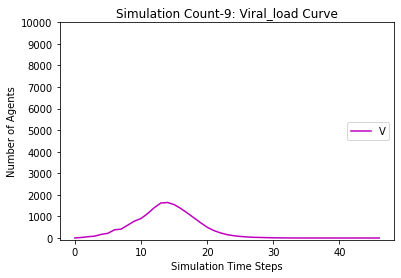

[9806, 9580, 9255, 8843, 8420, 7941, 7293, 6509, 5503, 4493, 3468, 2548, 1802, 1210, 863, 623, 489, 407, 355, 321, 295, 279, 270, 264, 256, 252, 251, 251, 249, 247, 247, 247, 246, 246, 246, 246, 245, 245, 245, 245, 245]
[194, 420, 745, 1157, 1386, 1639, 1962, 2334, 2917, 3448, 3825, 3961, 3701, 3283, 2605, 1925, 1313, 803, 508, 302, 194, 128, 85, 57, 39, 27, 19, 13, 7, 5, 4, 4, 3, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 420, 745, 1157, 1580, 2059, 2707, 3491, 4497, 5507, 6532, 7452, 8198, 8790, 9137, 9377, 9511, 9593, 9645, 9679, 9705, 9721, 9730, 9736, 9744, 9748, 9749, 9749, 9751, 9753, 9753, 9753, 9754, 9754, 9754, 9754, 9755]
[0.0, 28.0, 62.0, 143.0, 198.5, 329.25, 447.625, 627.8125, 857.90625, 1123.953125, 1477.9765625, 1656.98828125, 1846.494140625, 1870.2470703125, 1848.12353515625, 1703.061767578125, 1419.5308837890625, 1100.7654418945312, 749.3827209472656, 482.6913604736328, 306.3456802368164, 192.1728401184082, 125.0864200592041, 81.54321002960205, 52.771605014801025, 38.3

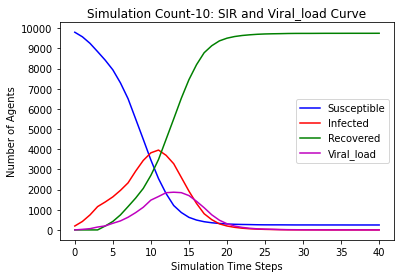

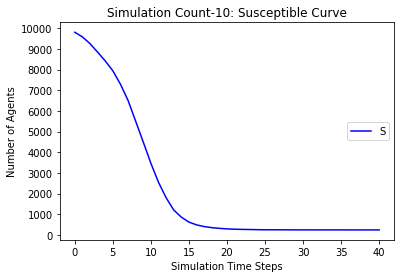

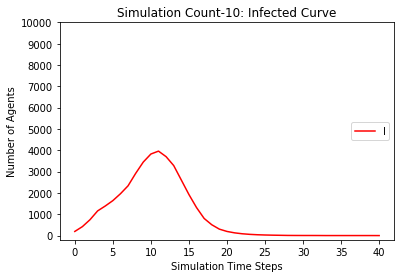

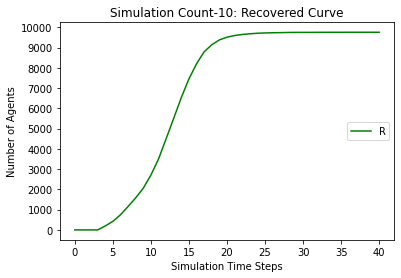

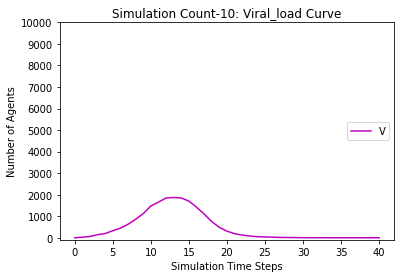

[9806, 9585, 9240, 8783, 8260, 7643, 6798, 5935, 4942, 3886, 2911, 2163, 1543, 1133, 870, 724, 636, 570, 546, 525, 510, 494, 489, 483, 478, 475, 472, 470, 466, 466, 466, 466, 466, 466, 466, 466]
[194, 415, 760, 1217, 1546, 1942, 2442, 2848, 3318, 3757, 3887, 3772, 3399, 2753, 2041, 1439, 907, 563, 324, 199, 126, 76, 57, 42, 32, 19, 17, 13, 12, 9, 6, 4, 0, 0, 0, 0]
[0, 0, 0, 0, 194, 415, 760, 1217, 1740, 2357, 3202, 4065, 5058, 6114, 7089, 7837, 8457, 8867, 9130, 9276, 9364, 9430, 9454, 9475, 9490, 9506, 9511, 9517, 9522, 9525, 9528, 9530, 9534, 9534, 9534, 9534]
[0.0, 35.0, 64.5, 160.25, 270.125, 427.0625, 592.53125, 697.265625, 1016.6328125, 1350.31640625, 1507.158203125, 1807.5791015625, 1949.78955078125, 1787.894775390625, 1511.9473876953125, 1137.9736938476562, 827.9868469238281, 600.9934234619141, 398.49671173095703, 257.2483558654785, 160.62417793273926, 103.31208896636963, 62.656044483184814, 37.32802224159241, 25.664011120796204, 16.832005560398102, 10.416002780199051, 7.208001

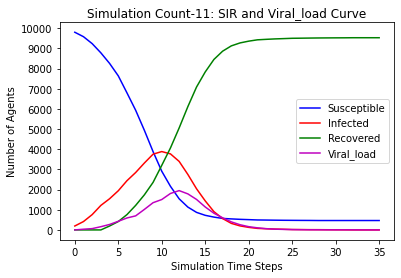

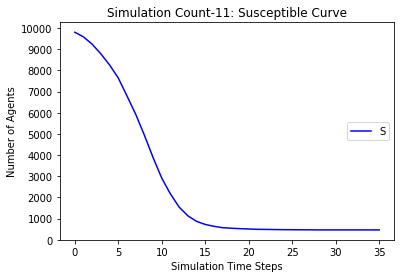

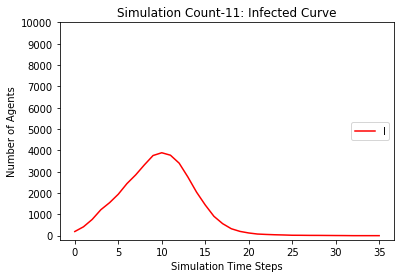

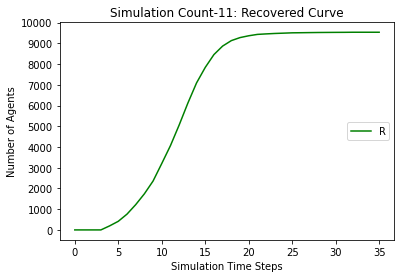

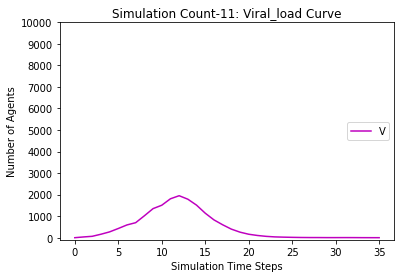

[9806, 9600, 9272, 8867, 8403, 7928, 7280, 6484, 5520, 4582, 3571, 2613, 1836, 1260, 850, 641, 489, 380, 331, 303, 276, 260, 256, 254, 252, 251, 251, 249, 249, 247, 247, 246, 245, 245, 244, 244, 243, 242, 242, 242, 242, 242]
[194, 400, 728, 1133, 1403, 1672, 1992, 2383, 2883, 3346, 3709, 3871, 3684, 3322, 2721, 1972, 1347, 880, 519, 338, 213, 120, 75, 49, 24, 9, 5, 5, 3, 4, 4, 3, 4, 2, 3, 2, 2, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 400, 728, 1133, 1597, 2072, 2720, 3516, 4480, 5418, 6429, 7387, 8164, 8740, 9150, 9359, 9511, 9620, 9669, 9697, 9724, 9740, 9744, 9746, 9748, 9749, 9749, 9751, 9751, 9753, 9753, 9754, 9755, 9755, 9756, 9756, 9757, 9758]
[0.0, 30.0, 60.0, 121.0, 187.5, 262.75, 441.375, 680.6875, 911.34375, 1026.671875, 1386.3359375, 1767.16796875, 2000.583984375, 2002.2919921875, 1924.14599609375, 1647.072998046875, 1380.5364990234375, 1109.2682495117188, 774.6341247558594, 501.3170623779297, 333.65853118896484, 202.82926559448242, 124.41463279724121, 70.2073163986206, 45.10365819

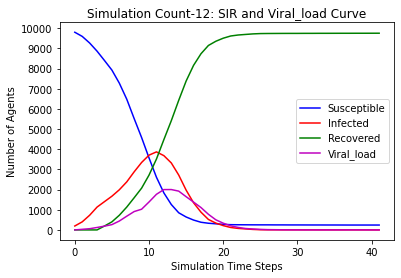

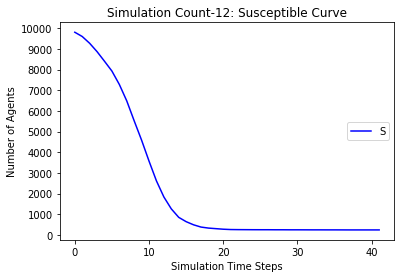

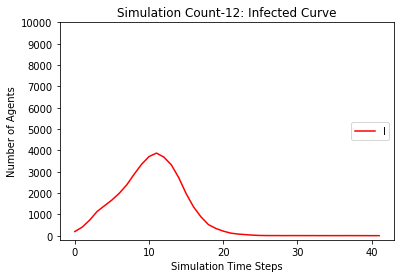

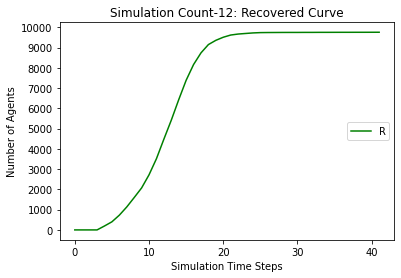

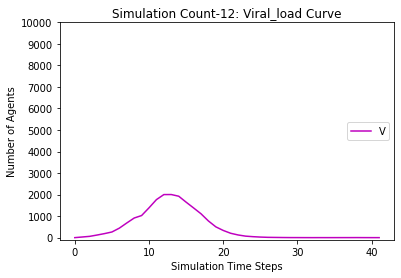

[9806, 9608, 9300, 8931, 8478, 8000, 7458, 6823, 6009, 5005, 4001, 3039, 2142, 1497, 1074, 815, 655, 542, 464, 424, 397, 381, 365, 358, 353, 350, 346, 343, 341, 340, 339, 338, 338, 337, 336, 336, 335, 335, 335, 335, 334, 333, 333, 332, 332, 332, 331, 329, 329, 329, 329, 328, 328, 328, 328, 328]
[194, 392, 700, 1069, 1328, 1608, 1842, 2108, 2469, 2995, 3457, 3784, 3867, 3508, 2927, 2224, 1487, 955, 610, 391, 258, 161, 99, 66, 44, 31, 19, 15, 12, 10, 7, 5, 3, 3, 3, 2, 3, 2, 1, 1, 1, 2, 2, 3, 2, 1, 2, 3, 3, 3, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 392, 700, 1069, 1522, 2000, 2542, 3177, 3991, 4995, 5999, 6961, 7858, 8503, 8926, 9185, 9345, 9458, 9536, 9576, 9603, 9619, 9635, 9642, 9647, 9650, 9654, 9657, 9659, 9660, 9661, 9662, 9662, 9663, 9664, 9664, 9665, 9665, 9665, 9665, 9666, 9667, 9667, 9668, 9668, 9668, 9669, 9671, 9671, 9671, 9671, 9672]
[0.0, 31.0, 48.5, 105.25, 170.625, 256.3125, 374.15625, 503.078125, 707.5390625, 998.76953125, 1225.384765625, 1428.6923828125, 1747.34619140625, 1

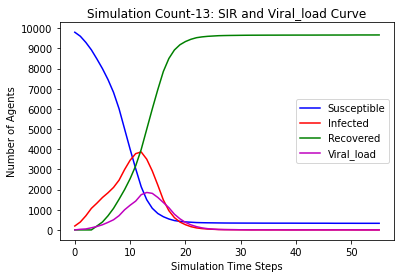

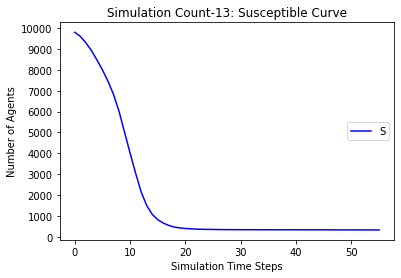

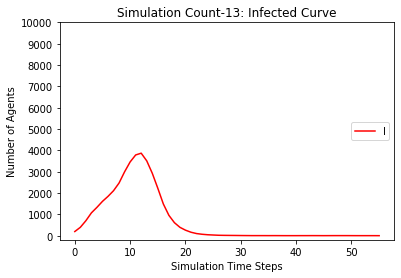

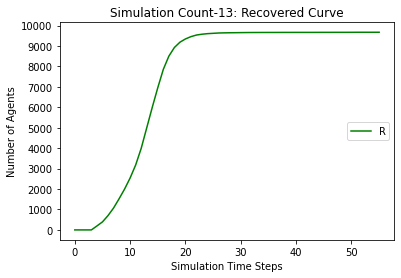

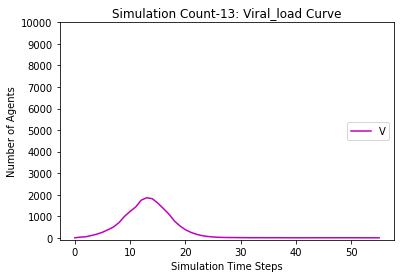

[9806, 9600, 9235, 8826, 8342, 7742, 7013, 6066, 5048, 4056, 3137, 2349, 1677, 1215, 934, 750, 623, 561, 520, 499, 489, 482, 479, 476, 475, 473, 471, 469, 469, 469, 468, 466, 465, 462, 460, 460, 460, 460, 460]
[194, 400, 765, 1174, 1464, 1858, 2222, 2760, 3294, 3686, 3876, 3717, 3371, 2841, 2203, 1599, 1054, 654, 414, 251, 134, 79, 41, 23, 14, 9, 8, 7, 6, 4, 3, 3, 4, 7, 8, 6, 5, 2, 0]
[0, 0, 0, 0, 194, 400, 765, 1174, 1658, 2258, 2987, 3934, 4952, 5944, 6863, 7651, 8323, 8785, 9066, 9250, 9377, 9439, 9480, 9501, 9511, 9518, 9521, 9524, 9525, 9527, 9529, 9531, 9531, 9531, 9532, 9534, 9535, 9538, 9540]
[0.0, 28.0, 91.0, 112.5, 230.25, 355.125, 484.5625, 829.28125, 900.640625, 1152.3203125, 1442.16015625, 1638.080078125, 1935.0400390625, 2005.52001953125, 1793.760009765625, 1406.8800048828125, 1083.4400024414062, 743.7200012207031, 495.86000061035156, 307.9300003051758, 198.9650001525879, 118.48250007629395, 66.24125003814697, 38.120625019073486, 24.060312509536743, 15.030156254768372, 10

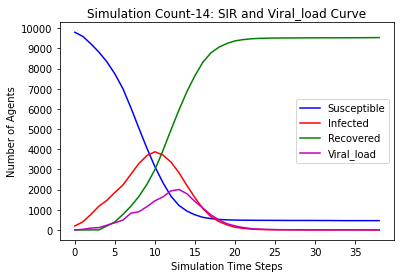

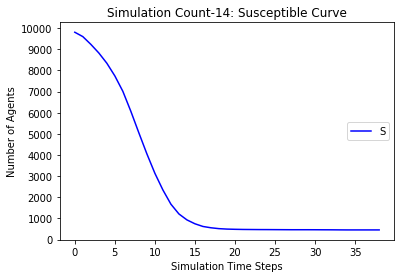

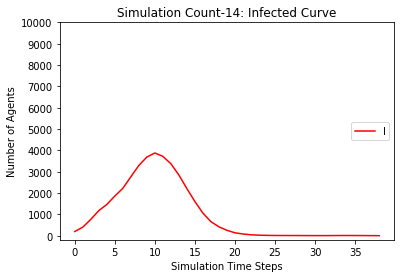

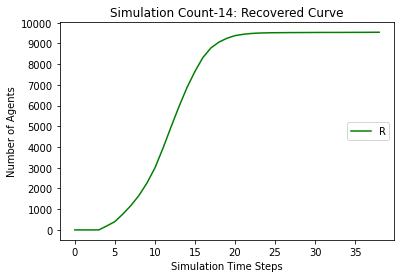

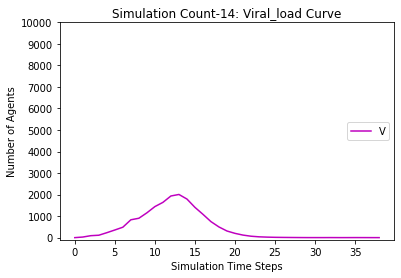

[9806, 9578, 9252, 8901, 8410, 7781, 7039, 6177, 5134, 4117, 3193, 2323, 1610, 1101, 746, 509, 385, 320, 285, 262, 246, 238, 232, 232, 232, 231, 228, 226, 225, 225, 224, 224, 224, 223, 222, 222, 221, 220, 219, 219, 218, 218, 218, 217, 216, 215, 215, 214, 213, 213, 213, 213, 213, 212, 211, 211, 211, 211, 211]
[194, 422, 748, 1099, 1396, 1797, 2213, 2724, 3276, 3664, 3846, 3854, 3524, 3016, 2447, 1814, 1225, 781, 461, 247, 139, 82, 53, 30, 14, 7, 4, 6, 7, 6, 4, 2, 1, 2, 2, 2, 3, 3, 3, 3, 3, 2, 1, 2, 2, 3, 3, 3, 3, 2, 2, 1, 0, 1, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 422, 748, 1099, 1590, 2219, 2961, 3823, 4866, 5883, 6807, 7677, 8390, 8899, 9254, 9491, 9615, 9680, 9715, 9738, 9754, 9762, 9768, 9768, 9768, 9769, 9772, 9774, 9775, 9775, 9776, 9776, 9776, 9777, 9778, 9778, 9779, 9780, 9781, 9781, 9782, 9782, 9782, 9783, 9784, 9785, 9785, 9786, 9787, 9787, 9787, 9787, 9787, 9788, 9789]
[0.0, 34.0, 65.0, 116.5, 294.25, 389.125, 539.5625, 767.78125, 1072.890625, 1363.4453125, 1543.72265625, 2007.86

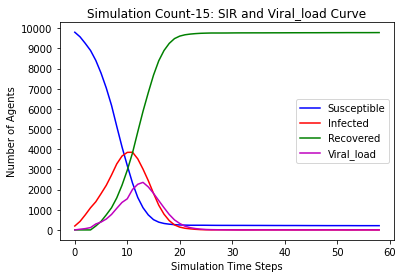

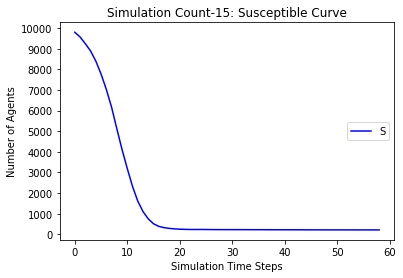

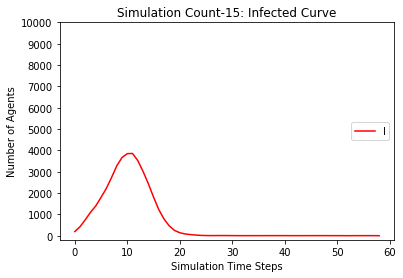

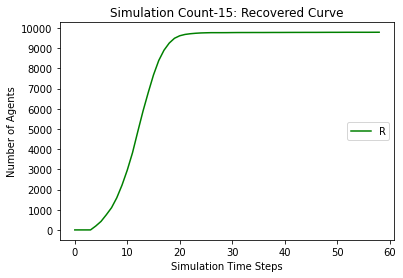

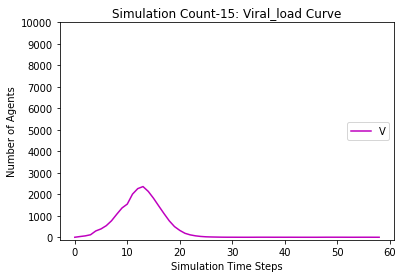

[9806, 9581, 9265, 8890, 8389, 7749, 6988, 6149, 5158, 4122, 3273, 2553, 2013, 1570, 1246, 1003, 855, 747, 678, 619, 580, 549, 525, 513, 507, 497, 495, 494, 493, 493, 493, 492, 491, 490, 489, 489, 489, 489, 487, 485, 484, 484, 483, 482, 482, 482, 482, 481, 481, 481, 481, 481]
[194, 419, 735, 1110, 1417, 1832, 2277, 2741, 3231, 3627, 3715, 3596, 3145, 2552, 2027, 1550, 1158, 823, 568, 384, 275, 198, 153, 106, 73, 52, 30, 19, 14, 4, 2, 2, 2, 3, 4, 3, 2, 1, 2, 4, 5, 5, 4, 3, 2, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 419, 735, 1110, 1611, 2251, 3012, 3851, 4842, 5878, 6727, 7447, 7987, 8430, 8754, 8997, 9145, 9253, 9322, 9381, 9420, 9451, 9475, 9487, 9493, 9503, 9505, 9506, 9507, 9507, 9507, 9508, 9509, 9510, 9511, 9511, 9511, 9511, 9513, 9515, 9516, 9516, 9517, 9518, 9518, 9518, 9518, 9519]
[0.0, 29.0, 57.5, 149.75, 252.875, 395.4375, 483.71875, 697.859375, 965.9296875, 1277.96484375, 1418.982421875, 1463.4912109375, 1449.74560546875, 1346.872802734375, 1314.4364013671875, 1163.2182006835

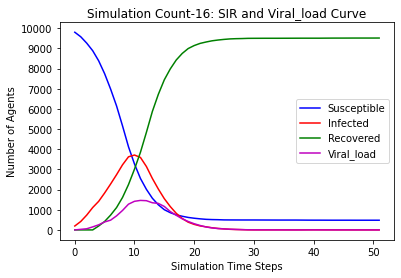

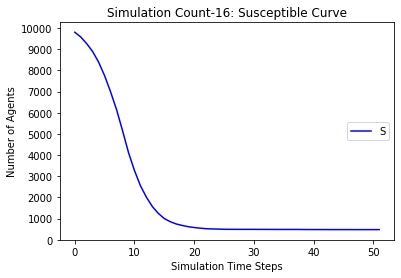

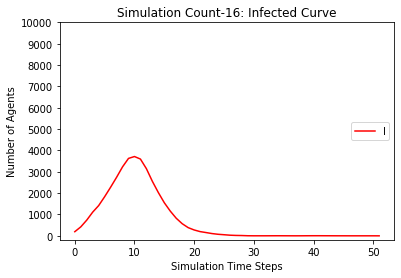

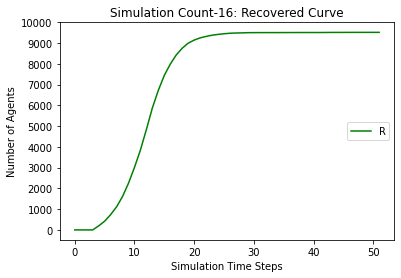

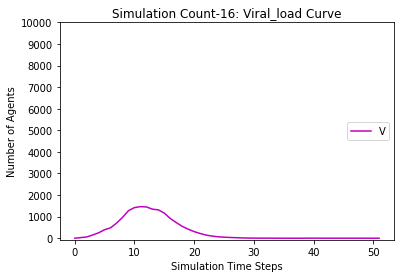

[9806, 9591, 9275, 8886, 8428, 7859, 7161, 6320, 5406, 4456, 3352, 2369, 1675, 1178, 834, 605, 481, 415, 376, 355, 350, 343, 338, 332, 326, 324, 323, 323, 322, 322, 322, 322, 322]
[194, 409, 725, 1114, 1378, 1732, 2114, 2566, 3022, 3403, 3809, 3951, 3731, 3278, 2518, 1764, 1194, 763, 458, 250, 131, 72, 38, 23, 24, 19, 15, 9, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 194, 409, 725, 1114, 1572, 2141, 2839, 3680, 4594, 5544, 6648, 7631, 8325, 8822, 9166, 9395, 9519, 9585, 9624, 9645, 9650, 9657, 9662, 9668, 9674, 9676, 9677, 9677, 9678]
[0.0, 25.0, 44.5, 121.25, 233.625, 406.8125, 462.40625, 603.203125, 795.6015625, 1034.80078125, 1632.400390625, 1801.2001953125, 1892.60009765625, 1884.300048828125, 1941.1500244140625, 1637.5750122070312, 1276.7875061035156, 992.3937530517578, 652.1968765258789, 407.09843826293945, 239.54921913146973, 145.77460956573486, 90.88730478286743, 52.443652391433716, 29.221826195716858, 19.61091309785843, 12.805456548929214, 7.402728274464607, 3.7013641372323036, 2.85068206861

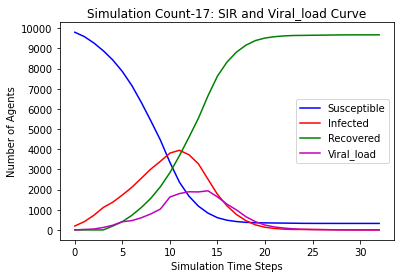

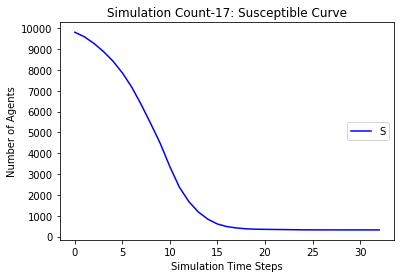

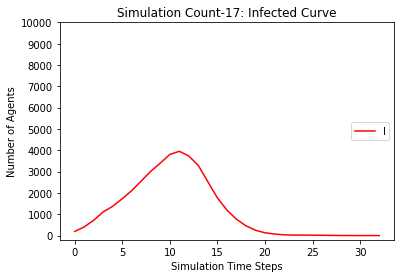

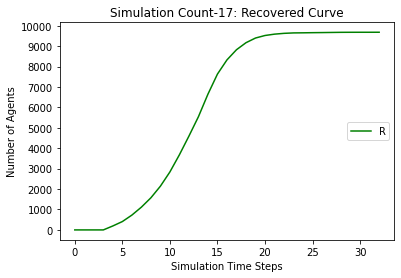

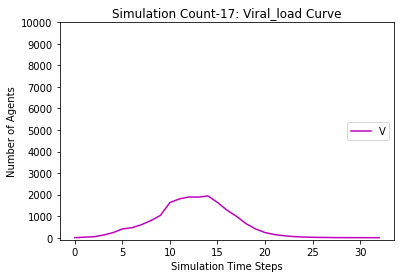

[9806, 9592, 9282, 8820, 8320, 7688, 6865, 5776, 4575, 3482, 2472, 1721, 1195, 887, 695, 561, 490, 439, 403, 380, 363, 349, 340, 338, 336, 334, 331, 331, 331, 331, 331, 330, 330, 330, 329, 329, 329, 329, 328, 328, 327, 327, 327, 327, 327, 327]
[194, 408, 718, 1180, 1486, 1904, 2417, 3044, 3745, 4206, 4393, 4055, 3380, 2595, 1777, 1160, 705, 448, 292, 181, 127, 90, 63, 42, 27, 15, 9, 7, 5, 3, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 0, 0]
[0, 0, 0, 0, 194, 408, 718, 1180, 1680, 2312, 3135, 4224, 5425, 6518, 7528, 8279, 8805, 9113, 9305, 9439, 9510, 9561, 9597, 9620, 9637, 9651, 9660, 9662, 9664, 9666, 9669, 9669, 9669, 9669, 9669, 9670, 9670, 9670, 9671, 9671, 9671, 9671, 9672, 9672, 9673, 9673]
[0.0, 29.0, 54.5, 178.25, 238.125, 365.0625, 601.53125, 898.765625, 1172.3828125, 1482.19140625, 1852.095703125, 2279.0478515625, 2181.52392578125, 1930.761962890625, 1566.3809814453125, 1154.1904907226562, 809.0952453613281, 566.5476226806641, 379.27381134033203, 249.63690567016602, 156.818452

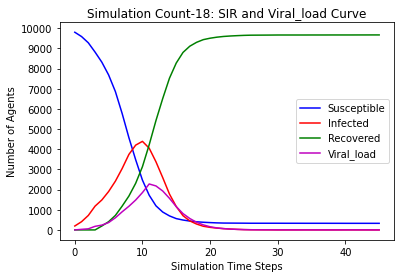

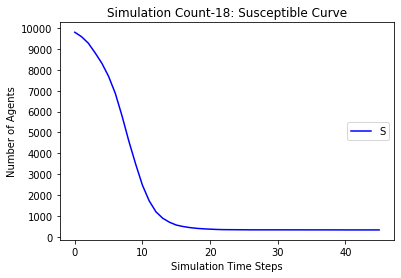

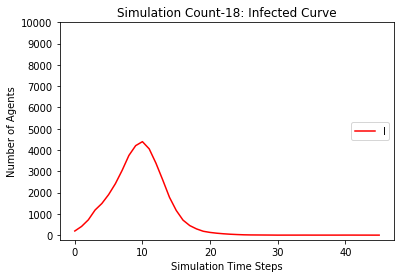

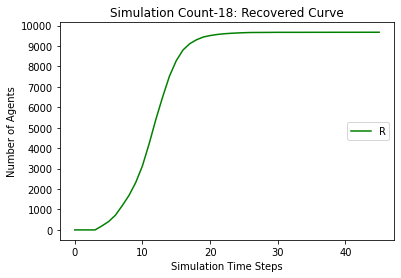

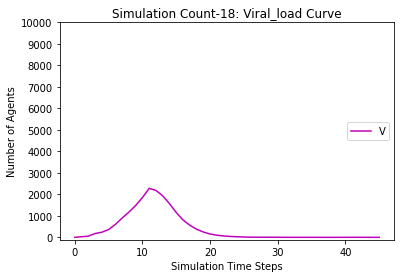

[9806, 9612, 9306, 8911, 8468, 7981, 7383, 6684, 5907, 4964, 3894, 2889, 1960, 1285, 877, 630, 496, 401, 347, 317, 282, 267, 259, 254, 251, 249, 249, 248, 246, 245, 245, 244, 242, 241, 241, 241, 240, 240, 239, 239, 239, 239, 238, 237, 237, 237, 237, 237, 237]
[194, 388, 694, 1089, 1338, 1631, 1923, 2227, 2561, 3017, 3489, 3795, 3947, 3679, 3017, 2259, 1464, 884, 530, 313, 214, 134, 88, 63, 31, 18, 10, 6, 5, 4, 4, 4, 4, 4, 4, 3, 2, 1, 2, 2, 1, 1, 1, 2, 2, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 388, 694, 1089, 1532, 2019, 2617, 3316, 4093, 5036, 6106, 7111, 8040, 8715, 9123, 9370, 9504, 9599, 9653, 9683, 9718, 9733, 9741, 9746, 9749, 9751, 9751, 9752, 9754, 9755, 9755, 9756, 9758, 9759, 9759, 9759, 9760, 9760, 9761, 9761, 9761, 9761, 9762, 9763, 9763]
[0.0, 33.0, 57.5, 130.75, 203.375, 369.6875, 434.84375, 529.421875, 659.7109375, 961.85546875, 1260.927734375, 1596.4638671875, 2038.23193359375, 2162.115966796875, 2086.0579833984375, 1904.0289916992188, 1585.0144958496094, 1199.5072479248047, 861.

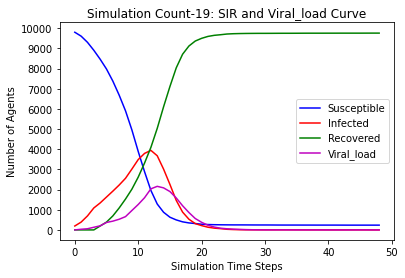

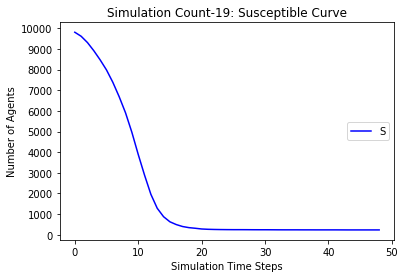

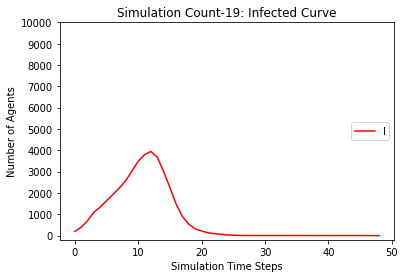

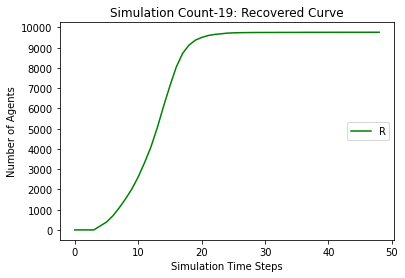

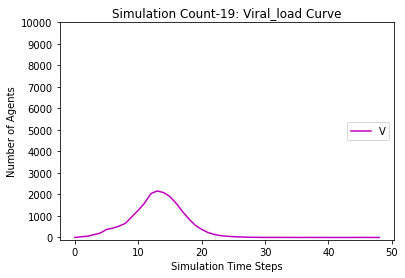

[9806, 9587, 9242, 8791, 8228, 7575, 6782, 5884, 4957, 3921, 2911, 2112, 1460, 1017, 752, 570, 470, 405, 357, 320, 306, 295, 287, 282, 280, 279, 279, 279, 279, 279, 278, 278, 276, 276, 276, 276, 276]
[194, 413, 758, 1209, 1578, 2012, 2460, 2907, 3271, 3654, 3871, 3772, 3497, 2904, 2159, 1542, 990, 612, 395, 250, 164, 110, 70, 38, 26, 16, 8, 3, 1, 0, 1, 1, 3, 3, 2, 2, 0]
[0, 0, 0, 0, 194, 413, 758, 1209, 1772, 2425, 3218, 4116, 5043, 6079, 7089, 7888, 8540, 8983, 9248, 9430, 9530, 9595, 9643, 9680, 9694, 9705, 9713, 9718, 9720, 9721, 9721, 9721, 9721, 9721, 9722, 9722, 9724]
[0.0, 34.0, 75.0, 184.5, 248.25, 413.125, 501.5625, 636.78125, 852.390625, 1218.1953125, 1556.09765625, 1614.048828125, 1831.0244140625, 1835.51220703125, 1672.756103515625, 1331.3780517578125, 1066.6890258789062, 803.3445129394531, 590.6722564697266, 399.3361282348633, 267.66806411743164, 167.83403205871582, 104.91701602935791, 64.45850801467896, 40.22925400733948, 24.11462700366974, 13.05731350183487, 6.5286567509

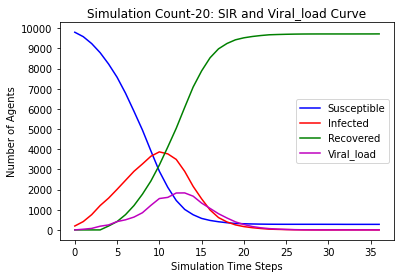

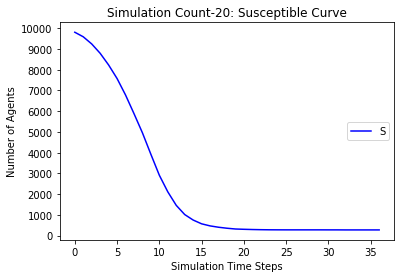

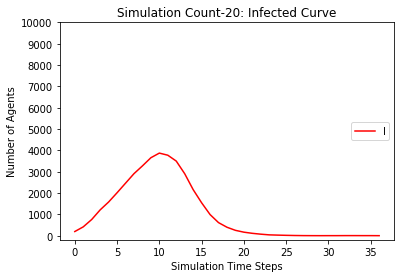

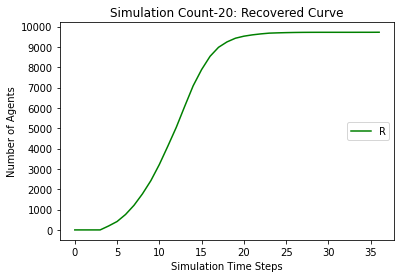

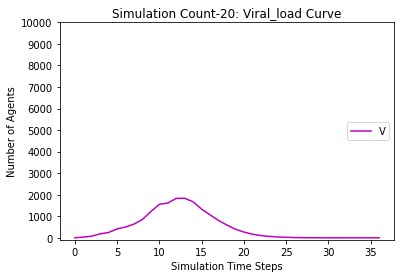

[9806, 9603, 9258, 8909, 8436, 7825, 7119, 6299, 5340, 4197, 3077, 2112, 1361, 890, 617, 457, 367, 319, 288, 272, 262, 254, 247, 243, 241, 239, 238, 237, 235, 233, 233, 233, 233, 233]
[194, 397, 742, 1091, 1370, 1778, 2139, 2610, 3096, 3628, 4042, 4187, 3979, 3307, 2460, 1655, 994, 571, 329, 185, 105, 65, 41, 29, 21, 15, 9, 6, 6, 6, 5, 4, 2, 0]
[0, 0, 0, 0, 194, 397, 742, 1091, 1564, 2175, 2881, 3701, 4660, 5803, 6923, 7888, 8639, 9110, 9383, 9543, 9633, 9681, 9712, 9728, 9738, 9746, 9753, 9757, 9759, 9761, 9762, 9763, 9765, 9767]
[0.0, 27.0, 64.5, 111.25, 248.625, 397.3125, 479.65625, 584.828125, 886.4140625, 1299.20703125, 1692.603515625, 2008.3017578125, 2366.15087890625, 2529.075439453125, 2310.5377197265625, 2021.2688598632812, 1545.6344299316406, 1052.8172149658203, 667.4086074829102, 402.7043037414551, 242.35215187072754, 151.17607593536377, 91.58803796768188, 51.79401898384094, 32.89700949192047, 20.448504745960236, 13.224252372980118, 9.612126186490059, 5.8060630932450294, 4.9

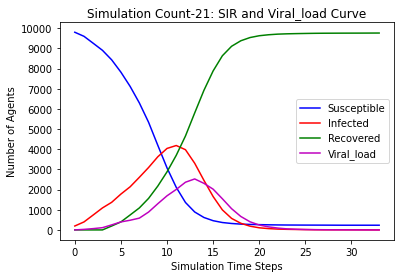

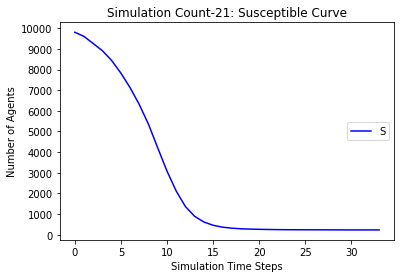

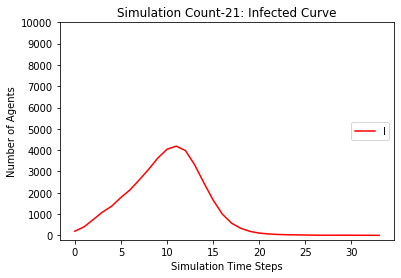

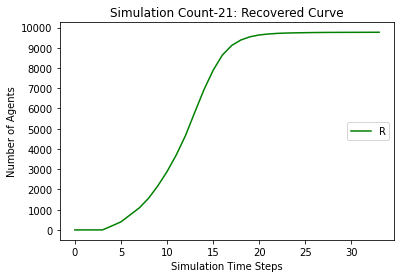

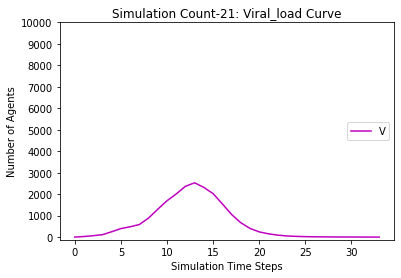

[9806, 9580, 9253, 8869, 8364, 7801, 7065, 6195, 5275, 4165, 3030, 2100, 1397, 930, 621, 431, 327, 278, 242, 221, 207, 199, 191, 186, 185, 184, 183, 183, 183, 183, 183, 182, 182, 182, 182, 181, 181, 181, 181, 180, 180, 180, 179, 179, 179, 178, 178, 178, 176, 176, 176, 176, 176, 176]
[194, 420, 747, 1131, 1442, 1779, 2188, 2674, 3089, 3636, 4035, 4095, 3878, 3235, 2409, 1669, 1070, 652, 379, 210, 120, 79, 51, 35, 22, 15, 8, 3, 2, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 3, 2, 2, 2, 0, 0]
[0, 0, 0, 0, 194, 420, 747, 1131, 1636, 2199, 2935, 3805, 4725, 5835, 6970, 7900, 8603, 9070, 9379, 9569, 9673, 9722, 9758, 9779, 9793, 9801, 9809, 9814, 9815, 9816, 9817, 9817, 9817, 9817, 9817, 9818, 9818, 9818, 9818, 9819, 9819, 9819, 9819, 9820, 9820, 9820, 9821, 9821, 9821, 9822, 9822, 9822, 9824, 9824]
[0.0, 30.0, 56.0, 119.0, 255.5, 331.75, 484.875, 547.4375, 854.71875, 1446.359375, 1813.1796875, 2025.58984375, 2160.794921875, 2216.3974609375, 2160.19873046875, 1889.099365234375, 

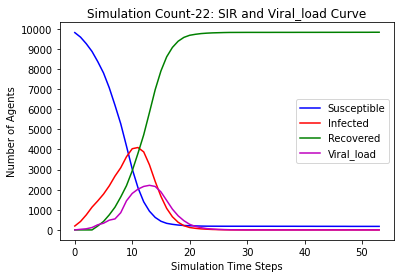

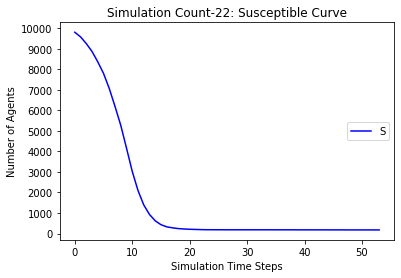

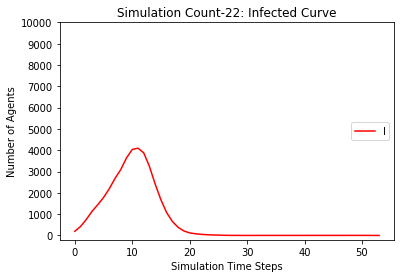

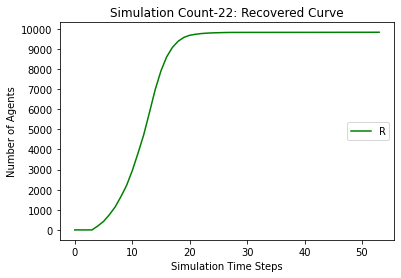

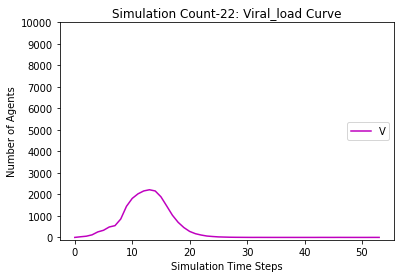

[9806, 9579, 9245, 8862, 8414, 7933, 7333, 6627, 5811, 4786, 3772, 2908, 2229, 1676, 1245, 960, 786, 673, 591, 548, 523, 499, 481, 467, 457, 447, 441, 436, 436, 434, 433, 432, 432, 432, 431, 429, 429, 429, 429, 429]
[194, 421, 755, 1138, 1392, 1646, 1912, 2235, 2603, 3147, 3561, 3719, 3582, 3110, 2527, 1948, 1443, 1003, 654, 412, 263, 174, 110, 81, 66, 52, 40, 31, 21, 13, 8, 4, 4, 2, 2, 3, 3, 3, 2, 0]
[0, 0, 0, 0, 194, 421, 755, 1138, 1586, 2067, 2667, 3373, 4189, 5214, 6228, 7092, 7771, 8324, 8755, 9040, 9214, 9327, 9409, 9452, 9477, 9501, 9519, 9533, 9543, 9553, 9559, 9564, 9564, 9566, 9567, 9568, 9568, 9568, 9569, 9571]
[0.0, 29.0, 58.5, 103.25, 214.625, 298.3125, 454.15625, 534.078125, 710.0390625, 1083.01953125, 1295.509765625, 1340.7548828125, 1418.37744140625, 1568.188720703125, 1622.0943603515625, 1366.0471801757812, 1125.0235900878906, 905.5117950439453, 692.7558975219727, 477.3779487609863, 321.68897438049316, 211.84448719024658, 138.9222435951233, 92.46112179756165, 61.23056

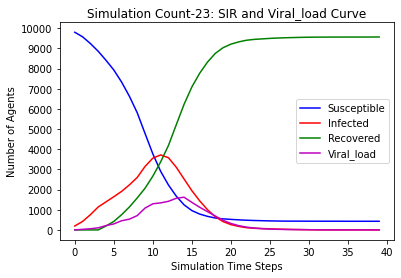

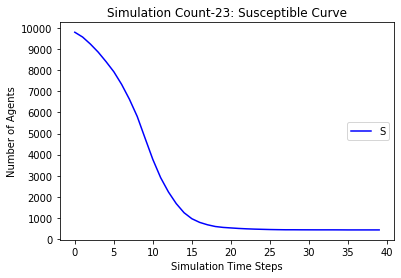

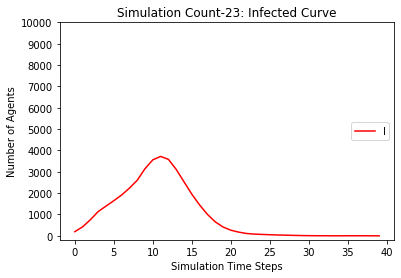

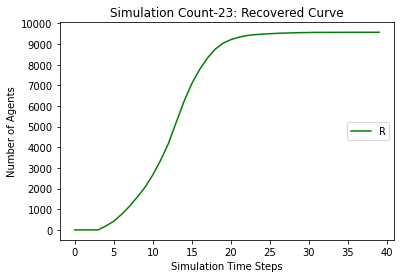

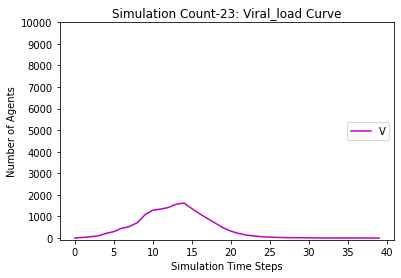

[9806, 9600, 9299, 8893, 8430, 7907, 7288, 6575, 5856, 5119, 4397, 3514, 2741, 2167, 1719, 1377, 1113, 951, 851, 777, 716, 681, 650, 630, 618, 608, 606, 604, 601, 600, 599, 599, 597, 596, 596, 595, 595, 594, 594, 594, 594, 594]
[194, 400, 701, 1107, 1376, 1693, 2011, 2318, 2574, 2788, 2891, 3061, 3115, 2952, 2678, 2137, 1628, 1216, 868, 600, 397, 270, 201, 147, 98, 73, 44, 26, 17, 8, 7, 5, 4, 4, 3, 4, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 194, 400, 701, 1107, 1570, 2093, 2712, 3425, 4144, 4881, 5603, 6486, 7259, 7833, 8281, 8623, 8887, 9049, 9149, 9223, 9284, 9319, 9350, 9370, 9382, 9392, 9394, 9396, 9399, 9400, 9401, 9401, 9403, 9404, 9404, 9405, 9405, 9406]
[0.0, 27.0, 53.5, 129.75, 184.875, 286.4375, 442.21875, 544.109375, 608.0546875, 697.02734375, 797.513671875, 1194.7568359375, 1311.37841796875, 1263.689208984375, 1280.8446044921875, 1243.4223022460938, 1150.7111511230469, 943.3555755615234, 773.6777877807617, 629.8388938903809, 444.91944694519043, 301.4597234725952, 205.7298617362976, 

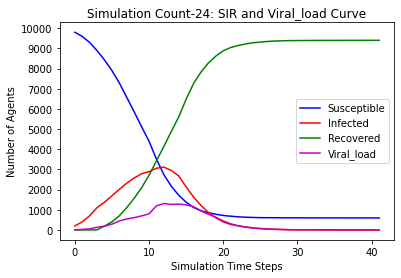

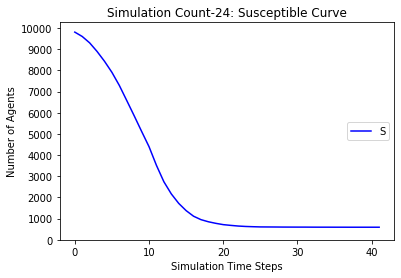

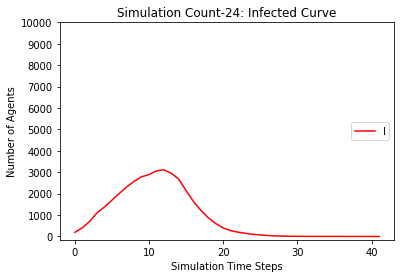

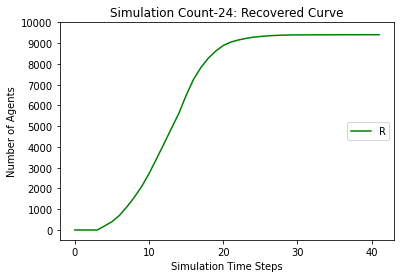

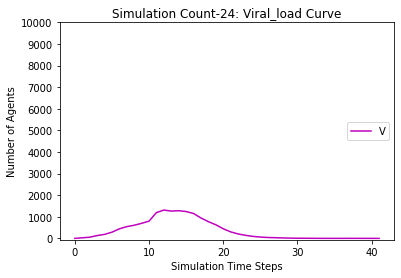

[9806, 9584, 9256, 8850, 8363, 7859, 7219, 6319, 5265, 4184, 3095, 2086, 1372, 933, 695, 508, 412, 351, 309, 280, 265, 257, 246, 239, 237, 234, 234, 233, 233, 232, 231, 231, 231, 230, 229, 229, 227, 226, 226, 226, 226, 226]
[194, 416, 744, 1150, 1443, 1725, 2037, 2531, 3098, 3675, 4124, 4233, 3893, 3251, 2400, 1578, 960, 582, 386, 228, 147, 94, 63, 41, 28, 23, 12, 6, 4, 2, 3, 2, 2, 2, 2, 2, 4, 4, 3, 3, 1, 0]
[0, 0, 0, 0, 194, 416, 744, 1150, 1637, 2141, 2781, 3681, 4735, 5816, 6905, 7914, 8628, 9067, 9305, 9492, 9588, 9649, 9691, 9720, 9735, 9743, 9754, 9761, 9763, 9766, 9766, 9767, 9767, 9768, 9769, 9769, 9769, 9770, 9771, 9771, 9773, 9774]
[0.0, 34.0, 58.0, 134.0, 265.0, 297.5, 445.75, 759.875, 1008.9375, 1338.46875, 1747.234375, 2270.6171875, 2538.30859375, 2565.154296875, 2266.5771484375, 1863.28857421875, 1369.644287109375, 929.8221435546875, 609.9110717773438, 393.9555358886719, 241.97776794433594, 149.98888397216797, 93.99444198608398, 58.99722099304199, 38.498610496520996, 24.2

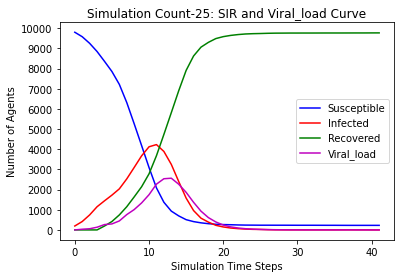

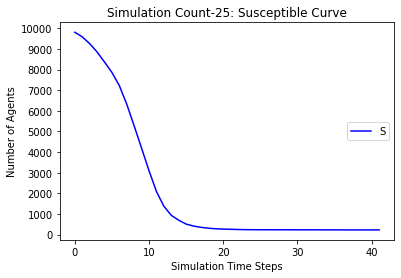

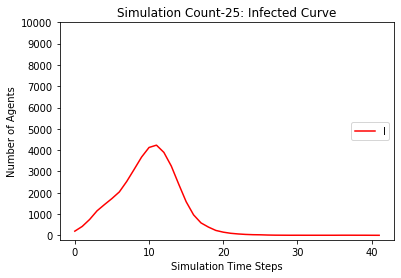

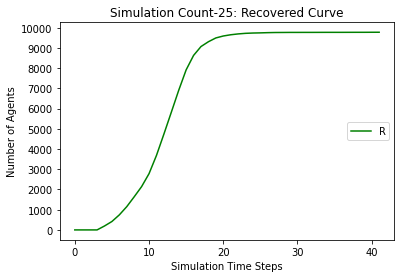

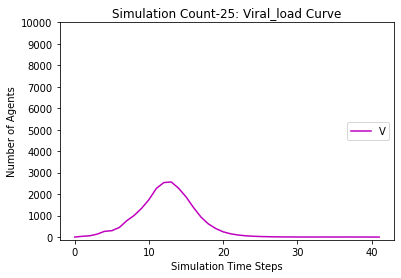

[9806, 9601, 9287, 8900, 8450, 7852, 7136, 6285, 5230, 4061, 2938, 1916, 1209, 765, 546, 426, 358, 315, 301, 289, 274, 267, 262, 261, 260, 257, 257, 255, 255, 255, 255, 255]
[194, 399, 713, 1100, 1356, 1749, 2151, 2615, 3220, 3791, 4198, 4369, 4021, 3296, 2392, 1490, 851, 450, 245, 137, 84, 48, 39, 28, 14, 10, 5, 6, 5, 2, 2, 0]
[0, 0, 0, 0, 194, 399, 713, 1100, 1550, 2148, 2864, 3715, 4770, 5939, 7062, 8084, 8791, 9235, 9454, 9574, 9642, 9685, 9699, 9711, 9726, 9733, 9738, 9739, 9740, 9743, 9743, 9745]
[0.0, 31.0, 56.5, 123.25, 237.625, 414.8125, 480.40625, 646.203125, 995.1015625, 1484.55078125, 1853.275390625, 2396.6376953125, 2691.31884765625, 2591.659423828125, 2206.8297119140625, 1743.4148559570312, 1242.7074279785156, 853.3537139892578, 510.6768569946289, 305.33842849731445, 173.66921424865723, 99.83460712432861, 62.91730356216431, 33.45865178108215, 16.729325890541077, 12.364662945270538, 7.182331472635269, 4.591165736317635, 2.2955828681588173, 1.1477914340794086, 0.57389571703

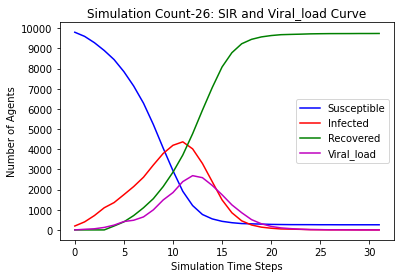

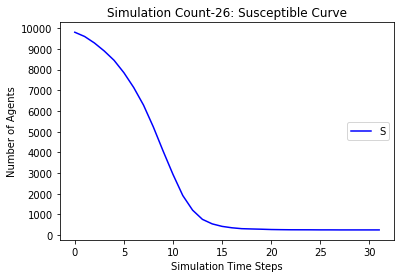

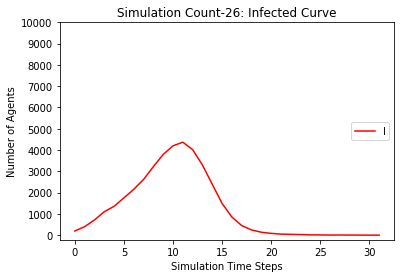

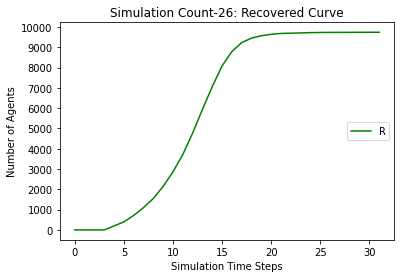

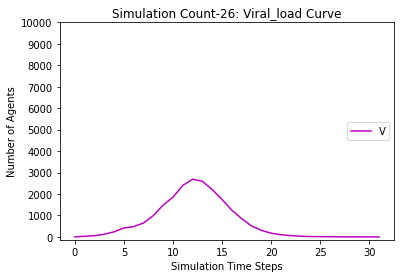

[9806, 9579, 9270, 8898, 8466, 8012, 7471, 6709, 5830, 4883, 3906, 3042, 2283, 1690, 1272, 956, 789, 686, 621, 586, 561, 544, 536, 525, 520, 518, 515, 512, 512, 511, 510, 510, 510, 509, 509, 509, 508, 508, 508, 508, 508, 508]
[194, 421, 730, 1102, 1340, 1567, 1799, 2189, 2636, 3129, 3565, 3667, 3547, 3193, 2634, 2086, 1494, 1004, 651, 370, 228, 142, 85, 61, 41, 26, 21, 13, 8, 7, 5, 2, 2, 2, 1, 1, 2, 1, 1, 1, 0, 0]
[0, 0, 0, 0, 194, 421, 730, 1102, 1534, 1988, 2529, 3291, 4170, 5117, 6094, 6958, 7717, 8310, 8728, 9044, 9211, 9314, 9379, 9414, 9439, 9456, 9464, 9475, 9480, 9482, 9485, 9488, 9488, 9489, 9490, 9490, 9490, 9491, 9491, 9491, 9492, 9492]
[0.0, 34.0, 58.0, 99.0, 219.5, 289.75, 448.875, 679.4375, 718.71875, 901.359375, 1061.6796875, 1284.83984375, 1537.419921875, 1598.7099609375, 1600.35498046875, 1425.177490234375, 1164.5887451171875, 887.2943725585938, 641.6471862792969, 440.82359313964844, 289.4117965698242, 190.7058982849121, 124.35294914245605, 79.17647457122803, 51.588237

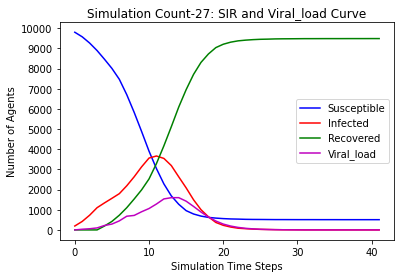

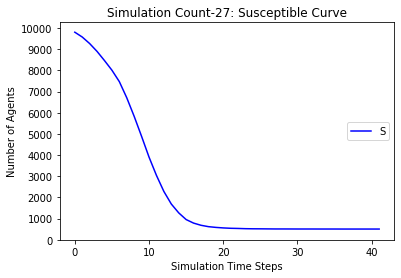

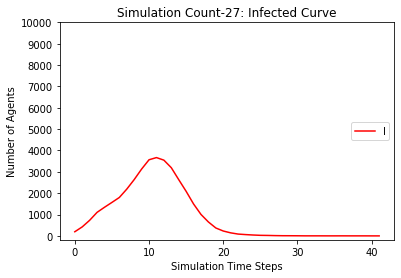

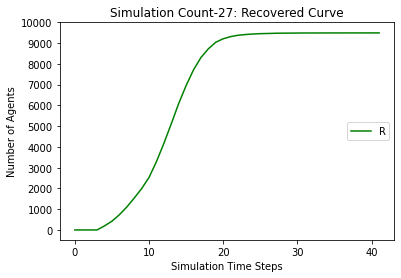

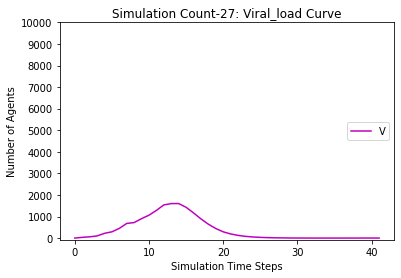

[9806, 9571, 9259, 8869, 8444, 7983, 7347, 6506, 5475, 4351, 3166, 2165, 1452, 1024, 722, 572, 484, 438, 410, 389, 374, 368, 362, 359, 357, 357, 355, 354, 354, 354, 354, 354]
[194, 429, 741, 1131, 1362, 1588, 1912, 2363, 2969, 3632, 4181, 4341, 4023, 3327, 2444, 1593, 968, 586, 312, 183, 110, 70, 48, 30, 17, 11, 7, 5, 3, 3, 1, 0]
[0, 0, 0, 0, 194, 429, 741, 1131, 1556, 2017, 2653, 3494, 4525, 5649, 6834, 7835, 8548, 8976, 9278, 9428, 9516, 9562, 9590, 9611, 9626, 9632, 9638, 9641, 9643, 9643, 9645, 9646]
[0.0, 30.0, 53.0, 97.5, 214.75, 302.375, 455.1875, 692.59375, 985.296875, 1218.6484375, 1638.32421875, 2072.162109375, 2230.0810546875, 2098.04052734375, 2127.020263671875, 1754.5101318359375, 1267.2550659179688, 845.6275329589844, 563.8137664794922, 339.9068832397461, 204.95344161987305, 125.47672080993652, 71.73836040496826, 41.86918020248413, 24.934590101242065, 16.467295050621033, 11.233647525310516, 7.616823762655258, 3.808411881327629, 1.9042059406638145, 0.9521029703319073, 0.47

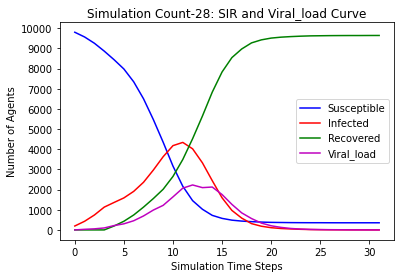

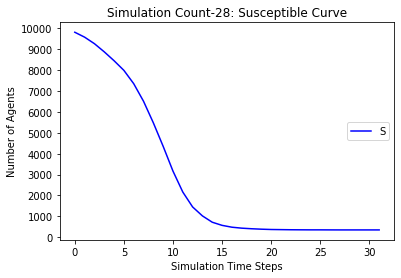

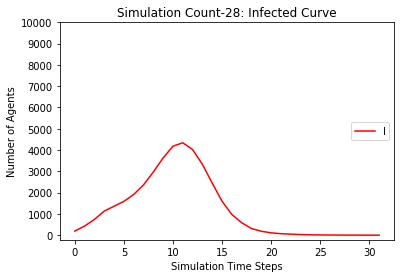

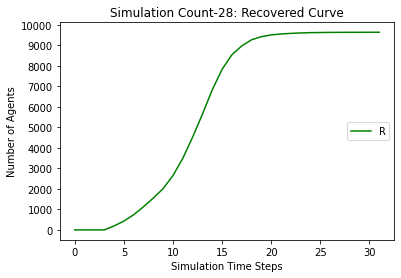

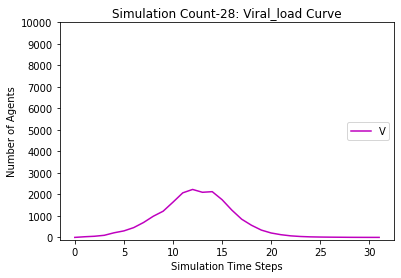

[9806, 9574, 9242, 8859, 8397, 7820, 7029, 6046, 4959, 3750, 2555, 1598, 934, 545, 363, 275, 223, 201, 192, 188, 183, 180, 179, 178, 178, 177, 177, 176, 176, 176, 176, 176]
[194, 426, 758, 1141, 1409, 1754, 2213, 2813, 3438, 4070, 4474, 4448, 4025, 3205, 2192, 1323, 711, 344, 171, 87, 40, 21, 13, 10, 5, 3, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 194, 426, 758, 1141, 1603, 2180, 2971, 3954, 5041, 6250, 7445, 8402, 9066, 9455, 9637, 9725, 9777, 9799, 9808, 9812, 9817, 9820, 9821, 9822, 9822, 9823, 9823, 9824]
[0.0, 31.0, 78.5, 113.25, 203.625, 401.8125, 631.90625, 812.953125, 1029.4765625, 1546.73828125, 2069.369140625, 2494.6845703125, 3028.34228515625, 3053.171142578125, 2645.5855712890625, 2025.7927856445312, 1381.8963928222656, 879.9481964111328, 529.9740982055664, 303.9870491027832, 173.9935245513916, 94.9967622756958, 52.4983811378479, 29.24919056892395, 17.624595284461975, 9.812297642230988, 4.906148821115494, 2.453074410557747, 1.2265372052788734, 0.6132686026394367, 0.30663430131971836, 

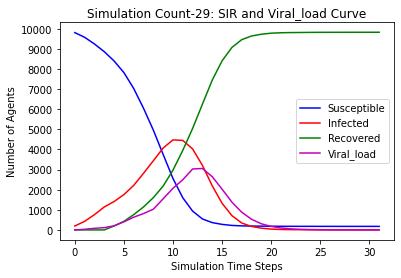

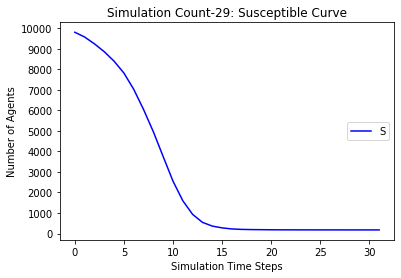

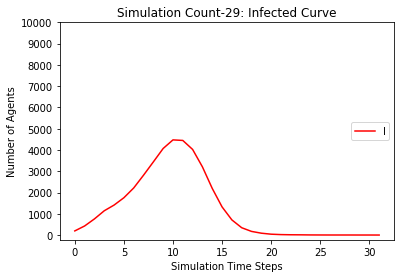

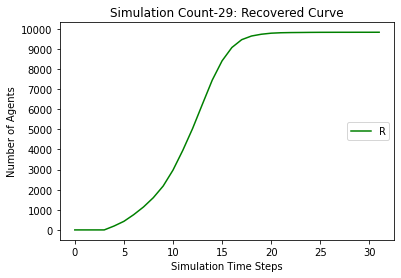

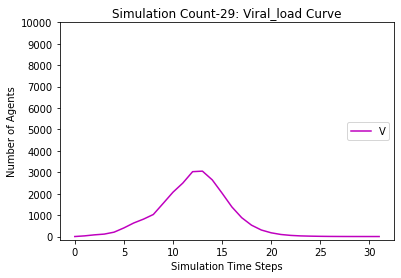

[9806, 9605, 9299, 8901, 8439, 7953, 7427, 6703, 5854, 4777, 3673, 2578, 1634, 977, 649, 446, 335, 290, 271, 250, 239, 235, 229, 228, 225, 224, 223, 221, 220, 220, 219, 219, 218, 217, 217, 217, 217, 216, 216, 216, 216, 216]
[194, 395, 701, 1099, 1367, 1652, 1872, 2198, 2585, 3176, 3754, 4125, 4220, 3800, 3024, 2132, 1299, 687, 378, 196, 96, 55, 42, 22, 14, 11, 6, 7, 5, 4, 4, 2, 2, 3, 2, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 395, 701, 1099, 1561, 2047, 2573, 3297, 4146, 5223, 6327, 7422, 8366, 9023, 9351, 9554, 9665, 9710, 9729, 9750, 9761, 9765, 9771, 9772, 9775, 9776, 9777, 9779, 9780, 9780, 9781, 9781, 9782, 9783, 9783, 9783, 9783, 9784]
[0.0, 28.0, 59.0, 124.5, 217.25, 269.625, 334.8125, 576.40625, 711.203125, 1084.6015625, 1486.30078125, 1857.150390625, 2264.5751953125, 2716.28759765625, 2726.143798828125, 2350.0718994140625, 1879.0359497070312, 1334.5179748535156, 854.2589874267578, 517.1294937133789, 307.56474685668945, 173.78237342834473, 98.89118671417236, 58.44559335708618, 3

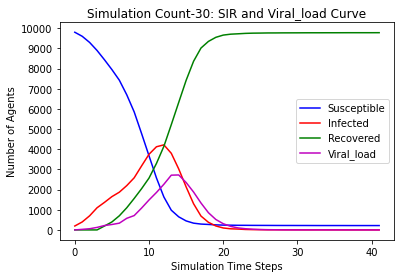

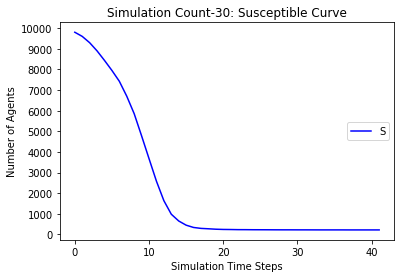

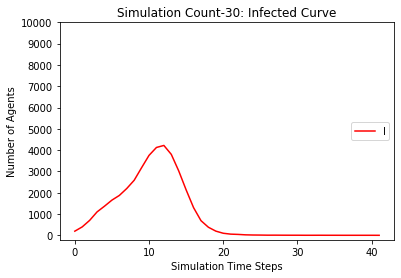

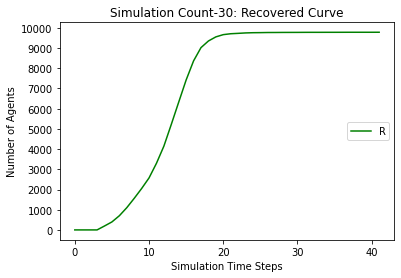

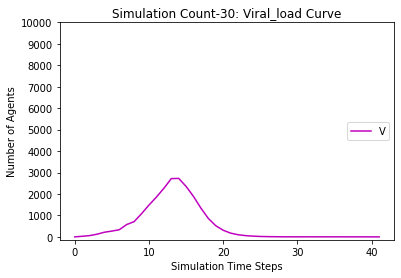

[9806, 9593, 9267, 8859, 8435, 7864, 7127, 6291, 5391, 4382, 3426, 2589, 1956, 1487, 1091, 859, 675, 581, 509, 469, 438, 418, 403, 401, 395, 388, 386, 383, 382, 379, 376, 375, 374, 373, 373, 373, 373, 373]
[194, 407, 733, 1141, 1371, 1729, 2140, 2568, 3044, 3482, 3701, 3702, 3435, 2895, 2335, 1730, 1281, 906, 582, 390, 237, 163, 106, 68, 43, 30, 17, 18, 13, 9, 10, 8, 8, 6, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 407, 733, 1141, 1565, 2136, 2873, 3709, 4609, 5618, 6574, 7411, 8044, 8513, 8909, 9141, 9325, 9419, 9491, 9531, 9562, 9582, 9597, 9599, 9605, 9612, 9614, 9617, 9618, 9621, 9624, 9625, 9626, 9627]
[0.0, 26.0, 54.0, 126.0, 191.0, 360.5, 518.25, 668.125, 843.0625, 1066.53125, 1303.265625, 1481.6328125, 1547.81640625, 1616.908203125, 1628.4541015625, 1453.22705078125, 1191.613525390625, 902.8067626953125, 733.4033813476562, 504.7016906738281, 339.35084533691406, 224.67542266845703, 136.33771133422852, 89.16885566711426, 56.58442783355713, 36.292213916778564, 26.146106958389282, 17.0730534791

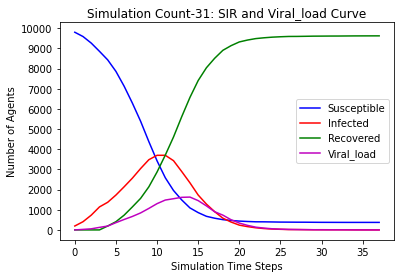

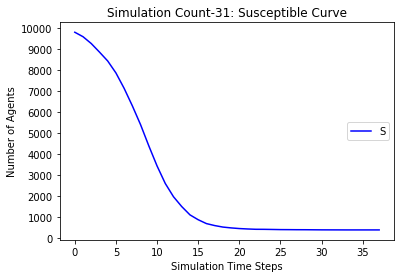

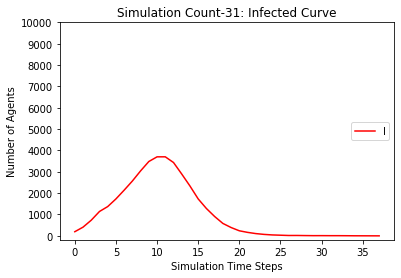

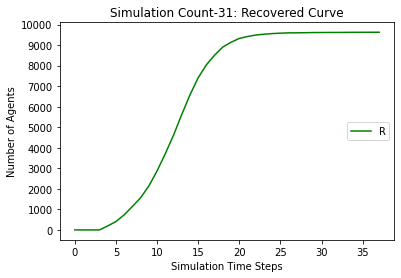

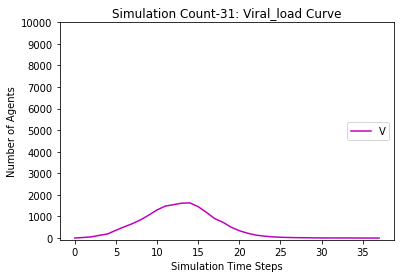

[9806, 9590, 9262, 8850, 8384, 7770, 7103, 6284, 5174, 3899, 2717, 1646, 979, 597, 397, 290, 235, 209, 194, 186, 182, 176, 176, 176, 176, 176, 176, 176, 176, 176]
[194, 410, 738, 1150, 1422, 1820, 2159, 2566, 3210, 3871, 4386, 4638, 4195, 3302, 2320, 1356, 744, 388, 203, 104, 53, 33, 18, 10, 6, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 194, 410, 738, 1150, 1616, 2230, 2897, 3716, 4826, 6101, 7283, 8354, 9021, 9403, 9603, 9710, 9765, 9791, 9806, 9814, 9818, 9824, 9824, 9824, 9824, 9824]
[0.0, 29.0, 66.5, 122.25, 182.125, 394.0625, 501.03125, 649.515625, 1079.7578125, 1653.87890625, 2127.939453125, 2644.9697265625, 2975.48486328125, 2970.742431640625, 2660.3712158203125, 2115.1856079101562, 1498.5928039550781, 921.2964019775391, 550.6482009887695, 314.32410049438477, 180.16205024719238, 97.08102512359619, 51.540512561798096, 28.770256280899048, 15.385128140449524, 8.692564070224762, 4.346282035112381, 2.1731410175561905, 1.0865705087780952, 0.5432852543890476]
[[], [9806, 9581, 9268, 8832, 8386, 7925,

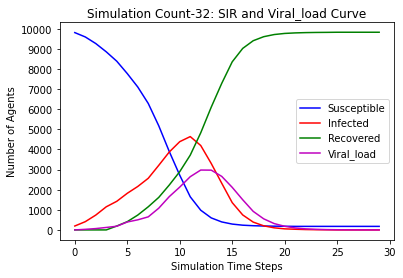

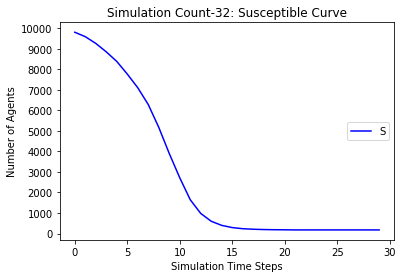

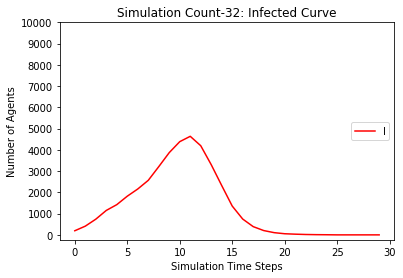

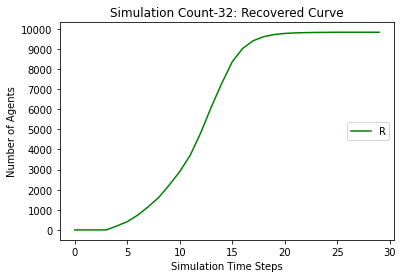

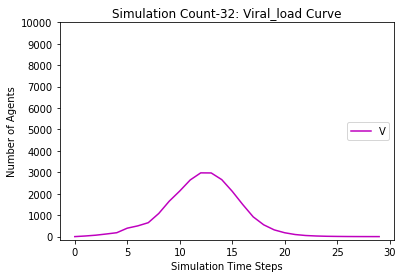

[9806, 9586, 9267, 8859, 8408, 7842, 7116, 6227, 5284, 4227, 3128, 2072, 1294, 831, 580, 419, 323, 274, 232, 211, 198, 187, 181, 174, 171, 168, 166, 164, 162, 162, 161, 160, 160, 160, 160, 160]
[194, 414, 733, 1141, 1398, 1744, 2151, 2632, 3124, 3615, 3988, 4155, 3990, 3396, 2548, 1653, 971, 557, 348, 208, 125, 87, 51, 37, 27, 19, 15, 10, 9, 6, 5, 4, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 414, 733, 1141, 1592, 2158, 2884, 3773, 4716, 5773, 6872, 7928, 8706, 9169, 9420, 9581, 9677, 9726, 9768, 9789, 9802, 9813, 9819, 9826, 9829, 9832, 9834, 9836, 9838, 9838, 9839, 9840]
[0.0, 30.0, 53.0, 120.5, 174.25, 368.125, 503.0625, 722.53125, 939.265625, 1163.6328125, 1711.81640625, 2308.908203125, 2530.4541015625, 2440.22705078125, 2343.113525390625, 2139.5567626953125, 1621.7783813476562, 1103.8891906738281, 722.9445953369141, 472.47229766845703, 302.2361488342285, 192.11807441711426, 125.05903720855713, 75.52951860427856, 46.76475930213928, 29.38237965106964, 21.69118982553482, 13.84559491276741, 8.9227

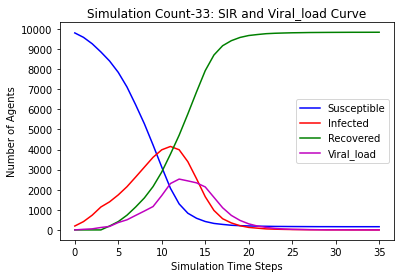

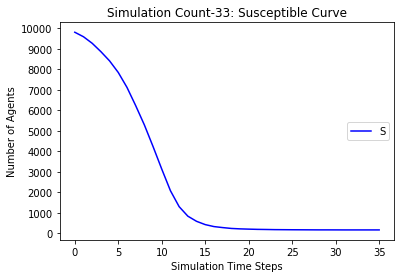

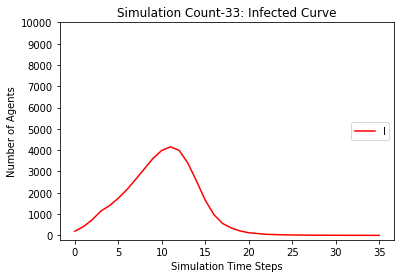

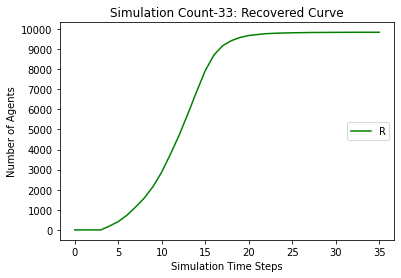

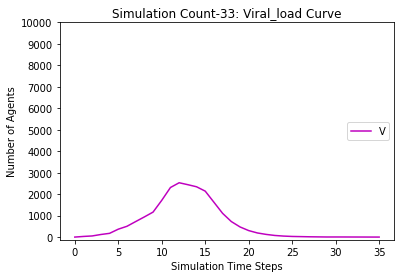

[9806, 9604, 9267, 8938, 8546, 8142, 7649, 7061, 6300, 5532, 4700, 3814, 3002, 2327, 1816, 1376, 1058, 860, 734, 643, 581, 552, 521, 504, 495, 491, 490, 490, 489, 489, 488, 488, 487, 486, 484, 483, 482, 481, 481, 481, 481, 481]
[194, 396, 733, 1062, 1260, 1462, 1618, 1877, 2246, 2610, 2949, 3247, 3298, 3205, 2884, 2438, 1944, 1467, 1082, 733, 477, 308, 213, 139, 86, 61, 31, 14, 6, 2, 2, 2, 2, 3, 4, 5, 5, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 396, 733, 1062, 1454, 1858, 2351, 2939, 3700, 4468, 5300, 6186, 6998, 7673, 8184, 8624, 8942, 9140, 9266, 9357, 9419, 9448, 9479, 9496, 9505, 9509, 9510, 9510, 9511, 9511, 9512, 9512, 9513, 9514, 9516, 9517, 9518, 9519]
[0.0, 27.0, 53.5, 100.75, 167.375, 266.6875, 389.34375, 459.671875, 569.8359375, 658.91796875, 859.458984375, 1102.7294921875, 1254.36474609375, 1368.182373046875, 1371.0911865234375, 1375.5455932617188, 1313.7727966308594, 1148.8863983154297, 931.4431991577148, 742.7215995788574, 526.3607997894287, 365.18039989471436, 246.59019994735718

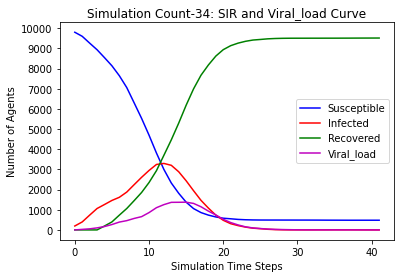

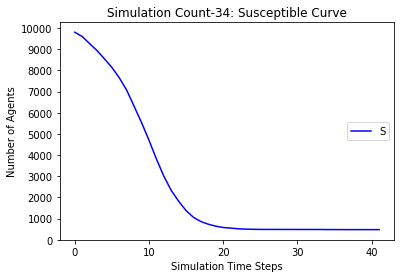

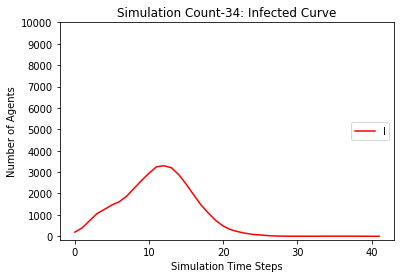

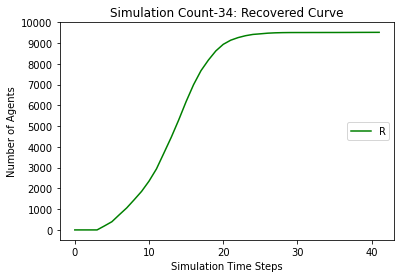

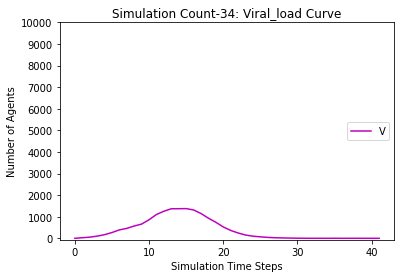

[9806, 9581, 9248, 8851, 8397, 7825, 7003, 6022, 4753, 3533, 2397, 1547, 1003, 698, 531, 432, 377, 347, 331, 323, 317, 310, 308, 306, 304, 303, 303, 303, 302, 301, 299, 299, 299, 298, 297, 296, 296, 294, 293, 292, 292, 292, 292, 292]
[194, 419, 752, 1149, 1409, 1756, 2245, 2829, 3644, 4292, 4606, 4475, 3750, 2835, 1866, 1115, 626, 351, 200, 109, 60, 37, 23, 17, 13, 7, 5, 3, 2, 2, 4, 4, 3, 3, 2, 3, 3, 4, 4, 4, 4, 2, 1, 0]
[0, 0, 0, 0, 194, 419, 752, 1149, 1603, 2175, 2997, 3978, 5247, 6467, 7603, 8453, 8997, 9302, 9469, 9568, 9623, 9653, 9669, 9677, 9683, 9690, 9692, 9694, 9696, 9697, 9697, 9697, 9698, 9699, 9701, 9701, 9701, 9702, 9703, 9704, 9704, 9706, 9707, 9708]
[0.0, 30.0, 65.0, 119.5, 222.75, 380.375, 604.1875, 802.09375, 1364.046875, 1701.0234375, 2123.51171875, 2507.755859375, 2616.8779296875, 2452.43896484375, 2167.219482421875, 1605.6097412109375, 1077.8048706054688, 684.9024353027344, 423.4512176513672, 255.7256088256836, 155.8628044128418, 88.9314022064209, 57.4657011032104

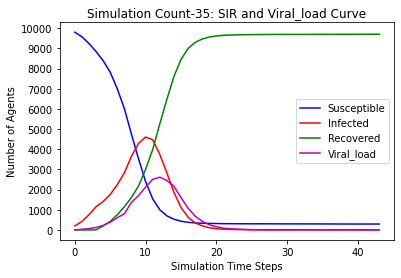

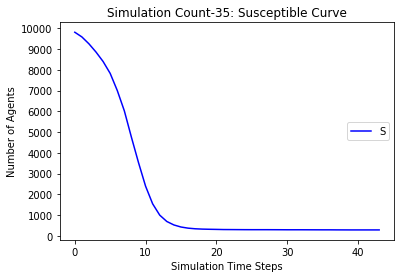

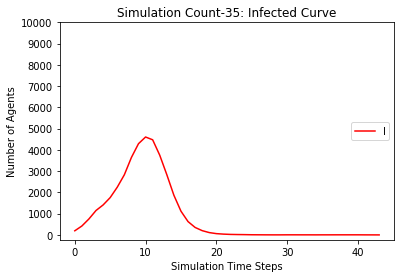

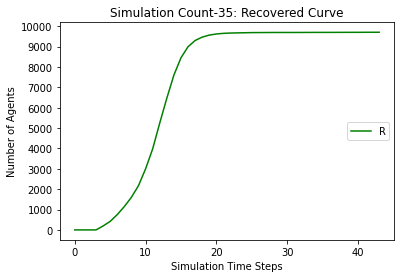

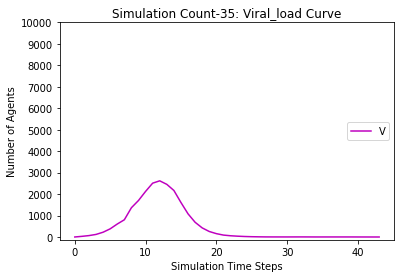

[9806, 9572, 9231, 8793, 8296, 7702, 7031, 6199, 5260, 4246, 3318, 2537, 1883, 1399, 1053, 803, 648, 533, 465, 429, 404, 393, 387, 383, 379, 374, 374, 373, 371, 371, 370, 370, 370, 370, 370]
[194, 428, 769, 1207, 1510, 1870, 2200, 2594, 3036, 3456, 3713, 3662, 3377, 2847, 2265, 1734, 1235, 866, 588, 374, 244, 140, 78, 46, 25, 19, 13, 10, 8, 3, 4, 3, 1, 1, 0]
[0, 0, 0, 0, 194, 428, 769, 1207, 1704, 2298, 2969, 3801, 4740, 5754, 6682, 7463, 8117, 8601, 8947, 9197, 9352, 9467, 9535, 9571, 9596, 9607, 9613, 9617, 9621, 9626, 9626, 9627, 9629, 9629, 9630]
[0.0, 29.0, 69.5, 161.75, 224.875, 376.4375, 499.21875, 621.609375, 898.8046875, 1118.40234375, 1320.201171875, 1460.1005859375, 1614.05029296875, 1662.025146484375, 1587.0125732421875, 1361.5062866210938, 1071.7531433105469, 872.8765716552734, 622.4382858276367, 440.21914291381836, 303.1095714569092, 214.5547857284546, 140.2773928642273, 91.13869643211365, 52.569348216056824, 31.284674108028412, 17.642337054014206, 9.821168527007103, 6.91

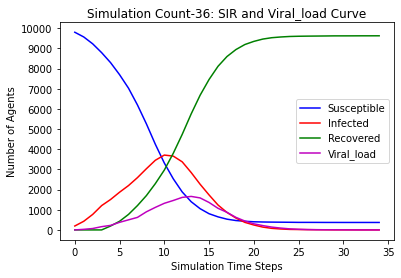

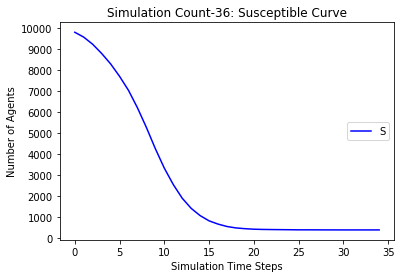

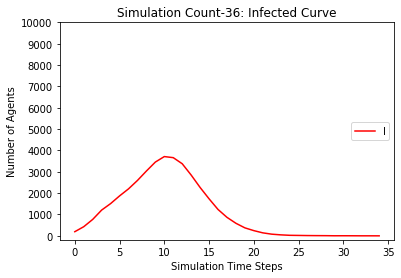

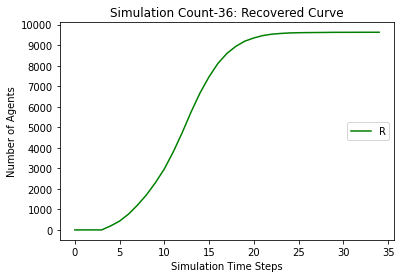

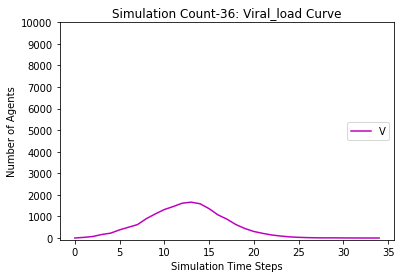

[9806, 9565, 9213, 8800, 8303, 7675, 6797, 5896, 4934, 3990, 3099, 2318, 1741, 1310, 1041, 851, 725, 649, 587, 544, 519, 503, 496, 487, 482, 476, 472, 468, 468, 468, 466, 465, 464, 463, 463, 463, 463, 463, 463]
[194, 435, 787, 1200, 1503, 1890, 2416, 2904, 3369, 3685, 3698, 3578, 3193, 2680, 2058, 1467, 1016, 661, 454, 307, 206, 146, 91, 57, 37, 27, 24, 19, 14, 8, 6, 3, 4, 5, 3, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 435, 787, 1200, 1697, 2325, 3203, 4104, 5066, 6010, 6901, 7682, 8259, 8690, 8959, 9149, 9275, 9351, 9413, 9456, 9481, 9497, 9504, 9513, 9518, 9524, 9528, 9532, 9532, 9532, 9534, 9535, 9536, 9537, 9537]
[0.0, 33.0, 75.5, 130.75, 245.375, 448.6875, 652.34375, 752.171875, 1019.0859375, 1116.54296875, 1434.271484375, 1651.1357421875, 1531.56787109375, 1576.783935546875, 1421.3919677734375, 1300.6959838867188, 1036.3479919433594, 757.1739959716797, 518.5869979858398, 340.2934989929199, 240.14674949645996, 147.07337474822998, 94.53668737411499, 62.268343687057495, 37.13417184352875, 21.5

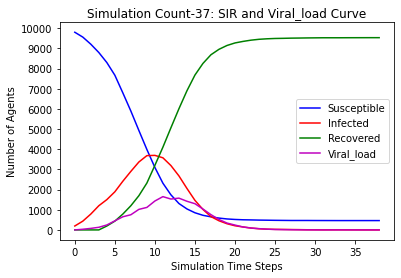

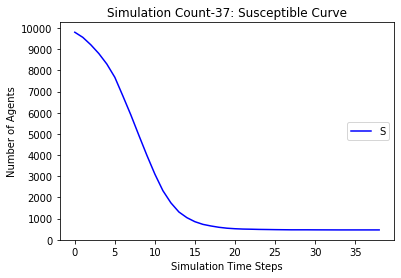

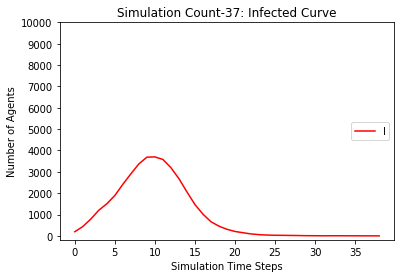

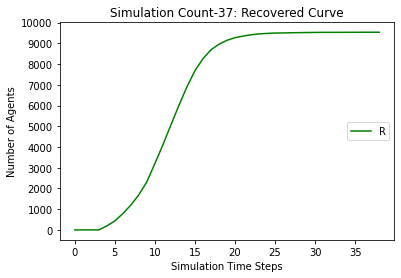

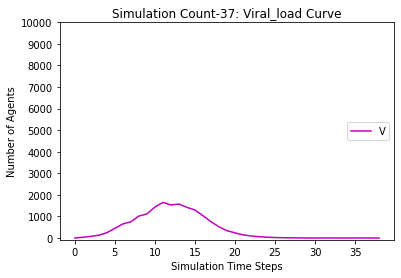

[9806, 9583, 9240, 8870, 8383, 7829, 7164, 6338, 5203, 3999, 2844, 1901, 1233, 766, 538, 399, 321, 285, 275, 261, 251, 246, 242, 239, 238, 237, 237, 237, 237, 237, 237]
[194, 417, 760, 1130, 1423, 1754, 2076, 2532, 3180, 3830, 4320, 4437, 3970, 3233, 2306, 1502, 912, 481, 263, 138, 70, 39, 33, 22, 13, 9, 5, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 417, 760, 1130, 1617, 2171, 2836, 3662, 4797, 6001, 7156, 8099, 8767, 9234, 9462, 9601, 9679, 9715, 9725, 9739, 9749, 9754, 9758, 9761, 9762, 9763, 9763]
[0.0, 32.0, 72.0, 112.0, 238.0, 338.0, 429.0, 682.5, 1089.25, 1304.625, 1661.3125, 2056.65625, 2482.328125, 2519.1640625, 2304.58203125, 1884.291015625, 1415.1455078125, 1004.57275390625, 644.286376953125, 394.1431884765625, 236.07159423828125, 137.03579711914062, 74.51789855957031, 43.258949279785156, 28.629474639892578, 15.314737319946289, 8.657368659973145, 4.328684329986572, 2.164342164993286, 1.082171082496643, 0.5410855412483215]
[[], [9806, 9581, 9268, 8832, 8386, 7925, 7202, 6274, 5242, 4221, 3

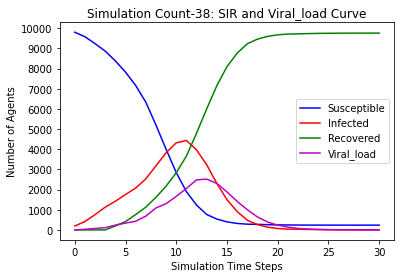

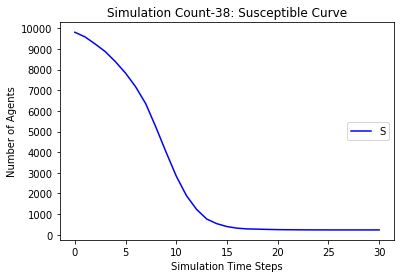

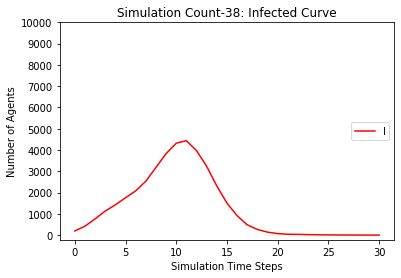

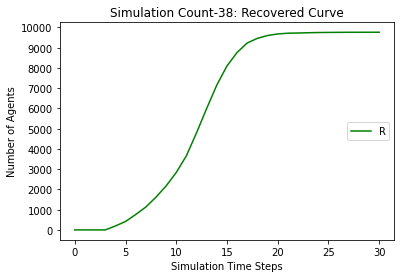

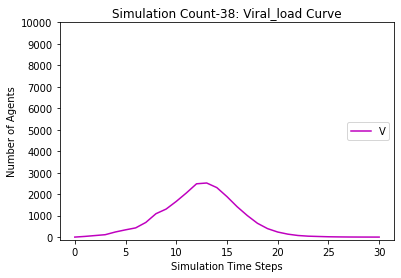

[9806, 9598, 9291, 8925, 8501, 8001, 7215, 6352, 5445, 4589, 3792, 3004, 2302, 1672, 1262, 969, 793, 671, 587, 532, 502, 488, 473, 461, 452, 445, 443, 430, 424, 422, 421, 418, 417, 417, 417, 417, 417]
[194, 402, 709, 1075, 1305, 1597, 2076, 2573, 3056, 3412, 3423, 3348, 3143, 2917, 2530, 2035, 1509, 1001, 675, 437, 291, 183, 114, 71, 50, 43, 30, 31, 28, 23, 22, 12, 7, 5, 4, 1, 0]
[0, 0, 0, 0, 194, 402, 709, 1075, 1499, 1999, 2785, 3648, 4555, 5411, 6208, 6996, 7698, 8328, 8738, 9031, 9207, 9329, 9413, 9468, 9498, 9512, 9527, 9539, 9548, 9555, 9557, 9570, 9576, 9578, 9579, 9582, 9583]
[0.0, 27.0, 53.5, 102.75, 212.375, 346.1875, 555.09375, 595.546875, 727.7734375, 903.88671875, 998.943359375, 1287.4716796875, 1461.73583984375, 1607.867919921875, 1615.9339599609375, 1475.9669799804688, 1238.9834899902344, 920.4917449951172, 681.2458724975586, 481.6229362487793, 339.81146812438965, 227.90573406219482, 155.9528670310974, 115.9764335155487, 74.98821675777435, 49.49410837888718, 35.747054189

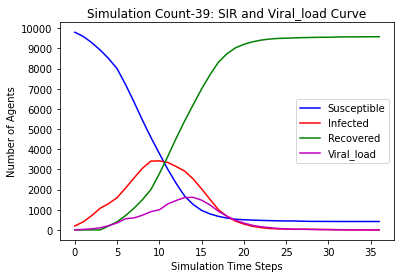

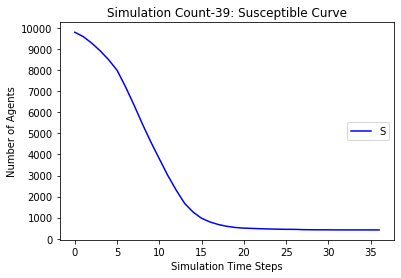

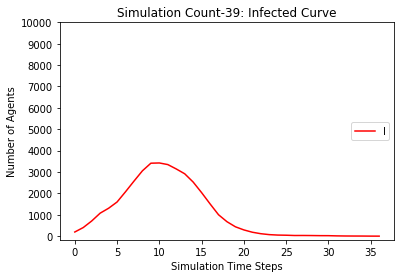

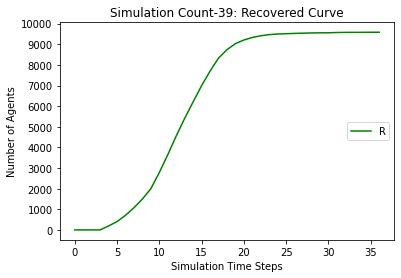

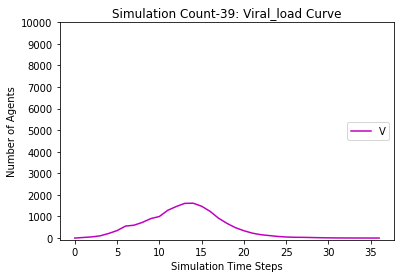

[9806, 9591, 9292, 8914, 8459, 7988, 7309, 6443, 5493, 4457, 3334, 2324, 1630, 1128, 819, 637, 514, 449, 389, 357, 328, 312, 295, 289, 284, 281, 276, 273, 270, 269, 269, 269, 269, 269]
[194, 409, 708, 1086, 1347, 1603, 1983, 2471, 2966, 3531, 3975, 4119, 3863, 3329, 2515, 1687, 1116, 679, 430, 280, 186, 137, 94, 68, 44, 31, 19, 16, 14, 12, 7, 4, 1, 0]
[0, 0, 0, 0, 194, 409, 708, 1086, 1541, 2012, 2691, 3557, 4507, 5543, 6666, 7676, 8370, 8872, 9181, 9363, 9486, 9551, 9611, 9643, 9672, 9688, 9705, 9711, 9716, 9719, 9724, 9727, 9730, 9731]
[0.0, 29.0, 47.5, 111.75, 200.875, 295.4375, 513.71875, 705.859375, 862.9296875, 1177.46484375, 1631.732421875, 1958.8662109375, 2090.43310546875, 2224.216552734375, 2036.1082763671875, 1680.0541381835938, 1340.0270690917969, 997.0135345458984, 665.5067672729492, 445.7533836364746, 290.8766918182373, 186.43834590911865, 119.21917295455933, 78.60958647727966, 49.30479323863983, 29.652396619319916, 20.826198309659958, 16.41309915482998, 12.20654957741499

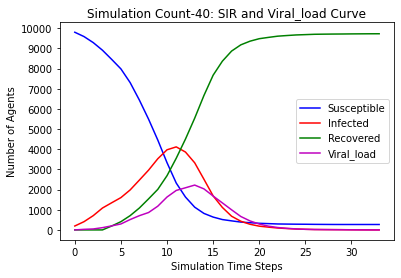

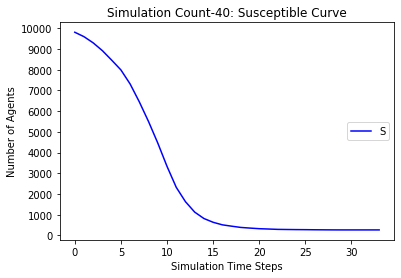

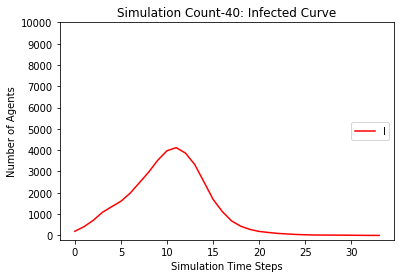

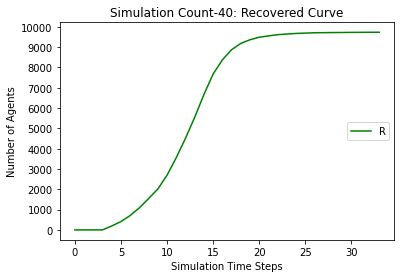

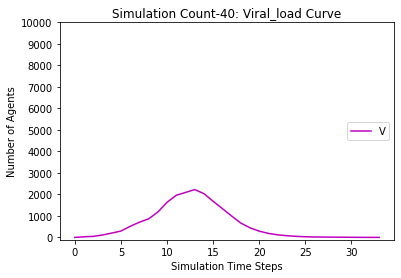

[9806, 9593, 9246, 8817, 8288, 7626, 6794, 5824, 4771, 3675, 2625, 1700, 1061, 662, 449, 330, 253, 233, 216, 212, 205, 202, 201, 200, 198, 197, 197, 197, 197, 197, 197]
[194, 407, 754, 1183, 1518, 1967, 2452, 2993, 3517, 3951, 4169, 4124, 3710, 3013, 2176, 1370, 808, 429, 233, 118, 48, 31, 15, 12, 7, 5, 4, 3, 1, 0, 0]
[0, 0, 0, 0, 194, 407, 754, 1183, 1712, 2374, 3206, 4176, 5229, 6325, 7375, 8300, 8939, 9338, 9551, 9670, 9747, 9767, 9784, 9788, 9795, 9798, 9799, 9800, 9802, 9803, 9803]
[0.0, 33.0, 70.5, 157.25, 285.625, 415.8125, 578.90625, 878.453125, 1113.2265625, 1517.61328125, 1873.806640625, 2255.9033203125, 2609.95166015625, 2593.975830078125, 2280.9879150390625, 1777.4939575195312, 1297.7469787597656, 845.8734893798828, 507.9367446899414, 303.9683723449707, 178.98418617248535, 98.49209308624268, 54.24604654312134, 28.12302327156067, 16.061511635780334, 9.030755817890167, 6.515377908945084, 4.257688954472542, 3.128844477236271, 1.5644222386181355, 0.7822111193090677]
[[], [9806,

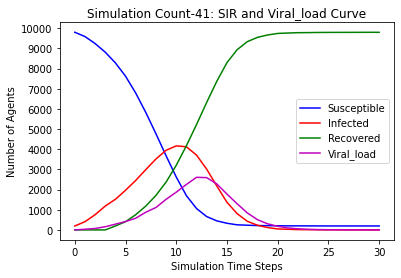

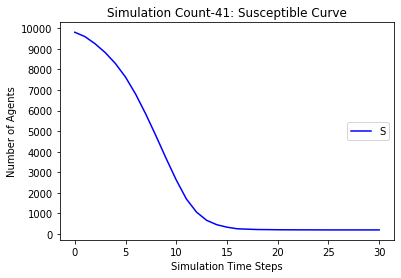

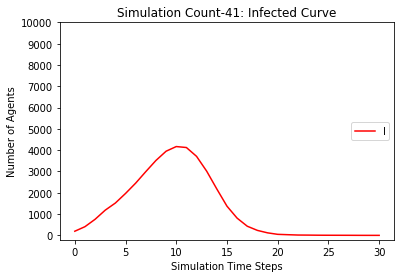

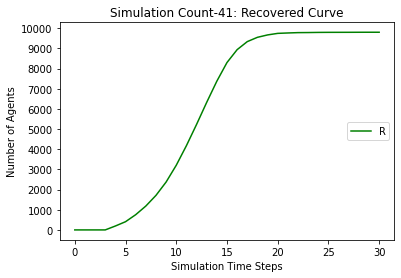

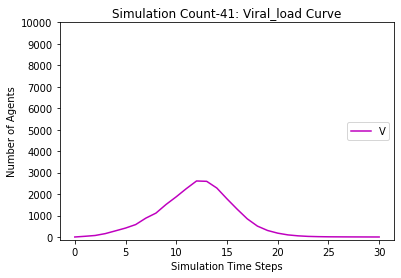

[9806, 9600, 9266, 8878, 8413, 7805, 7058, 6156, 5175, 4143, 3182, 2312, 1526, 1053, 757, 580, 481, 426, 387, 361, 349, 338, 335, 331, 328, 327, 324, 323, 321, 319, 319, 319, 319, 319]
[194, 400, 734, 1122, 1393, 1795, 2208, 2722, 3238, 3662, 3876, 3844, 3649, 3090, 2425, 1732, 1045, 627, 370, 219, 132, 88, 52, 30, 21, 11, 11, 8, 7, 8, 5, 4, 2, 0]
[0, 0, 0, 0, 194, 400, 734, 1122, 1587, 2195, 2942, 3844, 4825, 5857, 6818, 7688, 8474, 8947, 9243, 9420, 9519, 9574, 9613, 9639, 9651, 9662, 9665, 9669, 9672, 9673, 9676, 9677, 9679, 9681]
[0.0, 32.0, 56.0, 119.0, 232.5, 405.25, 486.625, 677.3125, 879.65625, 1201.828125, 1488.9140625, 1735.45703125, 2062.728515625, 1943.3642578125, 1755.68212890625, 1506.841064453125, 1152.4205322265625, 838.2102661132812, 538.1051330566406, 341.0525665283203, 213.52628326416016, 132.76314163208008, 76.38157081604004, 42.19078540802002, 25.09539270401001, 13.547696352005005, 6.773848176002502, 6.386924088001251, 6.193462044000626, 4.096731022000313, 4.048365

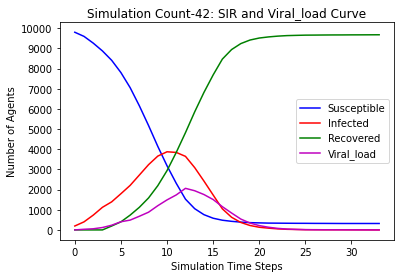

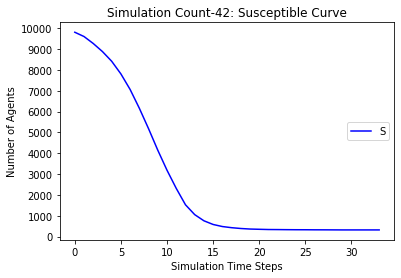

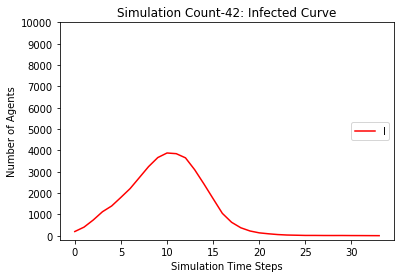

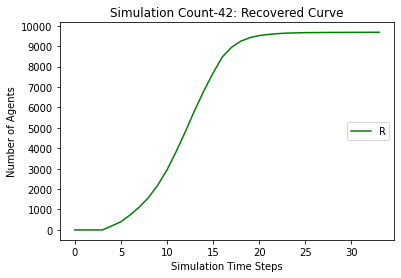

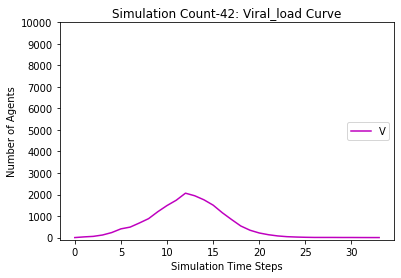

[9806, 9591, 9263, 8877, 8454, 8019, 7423, 6719, 5835, 4877, 3898, 3034, 2216, 1529, 1047, 755, 557, 463, 415, 371, 346, 331, 324, 322, 319, 318, 317, 316, 316, 316, 316, 315, 313, 312, 311, 310, 309, 309, 309, 309, 309]
[194, 409, 737, 1123, 1352, 1572, 1840, 2158, 2619, 3142, 3525, 3685, 3619, 3348, 2851, 2279, 1659, 1066, 632, 384, 211, 132, 91, 49, 27, 13, 7, 6, 3, 2, 1, 1, 3, 4, 5, 5, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 409, 737, 1123, 1546, 1981, 2577, 3281, 4165, 5123, 6102, 6966, 7784, 8471, 8953, 9245, 9443, 9537, 9585, 9629, 9654, 9669, 9676, 9678, 9681, 9682, 9683, 9684, 9684, 9684, 9684, 9685, 9687, 9688, 9689, 9690, 9691]
[0.0, 34.0, 60.0, 112.0, 212.0, 276.0, 460.0, 568.0, 750.0, 907.0, 1108.5, 1432.25, 1703.125, 1857.5625, 1915.78125, 1857.890625, 1582.9453125, 1232.47265625, 909.236328125, 587.6181640625, 370.80908203125, 227.404541015625, 134.7022705078125, 79.35113525390625, 54.675567626953125, 35.33778381347656, 19.66889190673828, 10.83444595336914, 7.41722297668457, 3.

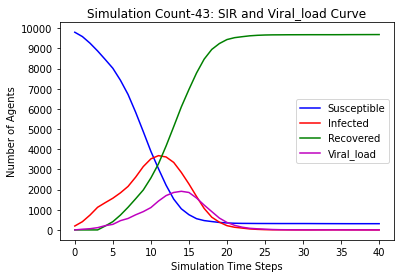

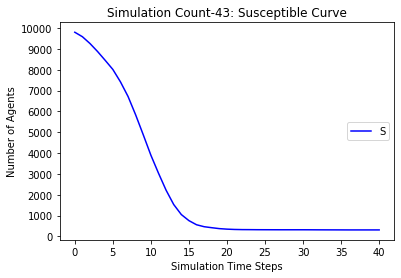

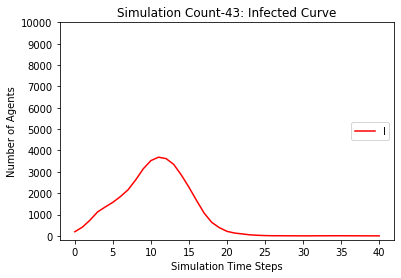

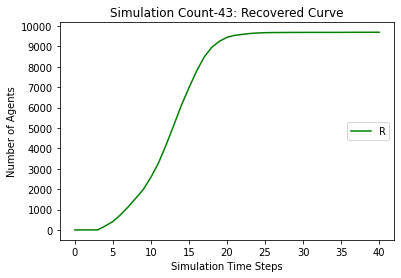

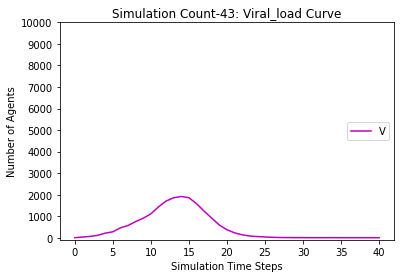

[9806, 9596, 9257, 8814, 8281, 7633, 6836, 5864, 4723, 3461, 2381, 1576, 1059, 743, 569, 447, 346, 289, 259, 232, 213, 205, 200, 199, 197, 195, 194, 194, 194, 193, 193, 193, 193, 193]
[194, 404, 743, 1186, 1525, 1963, 2421, 2950, 3558, 4172, 4455, 4288, 3664, 2718, 1812, 1129, 713, 454, 310, 215, 133, 84, 59, 33, 16, 10, 6, 5, 3, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 404, 743, 1186, 1719, 2367, 3164, 4136, 5277, 6539, 7619, 8424, 8941, 9257, 9431, 9553, 9654, 9711, 9741, 9768, 9787, 9795, 9800, 9801, 9803, 9805, 9806, 9806, 9806, 9807]
[0.0, 36.0, 72.0, 137.0, 249.5, 396.75, 583.375, 825.6875, 1273.84375, 1682.921875, 2113.4609375, 2386.73046875, 2487.365234375, 2359.6826171875, 2056.84130859375, 1715.420654296875, 1298.7103271484375, 879.3551635742188, 572.6775817871094, 379.3387908935547, 262.66939544677734, 162.33469772338867, 102.16734886169434, 66.08367443084717, 42.041837215423584, 25.020918607711792, 15.510459303855896, 8.755229651927948, 5.377614825963974, 3.688807412981987, 1.84440

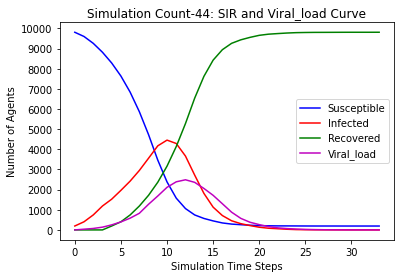

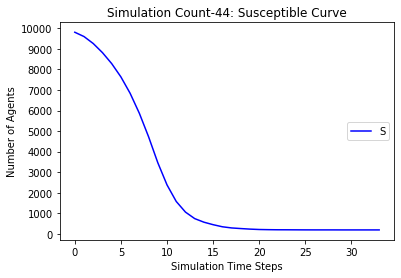

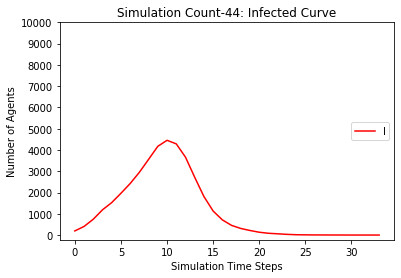

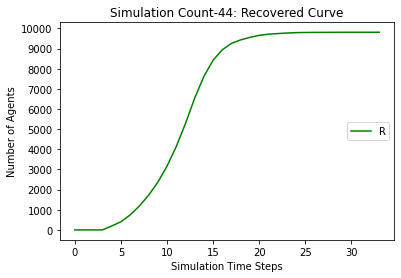

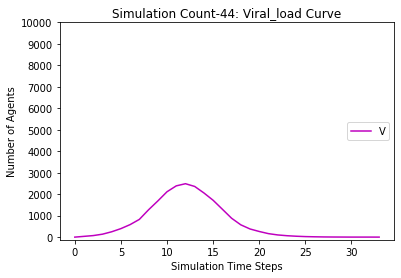

[9806, 9575, 9249, 8863, 8419, 7929, 7344, 6575, 5648, 4594, 3510, 2572, 1837, 1281, 886, 640, 487, 389, 334, 307, 289, 282, 273, 265, 264, 260, 259, 257, 256, 256, 256, 255, 254, 253, 253, 252, 252, 250, 249, 248, 246, 245, 244, 243, 243, 243, 243, 243]
[194, 425, 751, 1137, 1387, 1646, 1905, 2288, 2771, 3335, 3834, 4003, 3811, 3313, 2624, 1932, 1350, 892, 552, 333, 198, 107, 61, 42, 25, 22, 14, 8, 8, 4, 3, 2, 2, 3, 3, 3, 2, 3, 4, 4, 6, 5, 5, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 425, 751, 1137, 1581, 2071, 2656, 3425, 4352, 5406, 6490, 7428, 8163, 8719, 9114, 9360, 9513, 9611, 9666, 9693, 9711, 9718, 9727, 9735, 9736, 9740, 9741, 9743, 9744, 9744, 9744, 9745, 9746, 9747, 9747, 9748, 9748, 9750, 9751, 9752, 9754, 9755, 9756, 9757]
[0.0, 26.0, 75.0, 111.5, 223.75, 307.875, 397.9375, 634.96875, 875.484375, 1154.7421875, 1594.37109375, 1852.185546875, 2007.0927734375, 2144.54638671875, 2060.273193359375, 1781.1365966796875, 1523.5682983398438, 1125.7841491699219, 813.8920745849609, 559.946037

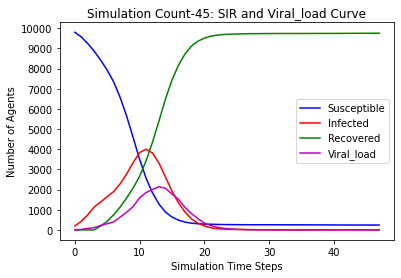

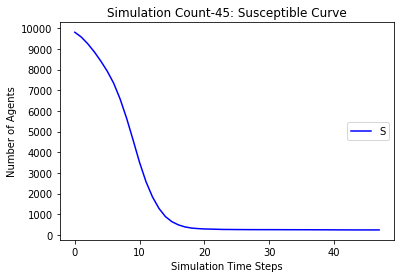

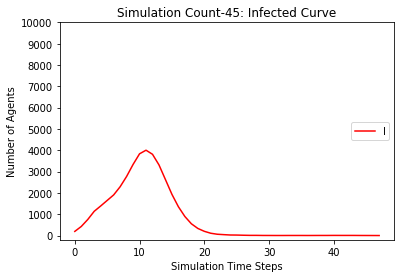

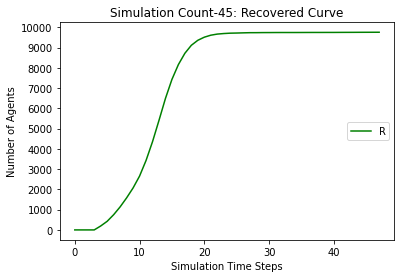

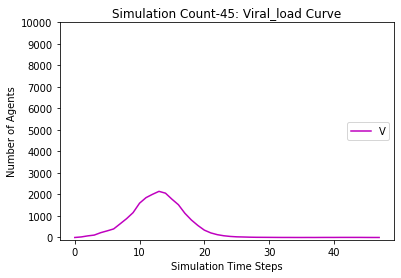

[9806, 9606, 9312, 8965, 8552, 8011, 7284, 6448, 5480, 4369, 3199, 2290, 1570, 1080, 763, 574, 478, 406, 377, 350, 336, 325, 321, 316, 313, 311, 311, 311, 311, 311, 310, 309, 308, 308, 308, 308, 308, 308]
[194, 394, 688, 1035, 1254, 1595, 2028, 2517, 3072, 3642, 4085, 4158, 3910, 3289, 2436, 1716, 1092, 674, 386, 224, 142, 81, 56, 34, 23, 14, 10, 5, 2, 0, 1, 2, 3, 3, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 394, 688, 1035, 1448, 1989, 2716, 3552, 4520, 5631, 6801, 7710, 8430, 8920, 9237, 9426, 9522, 9594, 9623, 9650, 9664, 9675, 9679, 9684, 9687, 9689, 9689, 9689, 9689, 9689, 9690, 9691, 9692, 9692]
[0.0, 26.0, 44.0, 82.0, 192.0, 399.0, 512.5, 560.25, 880.125, 1289.0625, 1669.53125, 1927.765625, 2182.8828125, 2186.44140625, 2047.220703125, 1749.6103515625, 1381.80517578125, 987.902587890625, 649.9512939453125, 410.97564697265625, 257.4878234863281, 159.74391174316406, 99.87195587158203, 57.935977935791016, 36.96798896789551, 21.483994483947754, 11.741997241973877, 6.8709986209869385, 3.4354993104

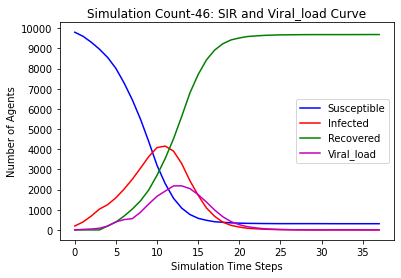

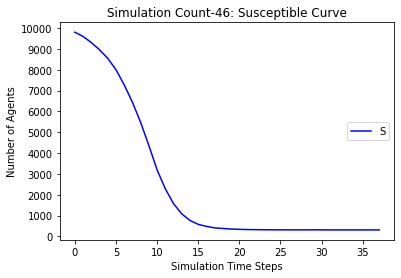

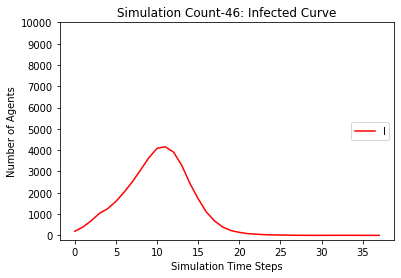

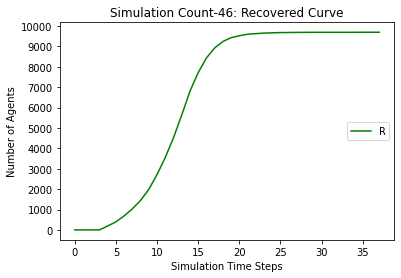

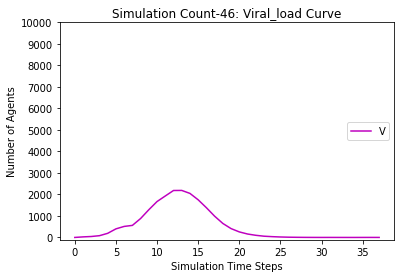

[9806, 9591, 9296, 8927, 8497, 7878, 7098, 6128, 4978, 3741, 2531, 1514, 815, 472, 298, 214, 184, 172, 162, 158, 156, 155, 154, 154, 154, 154, 154, 154, 154]
[194, 409, 704, 1073, 1309, 1713, 2198, 2799, 3519, 4137, 4567, 4614, 4163, 3269, 2233, 1300, 631, 300, 136, 56, 28, 17, 8, 4, 2, 1, 0, 0, 0]
[0, 0, 0, 0, 194, 409, 704, 1073, 1503, 2122, 2902, 3872, 5022, 6259, 7469, 8486, 9185, 9528, 9702, 9786, 9816, 9828, 9838, 9842, 9844, 9845, 9846, 9846, 9846]
[0.0, 28.0, 42.0, 105.0, 205.5, 422.75, 564.375, 782.1875, 1064.09375, 1576.046875, 2086.0234375, 2713.01171875, 3133.505859375, 2911.7529296875, 2442.87646484375, 1932.438232421875, 1304.2191162109375, 805.1095581054688, 473.5547790527344, 263.7773895263672, 141.8886947631836, 72.9443473815918, 41.4721736907959, 21.73608684539795, 11.868043422698975, 6.934021711349487, 3.4670108556747437, 1.7335054278373718, 0.8667527139186859]
[[], [9806, 9581, 9268, 8832, 8386, 7925, 7202, 6274, 5242, 4221, 3182, 2154, 1375, 876, 587, 436, 367, 331

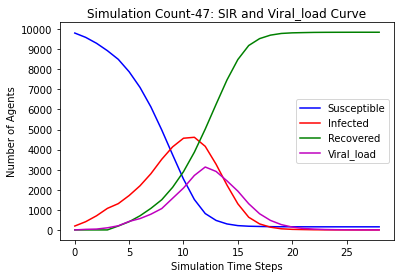

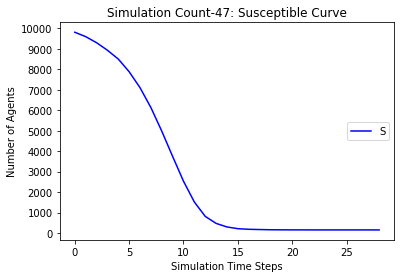

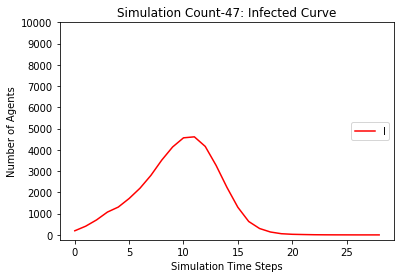

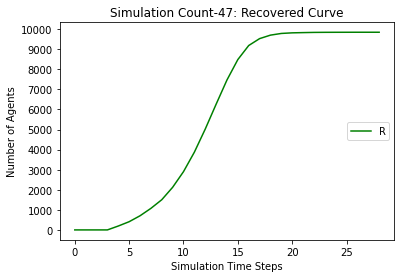

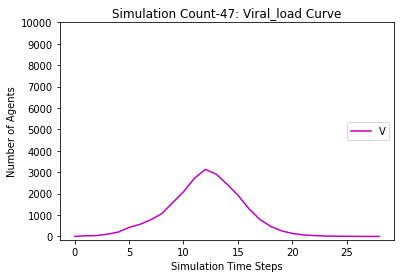

[9806, 9584, 9292, 8908, 8489, 8072, 7547, 6873, 6098, 5190, 4277, 3284, 2465, 1663, 1109, 742, 512, 386, 313, 276, 247, 234, 228, 226, 221, 217, 216, 215, 212, 212, 212, 209, 209, 208, 208, 208, 207, 206, 206, 206, 206, 206]
[194, 416, 708, 1092, 1317, 1512, 1745, 2035, 2391, 2882, 3270, 3589, 3633, 3527, 3168, 2542, 1953, 1277, 796, 466, 265, 152, 85, 50, 26, 17, 12, 11, 9, 5, 4, 6, 3, 4, 4, 1, 2, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 416, 708, 1092, 1511, 1928, 2453, 3127, 3902, 4810, 5723, 6716, 7535, 8337, 8891, 9258, 9488, 9614, 9687, 9724, 9753, 9766, 9772, 9774, 9779, 9783, 9784, 9785, 9788, 9788, 9788, 9791, 9791, 9792, 9792, 9792, 9793, 9794]
[0.0, 35.0, 53.5, 107.75, 170.875, 240.4375, 377.21875, 546.609375, 671.3046875, 795.65234375, 980.826171875, 1291.4130859375, 1375.70654296875, 1707.853271484375, 2028.9266357421875, 2099.4633178710938, 1922.7316589355469, 1570.3658294677734, 1179.1829147338867, 820.5914573669434, 544.2957286834717, 337.14786434173584, 201.57393217086792, 12

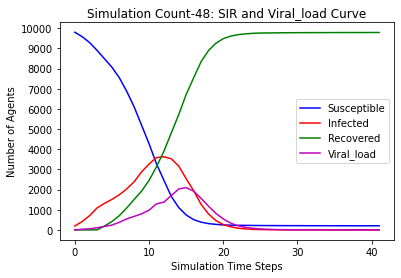

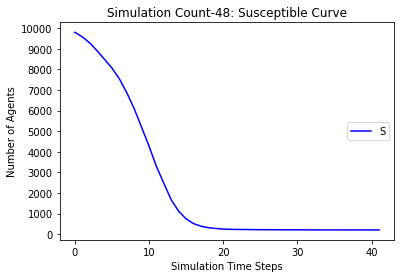

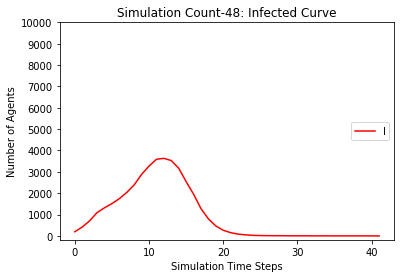

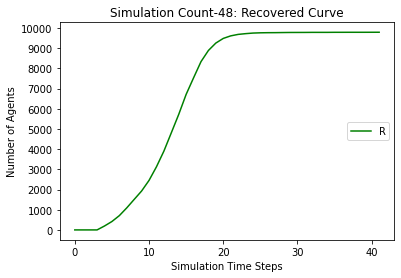

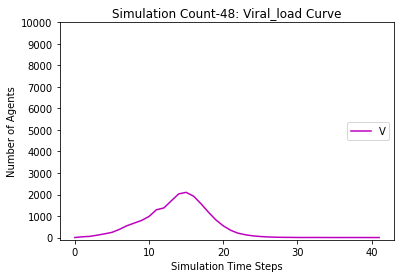

[9806, 9567, 9261, 8876, 8424, 7953, 7377, 6757, 5870, 4917, 3989, 3117, 2242, 1560, 1091, 781, 592, 474, 394, 347, 327, 307, 297, 289, 285, 282, 275, 274, 272, 272, 272, 272, 272, 272, 272]
[194, 433, 739, 1124, 1382, 1614, 1884, 2119, 2554, 3036, 3388, 3640, 3628, 3357, 2898, 2336, 1650, 1086, 697, 434, 265, 167, 97, 58, 42, 25, 22, 15, 13, 10, 3, 2, 0, 0, 0]
[0, 0, 0, 0, 194, 433, 739, 1124, 1576, 2047, 2623, 3243, 4130, 5083, 6011, 6883, 7758, 8440, 8909, 9219, 9408, 9526, 9606, 9653, 9673, 9693, 9703, 9711, 9715, 9718, 9725, 9726, 9728, 9728, 9728]
[0.0, 25.0, 46.5, 111.25, 233.625, 293.8125, 395.90625, 473.953125, 826.9765625, 946.48828125, 1024.244140625, 1319.1220703125, 1763.56103515625, 1938.780517578125, 1953.3902587890625, 1966.6951293945312, 1714.3475646972656, 1426.1737823486328, 1032.0868911743164, 692.0434455871582, 453.0217227935791, 290.51086139678955, 174.25543069839478, 105.12771534919739, 60.563857674598694, 36.28192883729935, 22.140964418649673, 15.070482209324837

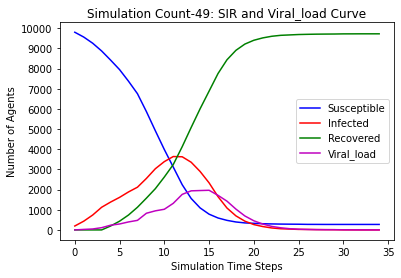

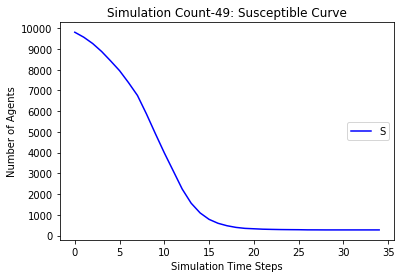

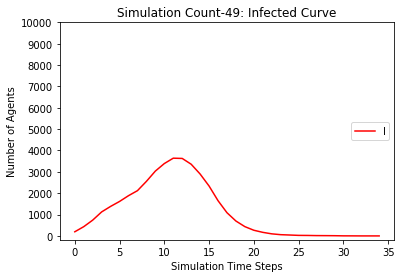

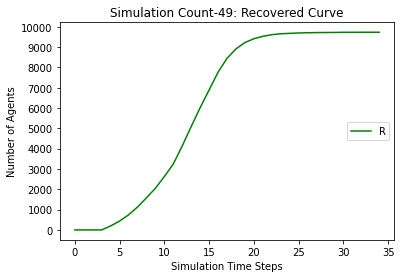

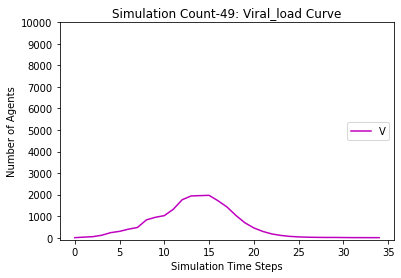

[9806, 9608, 9272, 8910, 8530, 8085, 7488, 6870, 6090, 5208, 4228, 3313, 2297, 1421, 862, 558, 388, 305, 256, 237, 228, 221, 218, 216, 214, 213, 211, 209, 208, 208, 208, 208, 208, 208, 208]
[194, 392, 728, 1090, 1276, 1523, 1784, 2040, 2440, 2877, 3260, 3557, 3793, 3787, 3366, 2755, 1909, 1116, 606, 321, 160, 84, 38, 21, 14, 8, 7, 7, 6, 5, 3, 1, 0, 0, 0]
[0, 0, 0, 0, 194, 392, 728, 1090, 1470, 1915, 2512, 3130, 3910, 4792, 5772, 6687, 7703, 8579, 9138, 9442, 9612, 9695, 9744, 9763, 9772, 9779, 9782, 9784, 9786, 9787, 9789, 9791, 9792, 9792, 9792]
[0.0, 32.0, 55.0, 98.5, 186.25, 258.125, 399.0625, 465.53125, 599.765625, 842.8828125, 1127.44140625, 1410.720703125, 2005.3603515625, 2447.68017578125, 2433.840087890625, 2233.9200439453125, 1925.9600219726562, 1517.9800109863281, 1087.990005493164, 720.995002746582, 434.497501373291, 265.2487506866455, 148.62437534332275, 85.31218767166138, 46.65609383583069, 26.328046917915344, 16.164023458957672, 8.082011729478836, 5.041005864739418, 5.520

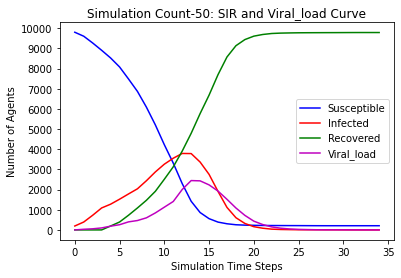

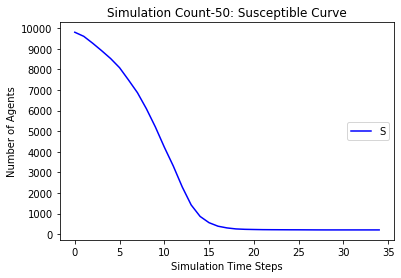

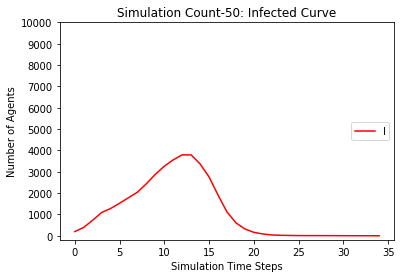

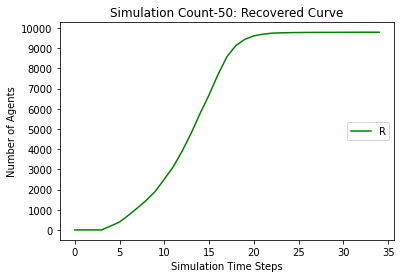

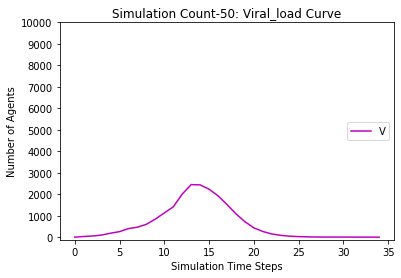

[9806, 9582, 9241, 8841, 8425, 7955, 7432, 6785, 6020, 5178, 4301, 3365, 2516, 1850, 1348, 960, 715, 567, 507, 450, 414, 386, 364, 356, 353, 351, 349, 348, 348, 348, 348, 347, 346, 346, 344, 343, 343, 343, 343, 342, 341, 340, 340, 340, 340, 340]
[194, 418, 759, 1159, 1381, 1627, 1809, 2056, 2405, 2777, 3131, 3420, 3504, 3328, 2953, 2405, 1801, 1283, 841, 510, 301, 181, 143, 94, 61, 35, 15, 8, 5, 3, 1, 1, 2, 2, 4, 4, 3, 3, 1, 1, 2, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 418, 759, 1159, 1575, 2045, 2568, 3215, 3980, 4822, 5699, 6635, 7484, 8150, 8652, 9040, 9285, 9433, 9493, 9550, 9586, 9614, 9636, 9644, 9647, 9649, 9651, 9652, 9652, 9652, 9652, 9653, 9654, 9654, 9656, 9657, 9657, 9657, 9657, 9658, 9659, 9660]
[0.0, 30.0, 65.0, 122.5, 210.25, 308.125, 347.0625, 507.53125, 632.765625, 775.3828125, 859.69140625, 1060.845703125, 1336.4228515625, 1563.21142578125, 1668.605712890625, 1787.3028564453125, 1613.6514282226562, 1289.8257141113281, 974.9128570556641, 723.456428527832, 484.728214263916, 3

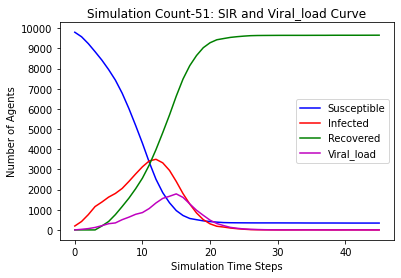

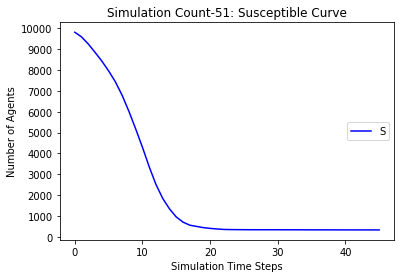

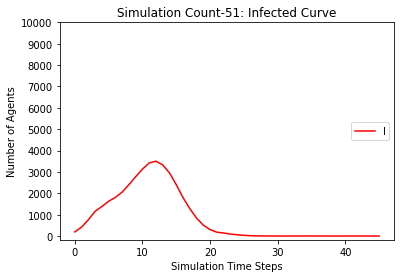

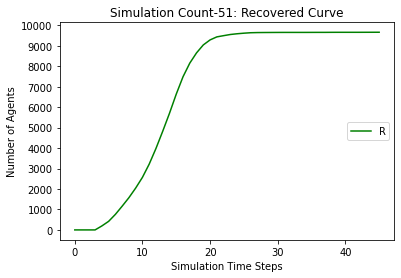

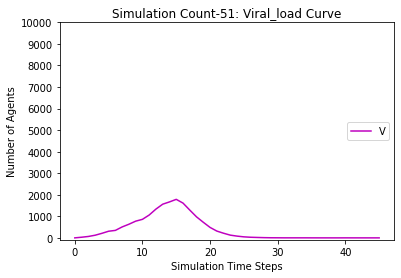

[9806, 9598, 9287, 8901, 8416, 7880, 7191, 6328, 5328, 4357, 3439, 2681, 2026, 1606, 1295, 1073, 923, 813, 739, 693, 659, 631, 616, 605, 604, 598, 596, 591, 590, 588, 586, 582, 580, 580, 580, 580, 580]
[194, 402, 713, 1099, 1390, 1718, 2096, 2573, 3088, 3523, 3752, 3647, 3302, 2751, 2144, 1608, 1103, 793, 556, 380, 264, 182, 123, 88, 55, 33, 20, 14, 14, 10, 10, 9, 10, 8, 6, 2, 0]
[0, 0, 0, 0, 194, 402, 713, 1099, 1584, 2120, 2809, 3672, 4672, 5643, 6561, 7319, 7974, 8394, 8705, 8927, 9077, 9187, 9261, 9307, 9341, 9369, 9384, 9395, 9396, 9402, 9404, 9409, 9410, 9412, 9414, 9418, 9420]
[0.0, 28.0, 51.0, 98.5, 229.25, 314.625, 467.3125, 709.65625, 925.828125, 1032.9140625, 1327.45703125, 1488.728515625, 1655.3642578125, 1444.68212890625, 1321.341064453125, 1131.6705322265625, 895.8352661132812, 669.9176330566406, 490.9588165283203, 356.47940826416016, 240.23970413208008, 157.11985206604004, 103.55992603302002, 74.77996301651001, 48.389981508255005, 32.1949907541275, 20.09749537706375, 12.

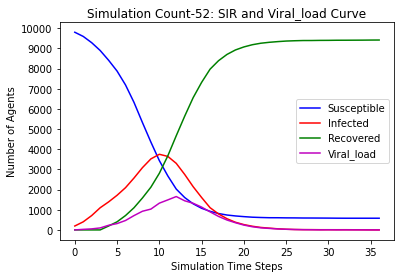

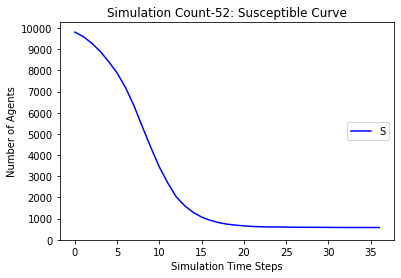

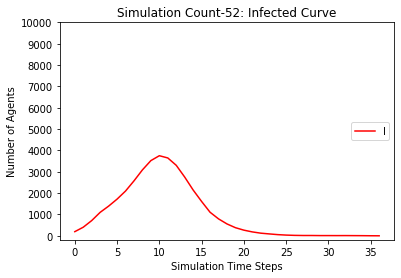

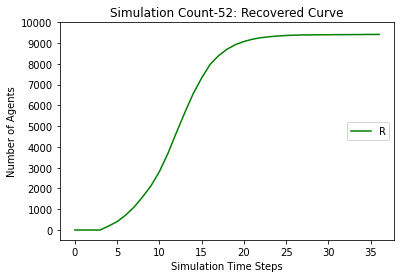

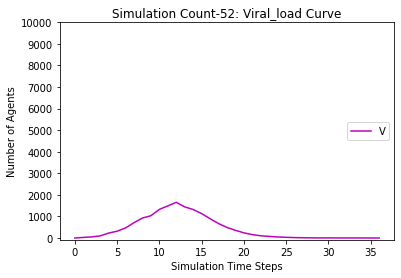

[9806, 9586, 9253, 8840, 8418, 7852, 7106, 6258, 5109, 3791, 2483, 1516, 848, 489, 311, 236, 198, 177, 169, 159, 154, 151, 151, 151, 151, 151, 151, 151, 151, 151]
[194, 414, 747, 1160, 1388, 1734, 2147, 2582, 3309, 4061, 4623, 4742, 4261, 3302, 2172, 1280, 650, 312, 142, 77, 44, 26, 18, 8, 3, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 194, 414, 747, 1160, 1582, 2148, 2894, 3742, 4891, 6209, 7517, 8484, 9152, 9511, 9689, 9764, 9802, 9823, 9831, 9841, 9846, 9849, 9849, 9849, 9849, 9849]
[0.0, 29.0, 59.5, 135.75, 196.875, 376.4375, 509.21875, 609.609375, 1204.8046875, 1648.40234375, 2160.201171875, 2529.1005859375, 2725.55029296875, 2723.775146484375, 2339.8875732421875, 1837.9437866210938, 1271.9718933105469, 820.9859466552734, 501.4929733276367, 294.74648666381836, 161.37324333190918, 90.68662166595459, 49.343310832977295, 28.671655416488647, 14.335827708244324, 8.167913854122162, 4.083956927061081, 2.0419784635305405, 1.0209892317652702, 0.5104946158826351]
[[], [9806, 9581, 9268, 8832, 8386, 7925, 7

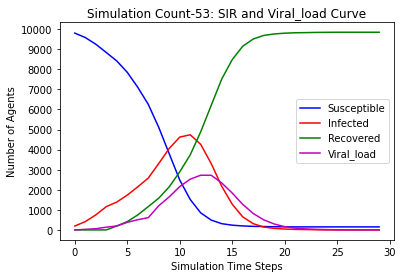

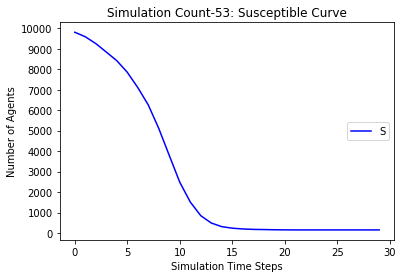

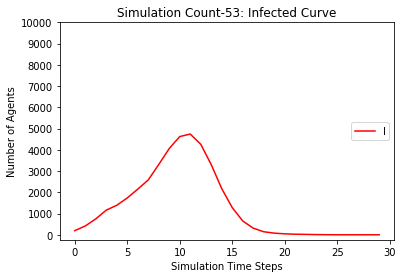

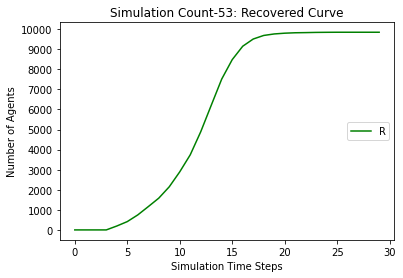

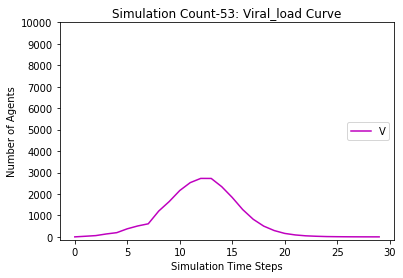

[9806, 9587, 9268, 8818, 8271, 7627, 6855, 5928, 4940, 3819, 2678, 1765, 1186, 863, 683, 578, 516, 472, 440, 422, 413, 407, 401, 399, 398, 397, 396, 394, 393, 392, 391, 390, 389, 389, 389, 389, 389]
[194, 413, 732, 1182, 1535, 1960, 2413, 2890, 3331, 3808, 4177, 4163, 3754, 2956, 1995, 1187, 670, 391, 243, 156, 103, 65, 39, 23, 15, 10, 5, 5, 5, 5, 5, 4, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 194, 413, 732, 1182, 1729, 2373, 3145, 4072, 5060, 6181, 7322, 8235, 8814, 9137, 9317, 9422, 9484, 9528, 9560, 9578, 9587, 9593, 9599, 9601, 9602, 9603, 9604, 9606, 9607, 9608, 9609, 9610, 9611]
[0.0, 28.0, 58.0, 172.0, 302.0, 367.0, 461.5, 712.75, 964.375, 1509.1875, 2079.59375, 2323.796875, 2303.8984375, 2163.94921875, 1877.974609375, 1436.9873046875, 1061.49365234375, 686.746826171875, 433.3734130859375, 271.68670654296875, 165.84335327148438, 99.92167663574219, 62.960838317871094, 34.48041915893555, 23.240209579467773, 17.620104789733887, 11.810052394866943, 6.905026197433472, 5.452513098716736, 4.7262565

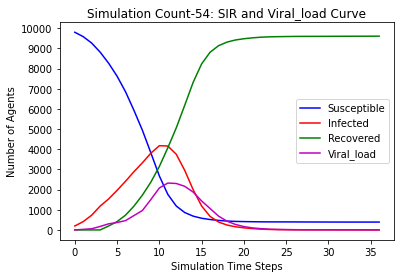

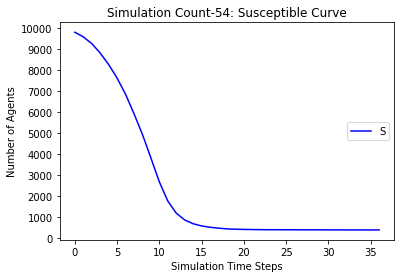

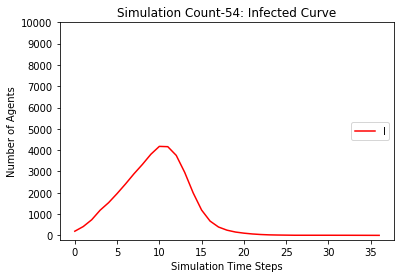

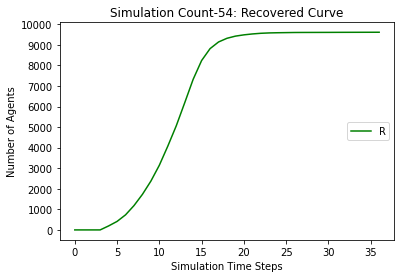

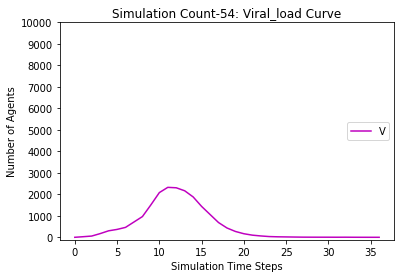

[9806, 9596, 9290, 8895, 8445, 7878, 7192, 6380, 5417, 4507, 3639, 2752, 2081, 1553, 1203, 975, 821, 716, 642, 596, 566, 549, 537, 527, 519, 515, 513, 511, 508, 504, 501, 498, 498, 498, 498, 498]
[194, 404, 710, 1105, 1361, 1718, 2098, 2515, 3028, 3371, 3553, 3628, 3336, 2954, 2436, 1777, 1260, 837, 561, 379, 255, 167, 105, 69, 47, 34, 24, 16, 11, 11, 12, 13, 10, 6, 3, 0]
[0, 0, 0, 0, 194, 404, 710, 1105, 1555, 2122, 2808, 3620, 4583, 5493, 6361, 7248, 7919, 8447, 8797, 9025, 9179, 9284, 9358, 9404, 9434, 9451, 9463, 9473, 9481, 9485, 9487, 9489, 9492, 9496, 9499, 9502]
[0.0, 30.0, 52.0, 129.0, 232.5, 334.25, 430.125, 602.0625, 858.03125, 938.015625, 1182.0078125, 1459.00390625, 1422.501953125, 1450.2509765625, 1334.12548828125, 1227.062744140625, 1041.5313720703125, 795.7656860351562, 578.8828430175781, 403.44142150878906, 274.72071075439453, 178.36035537719727, 116.18017768859863, 77.09008884429932, 52.54504442214966, 36.27252221107483, 26.136261105537415, 16.068130552768707, 11.0340

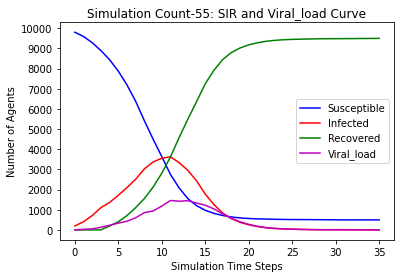

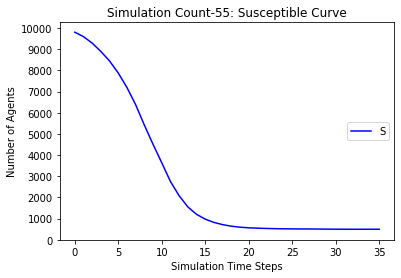

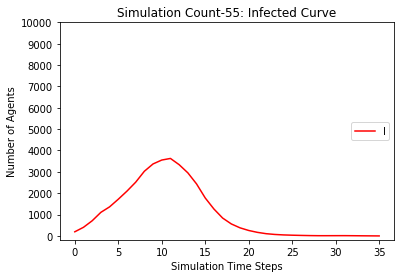

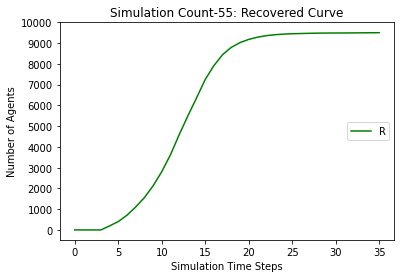

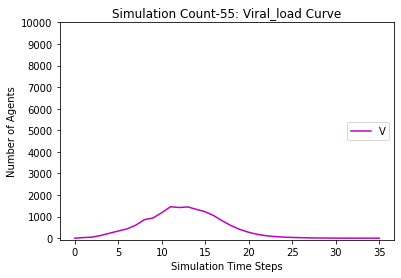

[9806, 9567, 9250, 8838, 8387, 7756, 7020, 6058, 5069, 4086, 3054, 2180, 1564, 1159, 908, 765, 666, 598, 551, 527, 506, 492, 474, 466, 463, 459, 459, 458, 458, 457, 455, 455, 454, 453, 453, 453, 453, 453]
[194, 433, 750, 1162, 1419, 1811, 2230, 2780, 3318, 3670, 3966, 3878, 3505, 2927, 2146, 1415, 898, 561, 357, 238, 160, 106, 77, 61, 43, 33, 15, 8, 5, 2, 4, 3, 4, 4, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 433, 750, 1162, 1613, 2244, 2980, 3942, 4931, 5914, 6946, 7820, 8436, 8841, 9092, 9235, 9334, 9402, 9449, 9473, 9494, 9508, 9526, 9534, 9537, 9541, 9541, 9542, 9542, 9543, 9545, 9545, 9546, 9547]
[0.0, 32.0, 54.0, 144.0, 229.0, 433.5, 491.75, 721.875, 933.9375, 1115.96875, 1462.984375, 1831.4921875, 1882.74609375, 1841.373046875, 1644.6865234375, 1280.34326171875, 946.171630859375, 700.0858154296875, 477.04290771484375, 303.5214538574219, 189.76072692871094, 115.88036346435547, 79.94018173217773, 52.97009086608887, 33.485045433044434, 18.742522716522217, 13.371261358261108, 9.685630679130554, 

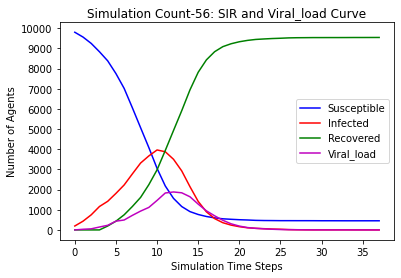

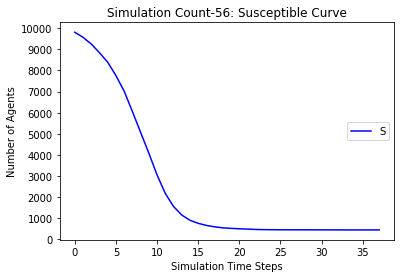

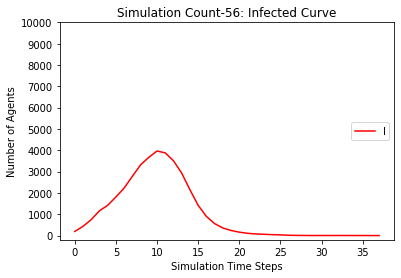

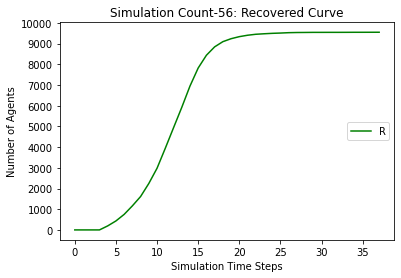

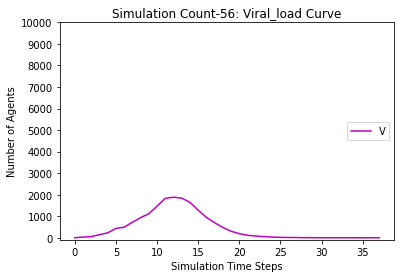

[9806, 9604, 9306, 8956, 8502, 7970, 7221, 6363, 5319, 4182, 3148, 2192, 1442, 988, 664, 452, 334, 263, 220, 202, 189, 177, 171, 166, 165, 164, 163, 161, 161, 161, 161, 161, 161]
[194, 396, 694, 1044, 1304, 1634, 2085, 2593, 3183, 3788, 4073, 4171, 3877, 3194, 2484, 1740, 1108, 725, 444, 250, 145, 86, 49, 36, 24, 13, 8, 5, 4, 3, 2, 0, 0]
[0, 0, 0, 0, 194, 396, 694, 1044, 1498, 2030, 2779, 3637, 4681, 5818, 6852, 7808, 8558, 9012, 9336, 9548, 9666, 9737, 9780, 9798, 9811, 9823, 9829, 9834, 9835, 9836, 9837, 9839, 9839]
[0.0, 28.0, 50.0, 102.0, 189.0, 329.5, 496.75, 662.375, 972.1875, 1180.09375, 1503.046875, 2030.5234375, 2342.26171875, 2433.130859375, 2419.5654296875, 2162.78271484375, 1661.391357421875, 1182.6956787109375, 833.3478393554688, 568.6739196777344, 356.3369598388672, 213.1684799194336, 127.5842399597168, 79.7921199798584, 51.8960599899292, 31.9480299949646, 20.9740149974823, 12.48700749874115, 7.243503749370575, 5.6217518746852875, 2.8108759373426437, 1.4054379686713219, 0

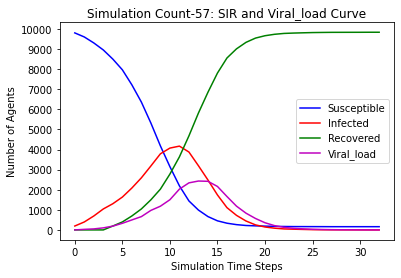

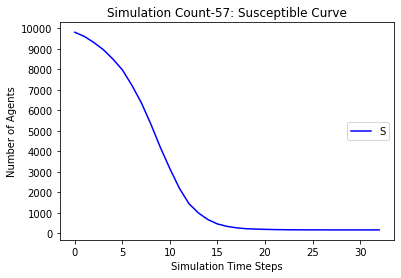

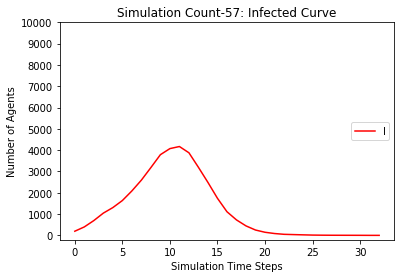

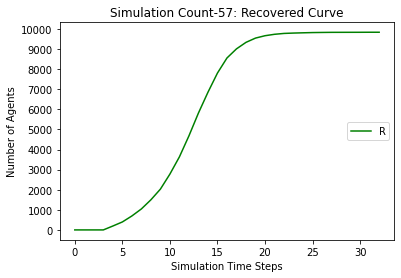

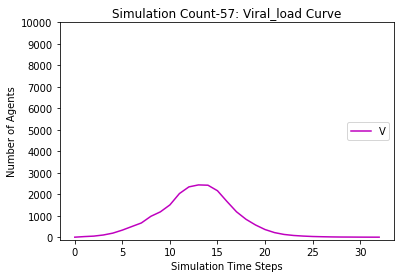

[9806, 9605, 9273, 8868, 8423, 7910, 7272, 6565, 5719, 4769, 3785, 2857, 2073, 1492, 1121, 860, 699, 589, 519, 474, 448, 427, 414, 402, 399, 393, 391, 389, 389, 389, 389, 389, 387, 386, 384, 384, 384, 384, 384, 384, 383, 383, 383, 383, 383, 383]
[194, 395, 727, 1132, 1383, 1695, 2001, 2303, 2704, 3141, 3487, 3708, 3646, 3277, 2664, 1997, 1374, 903, 602, 386, 251, 162, 105, 72, 49, 34, 23, 13, 10, 4, 2, 0, 2, 3, 5, 5, 3, 2, 0, 0, 1, 1, 1, 1, 0, 0]
[0, 0, 0, 0, 194, 395, 727, 1132, 1577, 2090, 2728, 3435, 4281, 5231, 6215, 7143, 7927, 8508, 8879, 9140, 9301, 9411, 9481, 9526, 9552, 9573, 9586, 9598, 9601, 9607, 9609, 9611, 9611, 9611, 9611, 9611, 9613, 9614, 9616, 9616, 9616, 9616, 9616, 9616, 9617, 9617]
[0.0, 31.0, 69.5, 106.75, 214.375, 362.1875, 440.09375, 485.046875, 713.5234375, 929.76171875, 1218.880859375, 1499.4404296875, 1612.72021484375, 1642.360107421875, 1640.1800537109375, 1488.0900268554688, 1221.0450134277344, 921.5225067138672, 623.7612533569336, 416.8806266784668, 282.4

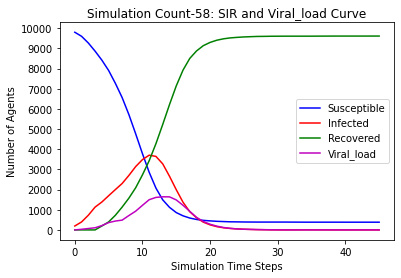

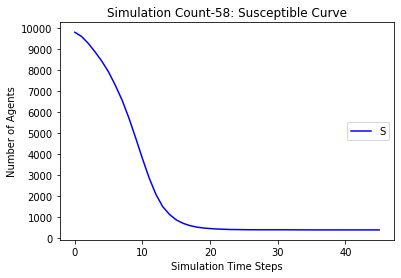

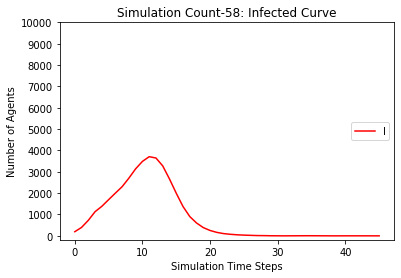

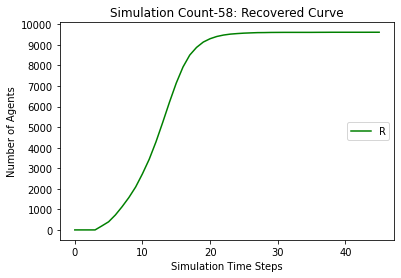

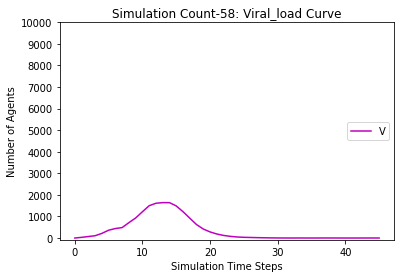

[9806, 9597, 9276, 8903, 8429, 7871, 7164, 6210, 5174, 4073, 3023, 2083, 1436, 980, 663, 483, 382, 327, 302, 289, 276, 268, 264, 259, 256, 256, 256, 256, 254, 254, 254, 254, 254]
[194, 403, 724, 1097, 1377, 1726, 2112, 2693, 3255, 3798, 4141, 4127, 3738, 3093, 2360, 1600, 1054, 653, 361, 194, 106, 59, 38, 30, 20, 12, 8, 3, 2, 2, 2, 2, 0]
[0, 0, 0, 0, 194, 403, 724, 1097, 1571, 2129, 2836, 3790, 4826, 5927, 6977, 7917, 8564, 9020, 9337, 9517, 9618, 9673, 9698, 9711, 9724, 9732, 9736, 9741, 9744, 9744, 9744, 9744, 9746]
[0.0, 24.0, 45.0, 122.5, 278.25, 340.125, 435.0625, 760.53125, 947.265625, 1311.6328125, 1673.81640625, 2032.908203125, 2051.4541015625, 2223.72705078125, 2058.863525390625, 1751.4317626953125, 1344.7158813476562, 978.3579406738281, 676.1789703369141, 434.08948516845703, 256.0447425842285, 151.02237129211426, 90.51118564605713, 54.255592823028564, 33.12779641151428, 23.56389820575714, 13.78194910287857, 6.890974551439285, 3.4454872757196426, 3.7227436378598213, 2.86137181

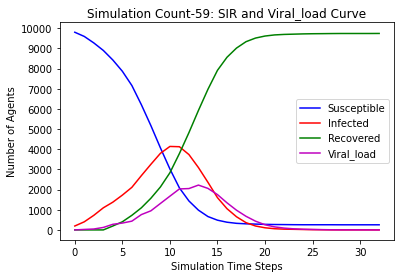

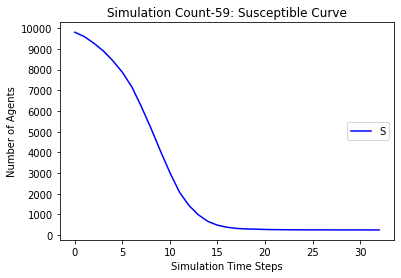

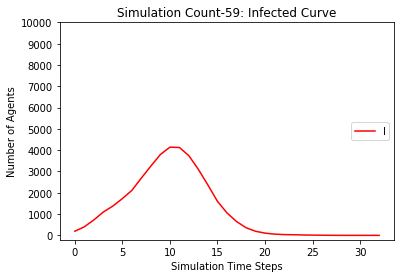

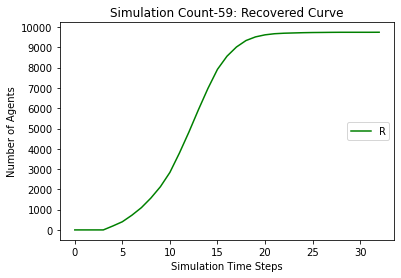

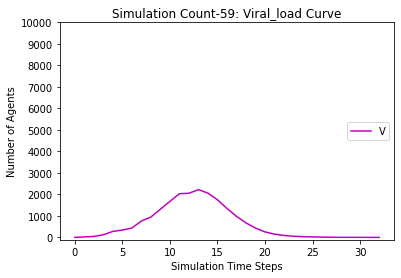

[9806, 9621, 9343, 9003, 8605, 8092, 7351, 6486, 5481, 4296, 3077, 1992, 1146, 627, 370, 238, 169, 134, 127, 118, 112, 111, 111, 108, 107, 106, 106, 105, 104, 104, 104, 104, 104]
[194, 379, 657, 997, 1201, 1529, 1992, 2517, 3124, 3796, 4274, 4494, 4335, 3669, 2707, 1754, 977, 493, 243, 120, 57, 23, 16, 10, 5, 5, 5, 3, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 379, 657, 997, 1395, 1908, 2649, 3514, 4519, 5704, 6923, 8008, 8854, 9373, 9630, 9762, 9831, 9866, 9873, 9882, 9888, 9889, 9889, 9892, 9893, 9894, 9894, 9895, 9896]
[0.0, 28.0, 47.0, 93.5, 174.75, 320.375, 533.1875, 668.59375, 953.296875, 1450.6484375, 1932.32421875, 2510.162109375, 3125.0810546875, 3378.54052734375, 3120.270263671875, 2659.1351318359375, 1989.5675659179688, 1390.7837829589844, 847.3918914794922, 510.6959457397461, 297.34797286987305, 167.67398643493652, 91.83699321746826, 49.91849660873413, 26.959248304367065, 13.479624152183533, 7.739812076091766, 5.869906038045883, 4.934953019022942, 3.467476509511471, 1.733738254755735

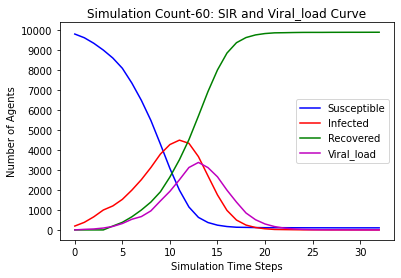

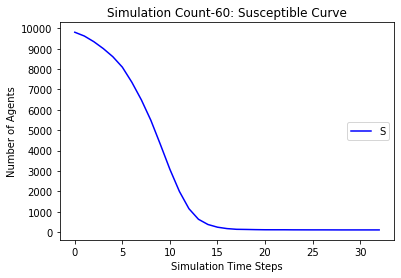

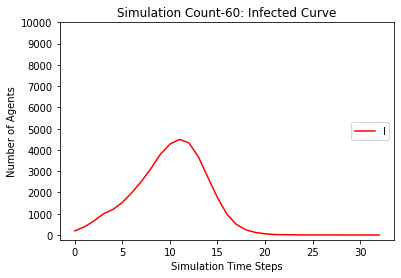

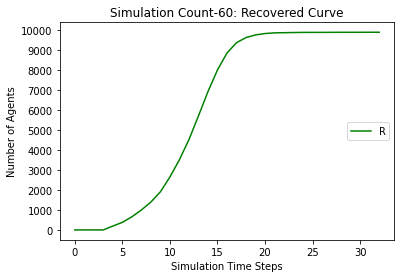

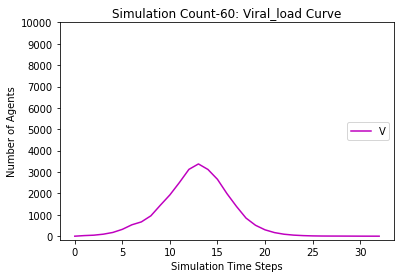

[9806, 9572, 9234, 8841, 8437, 7969, 7378, 6626, 5727, 4721, 3725, 2681, 1896, 1314, 952, 733, 607, 513, 453, 423, 399, 396, 393, 387, 385, 382, 379, 379, 379, 378, 377, 377, 377, 377, 376, 373, 373, 373, 373, 372, 371, 371, 370, 369, 369, 368, 366, 365, 364, 363, 360, 359, 359, 358, 358, 358, 358, 358]
[194, 428, 766, 1159, 1369, 1603, 1856, 2215, 2710, 3248, 3653, 3945, 3831, 3407, 2773, 1948, 1289, 801, 499, 310, 208, 117, 60, 36, 14, 14, 14, 8, 6, 4, 2, 2, 2, 1, 1, 4, 4, 4, 3, 1, 2, 2, 3, 3, 2, 3, 4, 4, 5, 5, 6, 6, 5, 5, 2, 1, 1, 0]
[0, 0, 0, 0, 194, 428, 766, 1159, 1563, 2031, 2622, 3374, 4273, 5279, 6275, 7319, 8104, 8686, 9048, 9267, 9393, 9487, 9547, 9577, 9601, 9604, 9607, 9613, 9615, 9618, 9621, 9621, 9621, 9622, 9623, 9623, 9623, 9623, 9624, 9627, 9627, 9627, 9627, 9628, 9629, 9629, 9630, 9631, 9631, 9632, 9634, 9635, 9636, 9637, 9640, 9641, 9641, 9642]
[0.0, 35.0, 61.5, 119.75, 180.875, 295.4375, 397.71875, 555.859375, 766.9296875, 1042.46484375, 1382.232421875, 1909.116210

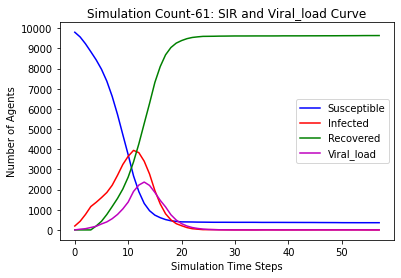

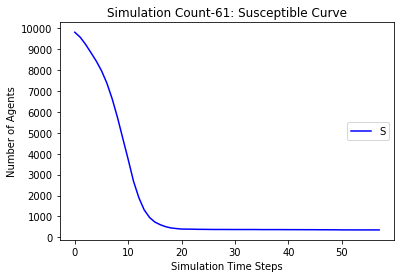

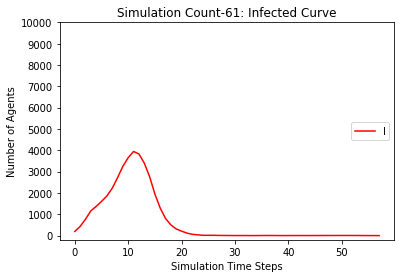

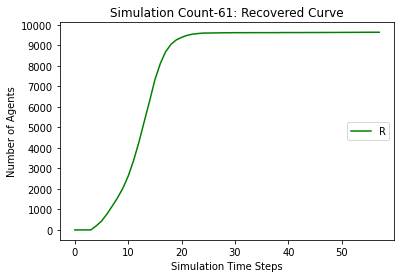

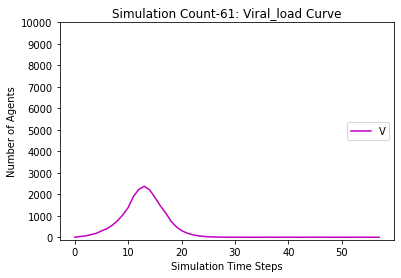

[9806, 9585, 9275, 8913, 8469, 8016, 7439, 6632, 5810, 4902, 3856, 2894, 1991, 1371, 990, 723, 555, 468, 418, 382, 367, 359, 353, 349, 347, 346, 346, 346, 346, 346, 346]
[194, 415, 725, 1087, 1337, 1569, 1836, 2281, 2659, 3114, 3583, 3738, 3819, 3531, 2866, 2171, 1436, 903, 572, 341, 188, 109, 65, 33, 20, 13, 7, 3, 1, 0, 0]
[0, 0, 0, 0, 194, 415, 725, 1087, 1531, 1984, 2561, 3368, 4190, 5098, 6144, 7106, 8009, 8629, 9010, 9277, 9445, 9532, 9582, 9618, 9633, 9641, 9647, 9651, 9653, 9654, 9654]
[0.0, 29.0, 54.5, 94.25, 215.125, 295.5625, 402.78125, 628.390625, 689.1953125, 1037.59765625, 1357.798828125, 1561.8994140625, 1903.94970703125, 2004.974853515625, 1909.4874267578125, 1833.7437133789062, 1508.8718566894531, 1112.4359283447266, 770.2179641723633, 519.1089820861816, 341.5544910430908, 203.7772455215454, 124.8886227607727, 75.44431138038635, 47.722155690193176, 26.861077845096588, 14.430538922548294, 7.215269461274147, 3.6076347306370735, 1.8038173653185368, 0.9019086826592684]
[[],

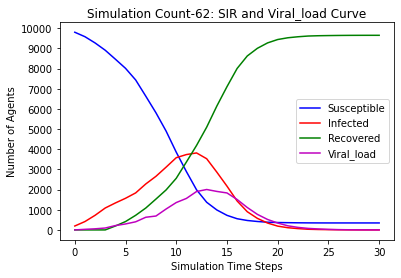

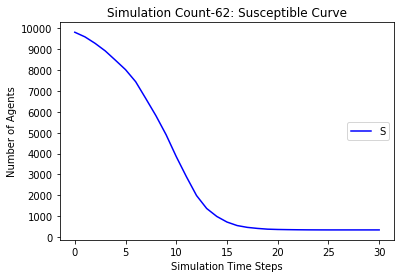

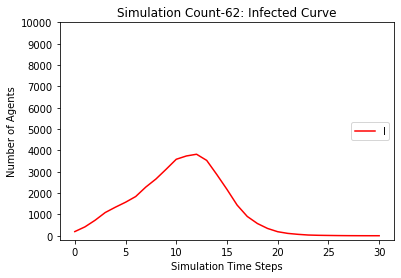

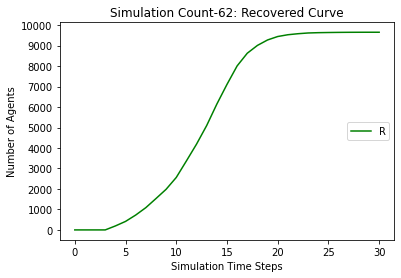

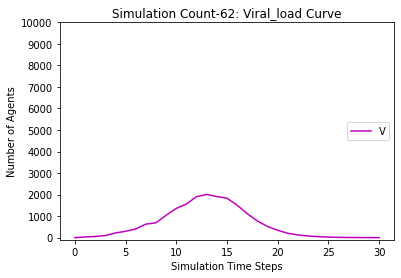

[9806, 9575, 9253, 8877, 8415, 7876, 7201, 6404, 5410, 4306, 3227, 2320, 1613, 1168, 839, 642, 515, 450, 410, 353, 323, 306, 300, 288, 281, 271, 267, 260, 257, 257, 255, 253, 253, 253, 253, 253]
[194, 425, 747, 1123, 1391, 1699, 2052, 2473, 3005, 3570, 3974, 4084, 3797, 3138, 2388, 1678, 1098, 718, 429, 289, 192, 144, 110, 65, 42, 35, 33, 28, 24, 14, 12, 7, 4, 4, 2, 0]
[0, 0, 0, 0, 194, 425, 747, 1123, 1585, 2124, 2799, 3596, 4590, 5694, 6773, 7680, 8387, 8832, 9161, 9358, 9485, 9550, 9590, 9647, 9677, 9694, 9700, 9712, 9719, 9729, 9733, 9740, 9743, 9743, 9745, 9747]
[0.0, 30.0, 52.0, 99.0, 257.5, 383.75, 478.875, 637.4375, 950.71875, 1234.359375, 1561.1796875, 1801.58984375, 1961.794921875, 2021.8974609375, 1979.94873046875, 1700.974365234375, 1350.4871826171875, 990.2435913085938, 675.1217956542969, 499.56089782714844, 327.7804489135742, 214.8902244567871, 136.44511222839355, 103.22255611419678, 67.61127805709839, 42.805639028549194, 29.402819514274597, 22.7014097571373, 12.350704878

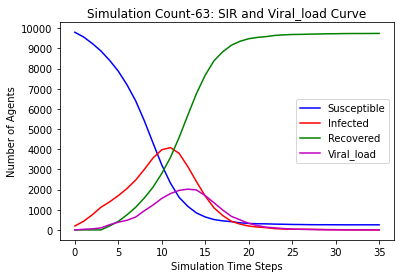

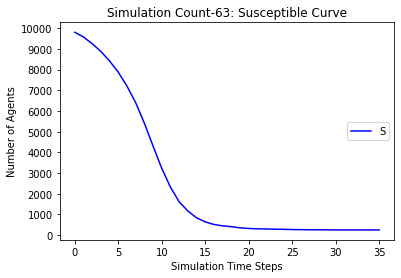

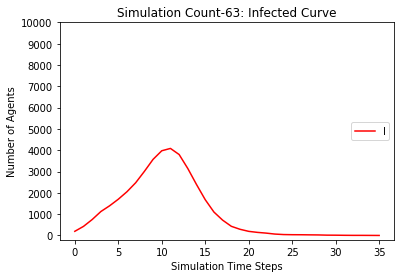

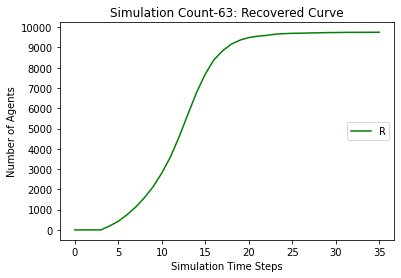

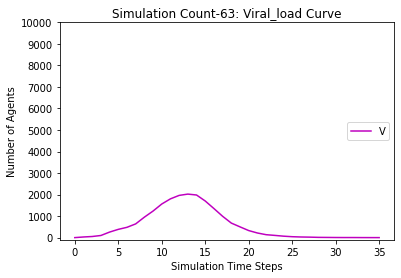

[9806, 9595, 9282, 8897, 8455, 7881, 7134, 6302, 5350, 4255, 3167, 2271, 1611, 1130, 846, 640, 532, 450, 410, 384, 372, 369, 365, 364, 362, 361, 359, 359, 359, 359, 359]
[194, 405, 718, 1103, 1351, 1714, 2148, 2595, 3105, 3626, 3967, 4031, 3739, 3125, 2321, 1631, 1079, 680, 436, 256, 160, 81, 45, 20, 10, 8, 6, 5, 3, 2, 0]
[0, 0, 0, 0, 194, 405, 718, 1103, 1545, 2119, 2866, 3698, 4650, 5745, 6833, 7729, 8389, 8870, 9154, 9360, 9468, 9550, 9590, 9616, 9628, 9631, 9635, 9636, 9638, 9639, 9641]
[0.0, 30.0, 73.0, 143.5, 209.75, 323.875, 492.9375, 658.46875, 882.234375, 1371.1171875, 1665.55859375, 1795.779296875, 1759.8896484375, 1776.94482421875, 1724.472412109375, 1522.2362060546875, 1233.1181030273438, 883.5590515136719, 583.7795257568359, 381.88976287841797, 229.94488143920898, 140.9724407196045, 82.48622035980225, 50.24311017990112, 28.12155508995056, 15.06077754497528, 7.53038877248764, 4.76519438624382, 2.38259719312191, 1.191298596560955, 0.5956492982804775]
[[], [9806, 9581, 9268, 

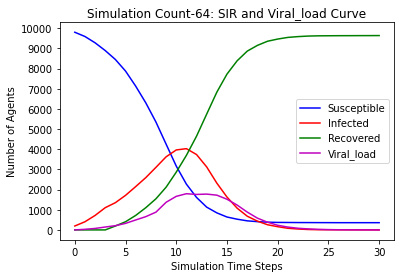

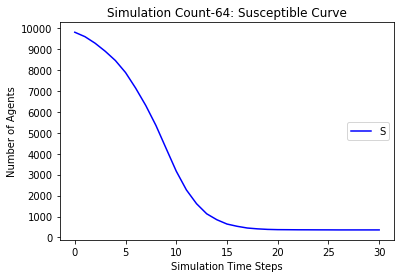

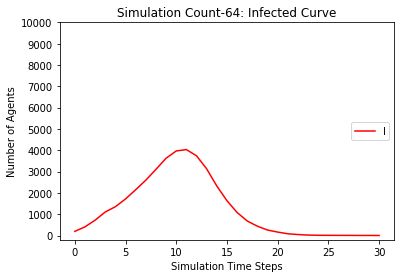

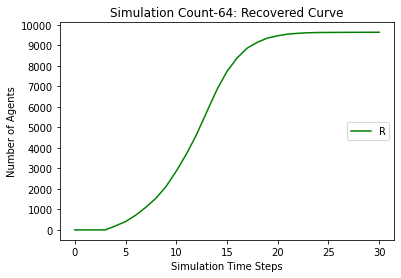

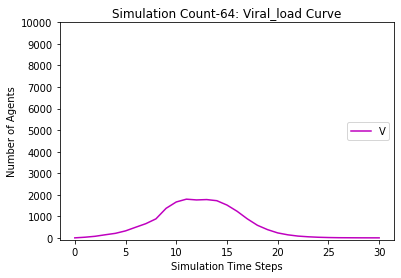

[9806, 9571, 9244, 8837, 8299, 7747, 6985, 5993, 4983, 3869, 2826, 1927, 1259, 820, 546, 409, 331, 284, 254, 238, 231, 228, 225, 224, 221, 221, 220, 220, 219, 219, 219, 219, 218, 217, 217, 215, 215, 213, 211, 211, 211, 211, 210, 210, 210, 209, 209, 209, 209, 209]
[194, 429, 756, 1163, 1507, 1824, 2259, 2844, 3316, 3878, 4159, 4066, 3724, 3049, 2280, 1518, 928, 536, 292, 171, 100, 56, 29, 14, 10, 7, 5, 4, 2, 2, 1, 1, 1, 2, 2, 4, 3, 4, 6, 4, 4, 2, 1, 1, 1, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 429, 756, 1163, 1701, 2253, 3015, 4007, 5017, 6131, 7174, 8073, 8741, 9180, 9454, 9591, 9669, 9716, 9746, 9762, 9769, 9772, 9775, 9776, 9779, 9779, 9780, 9780, 9781, 9781, 9781, 9781, 9782, 9783, 9783, 9785, 9785, 9787, 9789, 9789, 9789, 9789, 9790, 9790, 9790, 9791]
[0.0, 30.0, 67.0, 120.5, 291.25, 389.625, 571.8125, 852.90625, 977.453125, 1473.7265625, 1880.86328125, 2172.431640625, 2271.2158203125, 2346.60791015625, 2061.303955078125, 1669.6519775390625, 1219.8259887695312, 871.9129943847656, 585.956

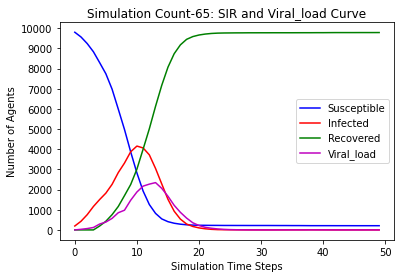

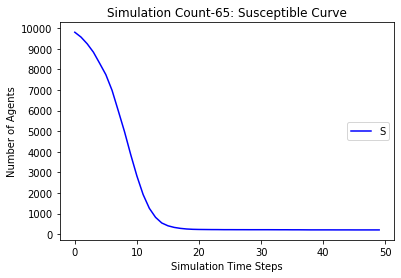

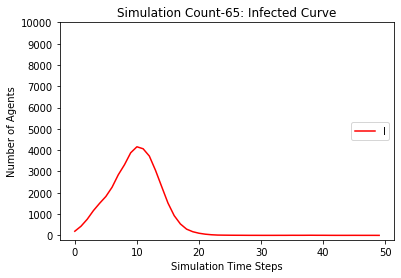

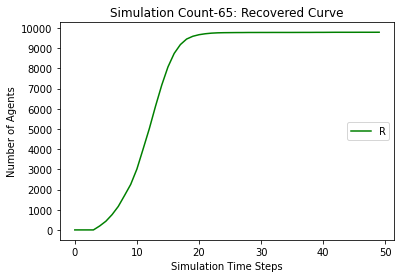

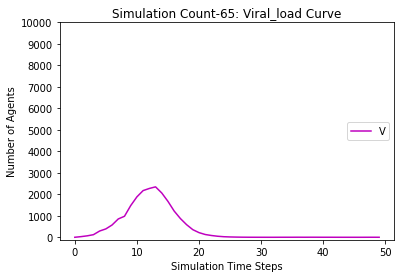

[9806, 9591, 9265, 8875, 8345, 7776, 7107, 6364, 5496, 4608, 3682, 2769, 2045, 1398, 1019, 750, 573, 489, 438, 408, 381, 372, 367, 362, 358, 358, 358, 357, 357, 357, 357, 357]
[194, 409, 735, 1125, 1461, 1815, 2158, 2511, 2849, 3168, 3425, 3595, 3451, 3210, 2663, 2019, 1472, 909, 581, 342, 192, 117, 71, 46, 23, 14, 9, 5, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 409, 735, 1125, 1655, 2224, 2893, 3636, 4504, 5392, 6318, 7231, 7955, 8602, 8981, 9250, 9427, 9511, 9562, 9592, 9619, 9628, 9633, 9638, 9642, 9642, 9642, 9643]
[0.0, 29.0, 60.5, 104.25, 269.125, 354.5625, 469.28125, 643.640625, 782.8203125, 958.41015625, 1180.205078125, 1590.1025390625, 1720.05126953125, 1904.025634765625, 1701.0128173828125, 1608.5064086914062, 1291.2532043457031, 994.6266021728516, 674.3133010864258, 445.1566505432129, 294.57832527160645, 186.28916263580322, 119.14458131790161, 70.5722906589508, 44.2861453294754, 23.1430726647377, 12.57153633236885, 7.285768166184425, 3.6428840830922127, 1.8214420415461063, 0.91072102077

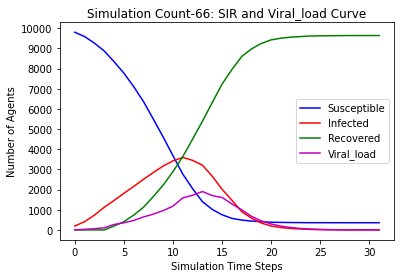

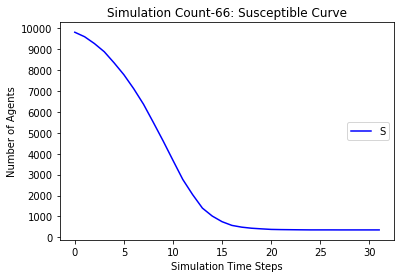

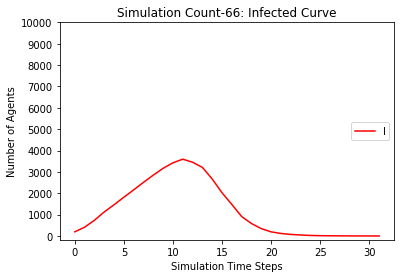

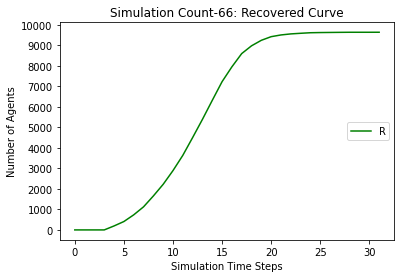

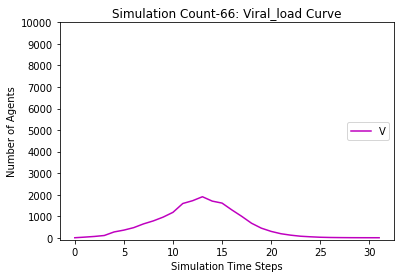

[9806, 9588, 9248, 8879, 8412, 7844, 7167, 6401, 5493, 4487, 3531, 2624, 1859, 1327, 960, 740, 616, 531, 480, 452, 433, 422, 419, 416, 413, 411, 411, 410, 410, 410, 410, 410]
[194, 412, 752, 1121, 1394, 1744, 2081, 2478, 2919, 3357, 3636, 3777, 3634, 3160, 2571, 1884, 1243, 796, 480, 288, 183, 109, 61, 36, 20, 11, 8, 6, 3, 1, 1, 0]
[0, 0, 0, 0, 194, 412, 752, 1121, 1588, 2156, 2833, 3599, 4507, 5513, 6469, 7376, 8141, 8673, 9040, 9260, 9384, 9469, 9520, 9548, 9567, 9578, 9581, 9584, 9587, 9589, 9589, 9590]
[0.0, 31.0, 72.5, 115.25, 210.625, 396.3125, 518.15625, 568.078125, 745.0390625, 1068.51953125, 1261.259765625, 1510.6298828125, 1848.31494140625, 1959.157470703125, 1846.5787353515625, 1568.2893676757812, 1276.1446838378906, 919.0723419189453, 631.5361709594727, 418.7680854797363, 262.38404273986816, 167.19202136993408, 102.59601068496704, 59.29800534248352, 34.64900267124176, 20.32450133562088, 11.16225066781044, 6.58112533390522, 4.29056266695261, 2.145281333476305, 1.072640666738

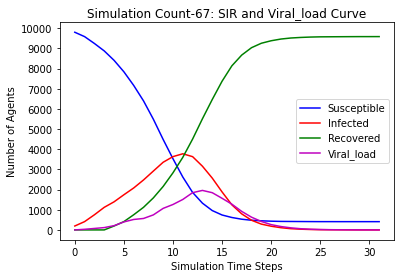

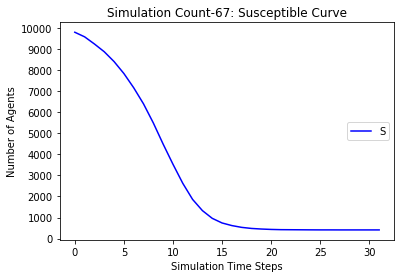

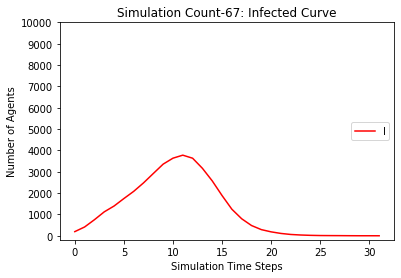

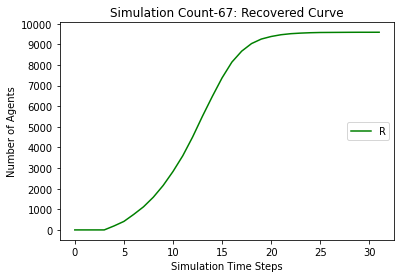

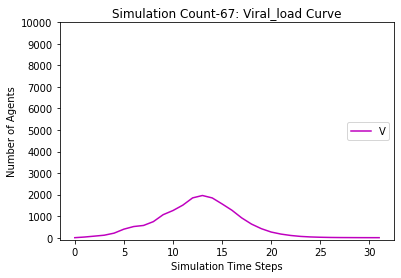

[9806, 9597, 9275, 8923, 8512, 8042, 7399, 6597, 5639, 4567, 3538, 2540, 1764, 1227, 908, 680, 551, 474, 437, 405, 383, 368, 356, 351, 349, 344, 341, 341, 341, 341, 341, 341, 341]
[194, 403, 725, 1077, 1294, 1555, 1876, 2326, 2873, 3475, 3861, 4057, 3875, 3340, 2630, 1860, 1213, 753, 471, 275, 168, 106, 81, 54, 34, 24, 15, 10, 8, 3, 0, 0, 0]
[0, 0, 0, 0, 194, 403, 725, 1077, 1488, 1958, 2601, 3403, 4361, 5433, 6462, 7460, 8236, 8773, 9092, 9320, 9449, 9526, 9563, 9595, 9617, 9632, 9644, 9649, 9651, 9656, 9659, 9659, 9659]
[0.0, 30.0, 47.0, 85.5, 178.75, 311.375, 478.6875, 585.34375, 827.671875, 1052.8359375, 1286.41796875, 1790.208984375, 2059.1044921875, 2127.55224609375, 1977.776123046875, 1775.8880615234375, 1432.9440307617188, 1053.4720153808594, 720.7360076904297, 484.36800384521484, 311.1840019226074, 197.5920009613037, 123.79600048065186, 79.89800024032593, 53.949000120162964, 31.974500060081482, 18.98725003004074, 11.49362501502037, 6.746812507510185, 4.373406253755093, 2.18670

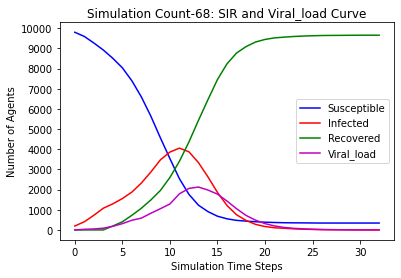

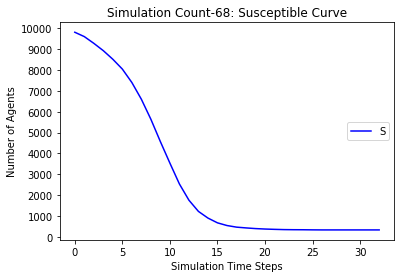

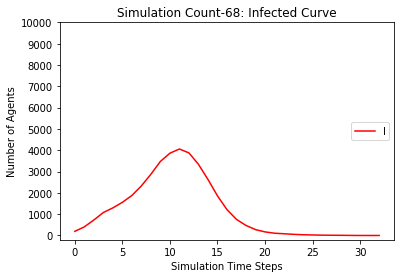

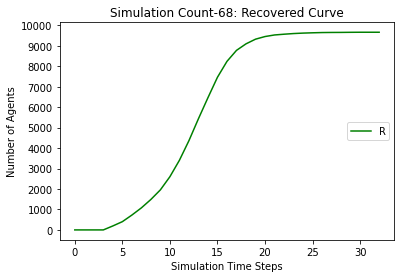

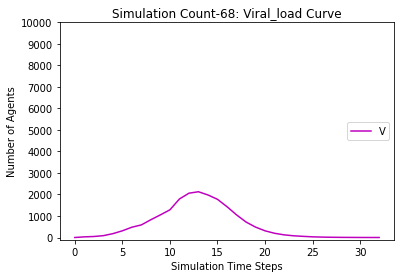

[9806, 9603, 9288, 8906, 8435, 7849, 7109, 6310, 5339, 4277, 3232, 2392, 1766, 1311, 978, 749, 598, 531, 484, 448, 434, 423, 418, 411, 410, 409, 408, 405, 404, 404, 404, 403, 402, 402, 402, 402, 402, 402]
[194, 397, 712, 1094, 1371, 1754, 2179, 2596, 3096, 3572, 3877, 3918, 3573, 2966, 2254, 1643, 1168, 780, 494, 301, 164, 108, 66, 37, 24, 14, 10, 6, 6, 5, 4, 2, 2, 2, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 397, 712, 1094, 1565, 2151, 2891, 3690, 4661, 5723, 6768, 7608, 8234, 8689, 9022, 9251, 9402, 9469, 9516, 9552, 9566, 9577, 9582, 9589, 9590, 9591, 9592, 9595, 9596, 9596, 9596, 9597, 9598, 9598]
[0.0, 32.0, 59.0, 123.5, 276.75, 381.375, 536.6875, 620.34375, 827.171875, 1209.5859375, 1554.79296875, 1707.396484375, 1771.6982421875, 1812.84912109375, 1707.424560546875, 1482.7122802734375, 1173.3561401367188, 888.6780700683594, 629.3390350341797, 422.66951751708984, 267.3347587585449, 167.66737937927246, 107.83368968963623, 63.916844844818115, 37.95842242240906, 21.97921121120453, 11.98960560560

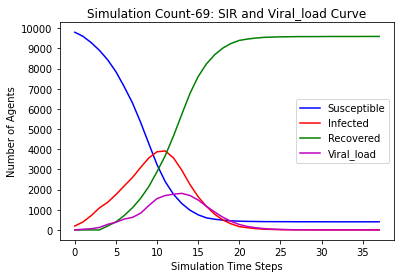

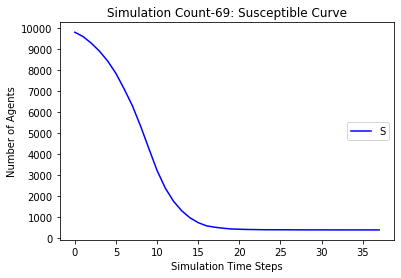

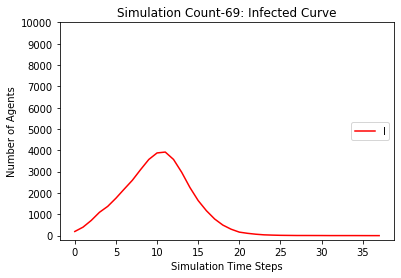

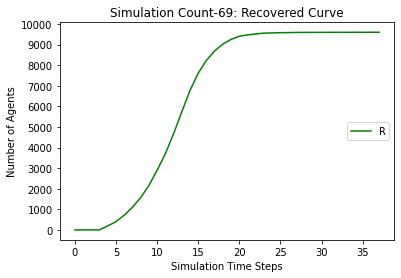

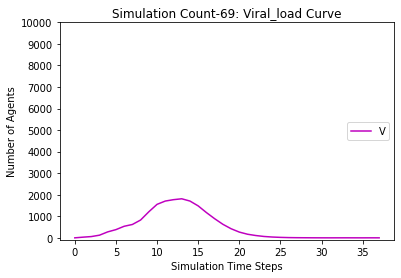

[9806, 9560, 9198, 8782, 8258, 7590, 6662, 5527, 4328, 3237, 2347, 1585, 1100, 763, 568, 436, 356, 308, 278, 262, 256, 252, 247, 247, 246, 245, 245, 245, 245, 245]
[194, 440, 802, 1218, 1548, 1970, 2536, 3255, 3930, 4353, 4315, 3942, 3228, 2474, 1779, 1149, 744, 455, 290, 174, 100, 56, 31, 15, 10, 7, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 440, 802, 1218, 1742, 2410, 3338, 4473, 5672, 6763, 7653, 8415, 8900, 9237, 9432, 9564, 9644, 9692, 9722, 9738, 9744, 9748, 9753, 9753, 9754, 9755]
[0.0, 26.0, 68.0, 185.0, 251.5, 434.75, 752.375, 968.1875, 1265.09375, 1565.546875, 1815.7734375, 2363.88671875, 2403.943359375, 2247.9716796875, 1815.98583984375, 1406.992919921875, 1006.4964599609375, 701.2482299804688, 478.6241149902344, 297.3120574951172, 170.6560287475586, 107.3280143737793, 61.66400718688965, 34.832003593444824, 17.416001796722412, 8.708000898361206, 5.354000449180603, 3.6770002245903015, 1.8385001122951508, 0.9192500561475754]
[[], [9806, 9581, 9268, 8832, 8386, 7925, 7202, 6274, 5242, 4221,

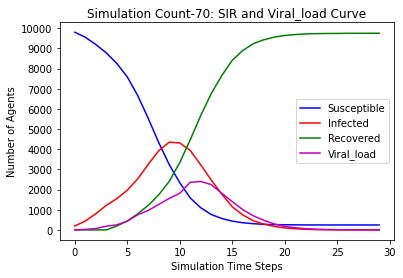

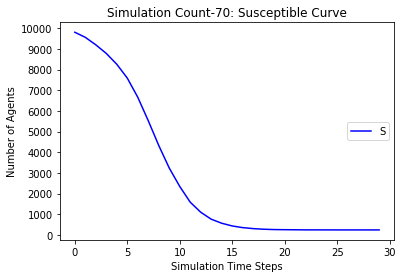

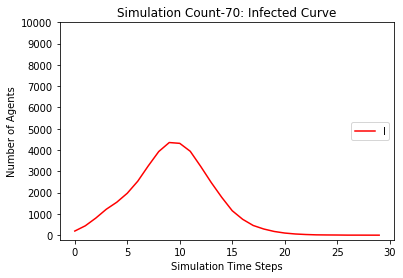

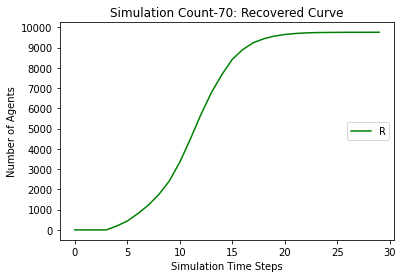

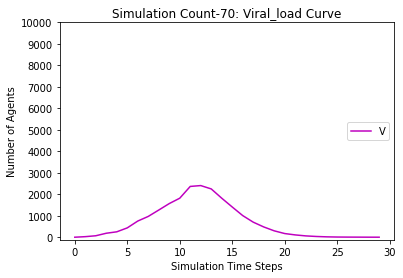

[9806, 9586, 9272, 8879, 8425, 7873, 7175, 6315, 5450, 4609, 3704, 2906, 2224, 1672, 1276, 984, 788, 673, 586, 526, 484, 458, 441, 432, 430, 428, 428, 422, 421, 419, 418, 418, 418, 418, 418]
[194, 414, 728, 1121, 1381, 1713, 2097, 2564, 2975, 3264, 3471, 3409, 3226, 2937, 2428, 1922, 1436, 999, 690, 458, 304, 215, 145, 94, 54, 30, 13, 10, 9, 9, 10, 4, 3, 1, 0]
[0, 0, 0, 0, 194, 414, 728, 1121, 1575, 2127, 2825, 3685, 4550, 5391, 6296, 7094, 7776, 8328, 8724, 9016, 9212, 9327, 9414, 9474, 9516, 9542, 9559, 9568, 9570, 9572, 9572, 9578, 9579, 9581, 9582]
[0.0, 27.0, 59.5, 135.75, 225.875, 386.9375, 505.46875, 594.734375, 779.3671875, 925.68359375, 1245.841796875, 1358.9208984375, 1420.46044921875, 1526.230224609375, 1574.1151123046875, 1401.0575561523438, 1179.5287780761719, 905.7643890380859, 705.882194519043, 526.9410972595215, 358.47054862976074, 243.23527431488037, 165.61763715744019, 103.80881857872009, 62.904409289360046, 42.45220464468002, 24.22610232234001, 19.113051161170006, 9.

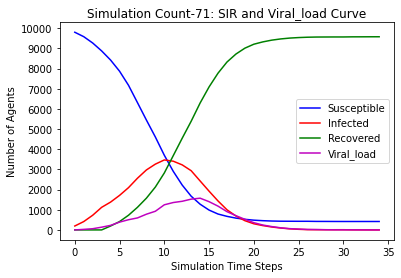

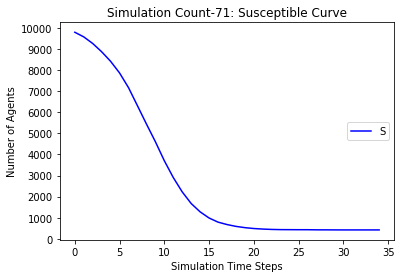

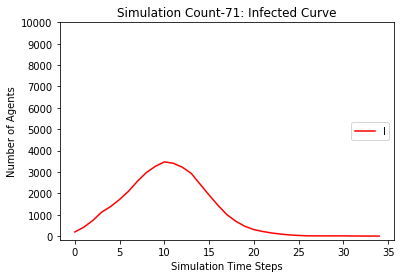

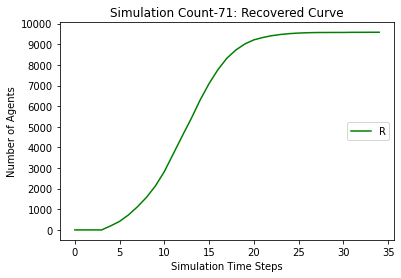

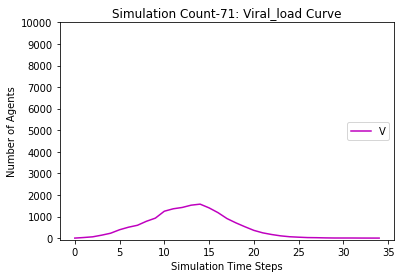

[9806, 9600, 9283, 8894, 8459, 8003, 7496, 6826, 6051, 5158, 4219, 3324, 2596, 2024, 1606, 1264, 1029, 870, 759, 700, 666, 630, 601, 582, 562, 551, 544, 537, 534, 533, 532, 530, 528, 527, 525, 524, 524, 523, 521, 521, 521, 521, 521]
[194, 400, 717, 1106, 1347, 1597, 1787, 2068, 2408, 2845, 3277, 3502, 3455, 3134, 2613, 2060, 1567, 1154, 847, 564, 363, 240, 158, 118, 104, 79, 57, 45, 28, 18, 12, 7, 6, 6, 7, 6, 4, 4, 4, 3, 3, 2, 0]
[0, 0, 0, 0, 194, 400, 717, 1106, 1541, 1997, 2504, 3174, 3949, 4842, 5781, 6676, 7404, 7976, 8394, 8736, 8971, 9130, 9241, 9300, 9334, 9370, 9399, 9418, 9438, 9449, 9456, 9463, 9466, 9467, 9468, 9470, 9472, 9473, 9475, 9476, 9476, 9477, 9479]
[0.0, 27.0, 50.5, 120.25, 191.125, 309.5625, 348.78125, 565.390625, 637.6953125, 891.84765625, 1019.923828125, 1215.9619140625, 1307.98095703125, 1370.990478515625, 1388.4952392578125, 1362.2476196289062, 1068.1238098144531, 883.0619049072266, 678.5309524536133, 522.2654762268066, 380.1327381134033, 272.06636905670166, 1

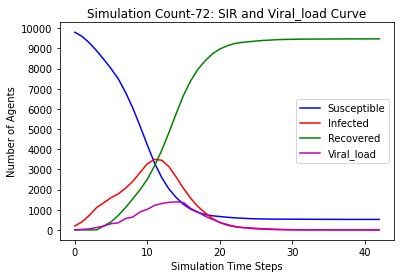

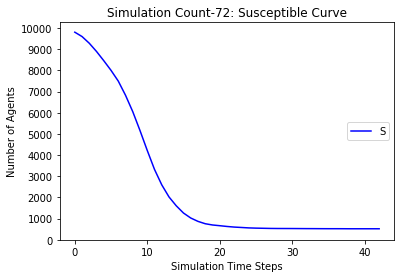

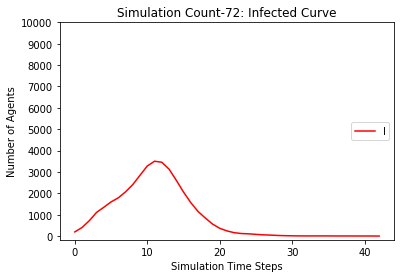

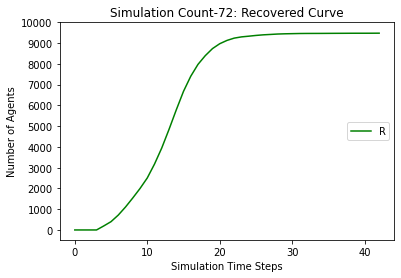

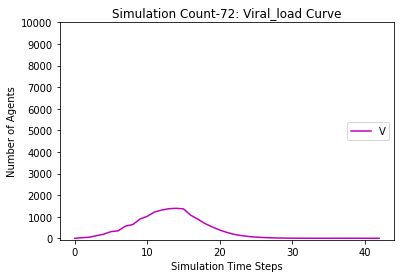

[9806, 9582, 9291, 8922, 8492, 8067, 7545, 6793, 5890, 4937, 3945, 3010, 2273, 1731, 1308, 1016, 779, 619, 529, 460, 409, 366, 346, 337, 325, 319, 316, 314, 311, 307, 307, 306, 306, 305, 305, 304, 304, 303, 303, 300, 299, 298, 296, 295, 295, 295, 295, 295]
[194, 418, 709, 1078, 1314, 1515, 1746, 2129, 2602, 3130, 3600, 3783, 3617, 3206, 2637, 1994, 1494, 1112, 779, 556, 370, 253, 183, 123, 84, 47, 30, 23, 14, 12, 9, 8, 5, 2, 2, 2, 2, 2, 2, 4, 5, 5, 7, 5, 4, 3, 1, 0]
[0, 0, 0, 0, 194, 418, 709, 1078, 1508, 1933, 2455, 3207, 4110, 5063, 6055, 6990, 7727, 8269, 8692, 8984, 9221, 9381, 9471, 9540, 9591, 9634, 9654, 9663, 9675, 9681, 9684, 9686, 9689, 9693, 9693, 9694, 9694, 9695, 9695, 9696, 9696, 9697, 9697, 9700, 9701, 9702, 9704, 9705]
[0.0, 30.0, 57.0, 103.5, 191.75, 280.875, 376.4375, 605.21875, 740.609375, 882.3046875, 1035.15234375, 1357.576171875, 1564.7880859375, 1654.39404296875, 1614.197021484375, 1616.0985107421875, 1444.0492553710938, 1165.0246276855469, 901.5123138427734, 673

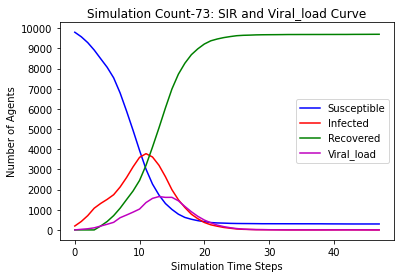

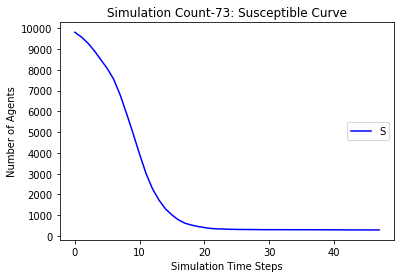

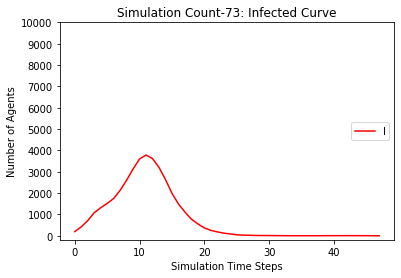

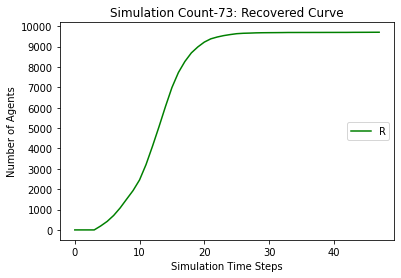

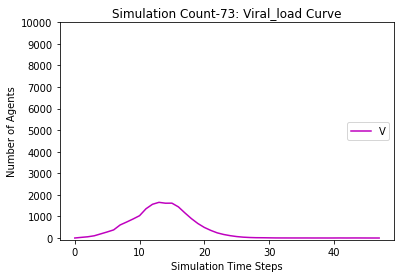

[9806, 9612, 9335, 8953, 8507, 8065, 7496, 6806, 6036, 5161, 4277, 3421, 2669, 2005, 1459, 1064, 792, 614, 500, 432, 383, 343, 322, 300, 291, 284, 279, 279, 278, 277, 277, 277, 277, 277, 277]
[194, 388, 665, 1047, 1299, 1547, 1839, 2147, 2471, 2904, 3219, 3385, 3367, 3156, 2818, 2357, 1877, 1391, 959, 632, 409, 271, 178, 132, 92, 59, 43, 21, 13, 7, 2, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 388, 665, 1047, 1493, 1935, 2504, 3194, 3964, 4839, 5723, 6579, 7331, 7995, 8541, 8936, 9208, 9386, 9500, 9568, 9617, 9657, 9678, 9700, 9709, 9716, 9721, 9721, 9722, 9723, 9723]
[0.0, 26.0, 46.0, 102.0, 213.0, 246.5, 380.25, 484.125, 646.0625, 832.03125, 1011.015625, 1185.5078125, 1346.75390625, 1523.376953125, 1624.6884765625, 1536.34423828125, 1412.172119140625, 1218.0860595703125, 1043.0430297851562, 800.5215148925781, 571.2607574462891, 381.63037872314453, 244.81518936157227, 172.40759468078613, 121.20379734039307, 80.60189867019653, 47.30094933509827, 31.650474667549133, 22.825237333774567, 14.4126186668

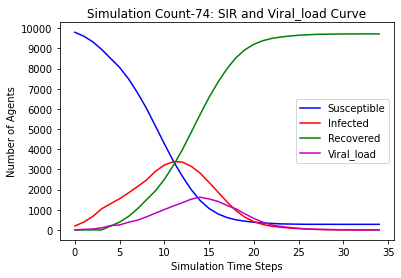

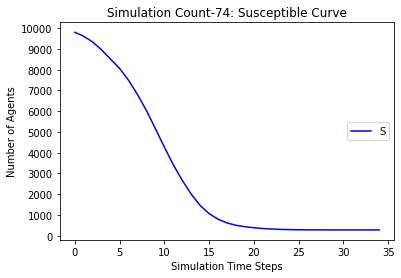

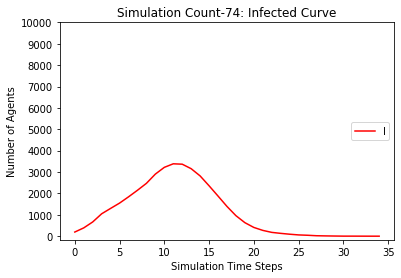

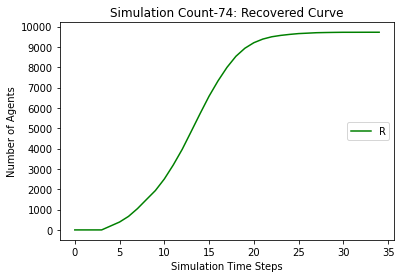

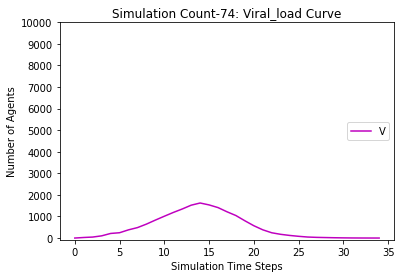

[9806, 9579, 9275, 8901, 8503, 8108, 7538, 6710, 5637, 4520, 3352, 2355, 1547, 1068, 778, 618, 493, 413, 362, 328, 311, 298, 292, 283, 277, 271, 271, 270, 269, 269, 268, 268, 267, 266, 265, 263, 263, 263, 263, 263]
[194, 421, 725, 1099, 1303, 1471, 1737, 2191, 2866, 3588, 4186, 4355, 4090, 3452, 2574, 1737, 1054, 655, 416, 290, 182, 115, 70, 45, 34, 27, 21, 13, 8, 2, 3, 2, 2, 3, 3, 5, 4, 3, 2, 0]
[0, 0, 0, 0, 194, 421, 725, 1099, 1497, 1892, 2462, 3290, 4363, 5480, 6648, 7645, 8453, 8932, 9222, 9382, 9507, 9587, 9638, 9672, 9689, 9702, 9708, 9717, 9723, 9729, 9729, 9730, 9731, 9731, 9732, 9732, 9733, 9734, 9735, 9737]
[0.0, 32.0, 60.0, 101.0, 179.5, 261.75, 435.875, 647.9375, 963.96875, 1146.984375, 1523.4921875, 1875.74609375, 2388.873046875, 2425.4365234375, 2239.71826171875, 1804.859130859375, 1447.4295654296875, 1033.7147827148438, 694.8573913574219, 445.42869567871094, 288.71434783935547, 193.35717391967773, 121.67858695983887, 79.83929347991943, 48.91964673995972, 30.459823369979

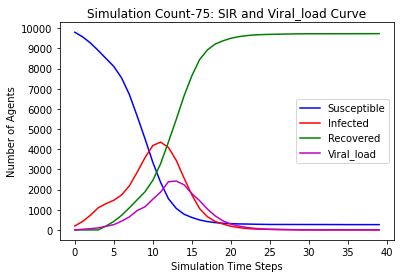

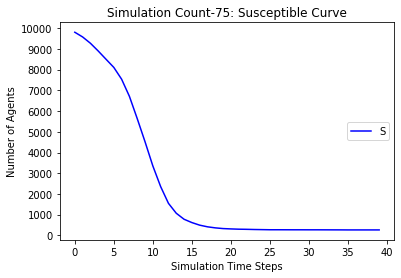

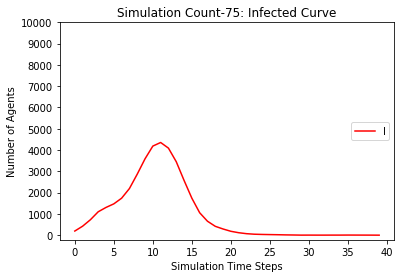

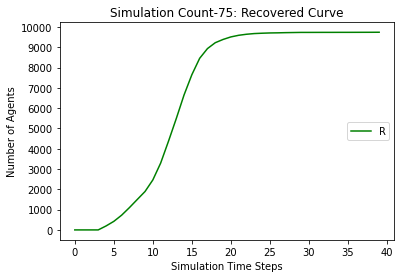

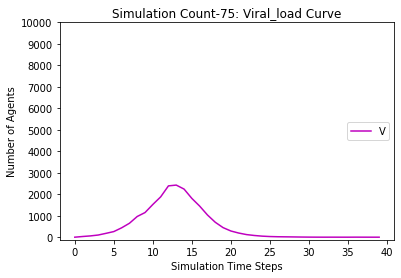

[9806, 9608, 9282, 8859, 8331, 7809, 7143, 6303, 5360, 4347, 3341, 2361, 1573, 1010, 614, 397, 286, 218, 182, 164, 156, 153, 150, 149, 147, 147, 145, 144, 144, 144, 144, 144, 144]
[194, 392, 718, 1141, 1475, 1799, 2139, 2556, 2971, 3462, 3802, 3942, 3787, 3337, 2727, 1964, 1287, 792, 432, 233, 130, 65, 32, 15, 9, 6, 5, 5, 3, 3, 1, 0, 0]
[0, 0, 0, 0, 194, 392, 718, 1141, 1669, 2191, 2857, 3697, 4640, 5653, 6659, 7639, 8427, 8990, 9386, 9603, 9714, 9782, 9818, 9836, 9844, 9847, 9850, 9851, 9853, 9853, 9855, 9856, 9856]
[0.0, 27.0, 65.5, 118.75, 241.375, 338.6875, 449.34375, 671.671875, 921.8359375, 1110.91796875, 1501.458984375, 1964.7294921875, 2202.36474609375, 2464.182373046875, 2535.0911865234375, 2218.5455932617188, 1812.2727966308594, 1334.1363983154297, 910.0681991577148, 578.0340995788574, 351.0170497894287, 207.50852489471436, 121.75426244735718, 70.87713122367859, 39.438565611839294, 23.719282805919647, 12.859641402959824, 7.429820701479912, 3.714910350739956, 2.857455175369978

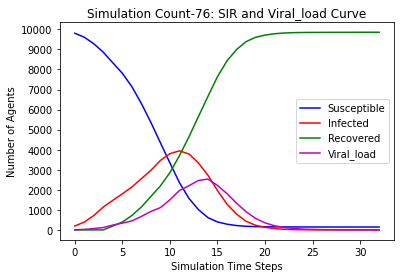

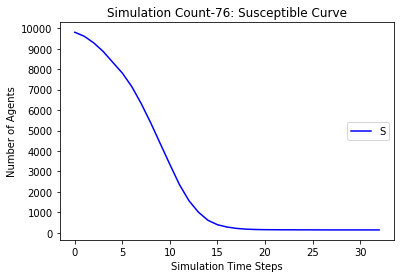

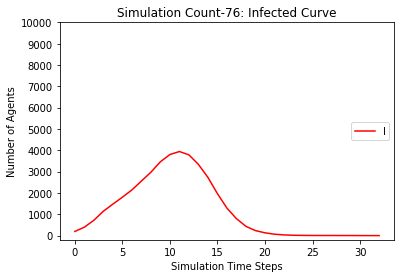

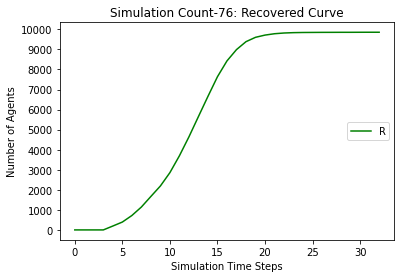

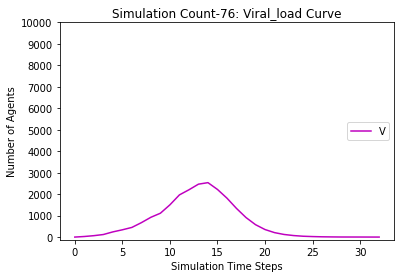

[9806, 9593, 9266, 8808, 8328, 7777, 7223, 6517, 5684, 4714, 3787, 2967, 2178, 1519, 1005, 676, 501, 377, 303, 267, 248, 240, 233, 227, 220, 212, 212, 211, 209, 209, 209, 209, 209, 209]
[194, 407, 734, 1192, 1478, 1816, 2043, 2291, 2644, 3063, 3436, 3550, 3506, 3195, 2782, 2291, 1677, 1142, 702, 409, 253, 137, 70, 40, 28, 28, 21, 16, 11, 3, 3, 2, 0, 0]
[0, 0, 0, 0, 194, 407, 734, 1192, 1672, 2223, 2777, 3483, 4316, 5286, 6213, 7033, 7822, 8481, 8995, 9324, 9499, 9623, 9697, 9733, 9752, 9760, 9767, 9773, 9780, 9788, 9788, 9789, 9791, 9791]
[0.0, 30.0, 51.0, 149.5, 198.75, 350.375, 413.1875, 598.59375, 820.296875, 982.1484375, 1144.07421875, 1389.037109375, 1635.5185546875, 1920.75927734375, 2149.379638671875, 2039.6898193359375, 1738.8449096679688, 1398.4224548339844, 1045.2112274169922, 721.6056137084961, 480.80280685424805, 314.401403427124, 193.200701713562, 111.600350856781, 67.8001754283905, 44.90008771419525, 33.450043857097626, 23.725021928548813, 13.862510964274406, 8.9312554821

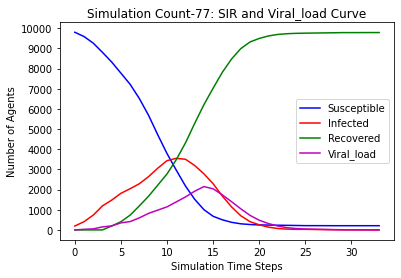

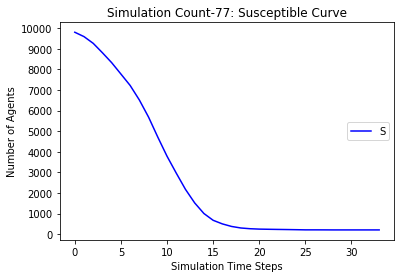

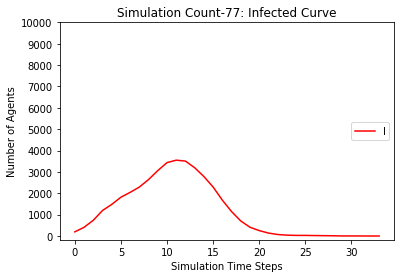

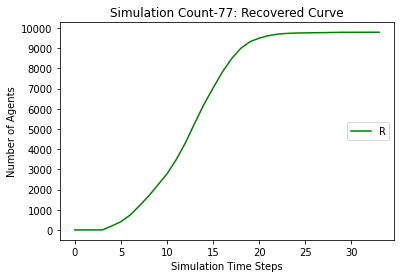

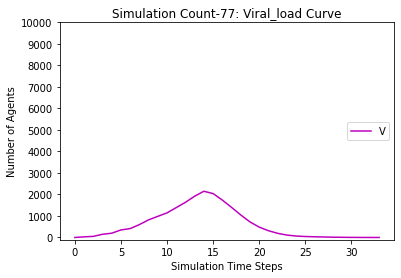

[9806, 9615, 9326, 8952, 8525, 8039, 7438, 6768, 6034, 5202, 4154, 3165, 2209, 1396, 904, 608, 460, 388, 352, 326, 313, 300, 295, 293, 289, 288, 285, 285, 285, 284, 283, 283, 283, 283, 283, 283]
[194, 385, 674, 1048, 1281, 1576, 1888, 2184, 2491, 2837, 3284, 3603, 3825, 3806, 3250, 2557, 1749, 1008, 552, 282, 147, 88, 57, 33, 24, 12, 10, 8, 4, 4, 2, 2, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 385, 674, 1048, 1475, 1961, 2562, 3232, 3966, 4798, 5846, 6835, 7791, 8604, 9096, 9392, 9540, 9612, 9648, 9674, 9687, 9700, 9705, 9707, 9711, 9712, 9715, 9715, 9715, 9716, 9717, 9717]
[0.0, 24.0, 39.0, 84.5, 196.25, 287.125, 387.5625, 470.78125, 611.390625, 803.6953125, 1210.84765625, 1436.423828125, 1888.2119140625, 2292.10595703125, 2485.052978515625, 2378.5264892578125, 1959.2632446289062, 1496.6316223144531, 1040.3158111572266, 674.1579055786133, 399.07895278930664, 231.53947639465332, 132.76973819732666, 83.38486909866333, 49.692434549331665, 30.846217274665833, 18.423108637332916, 9.211554318666458, 5.

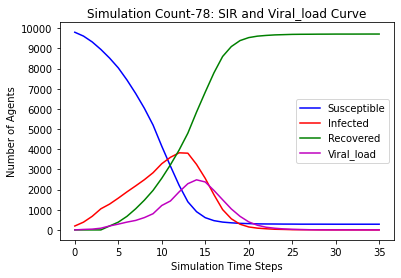

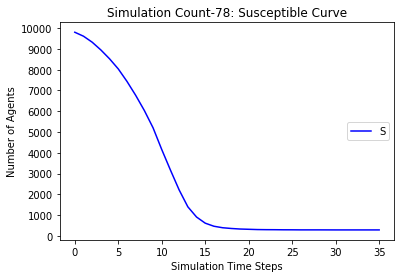

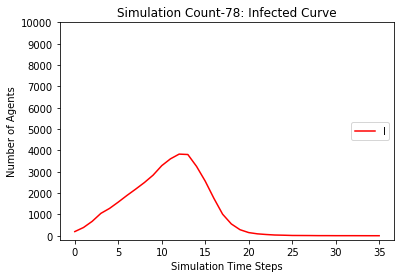

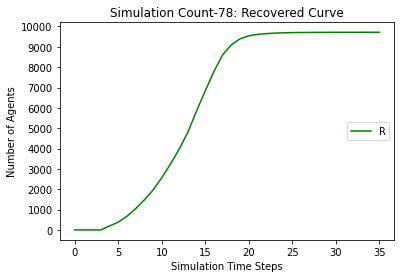

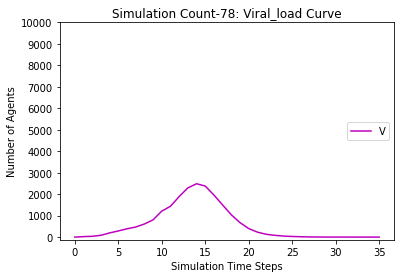

[9806, 9582, 9284, 8847, 8310, 7609, 6747, 5814, 4693, 3525, 2536, 1810, 1303, 980, 729, 584, 534, 493, 462, 443, 429, 425, 419, 415, 414, 412, 410, 409, 408, 408, 408, 408, 408, 408]
[194, 418, 716, 1153, 1496, 1973, 2537, 3033, 3617, 4084, 4211, 4004, 3390, 2545, 1807, 1226, 769, 487, 267, 141, 105, 68, 43, 28, 15, 13, 9, 6, 6, 4, 2, 1, 0, 0]
[0, 0, 0, 0, 194, 418, 716, 1153, 1690, 2391, 3253, 4186, 5307, 6475, 7464, 8190, 8697, 9020, 9271, 9416, 9466, 9507, 9538, 9557, 9571, 9575, 9581, 9585, 9586, 9588, 9590, 9591, 9592, 9592]
[0.0, 33.0, 75.5, 124.75, 275.375, 433.6875, 585.84375, 770.921875, 1175.4609375, 1484.73046875, 1723.365234375, 1840.6826171875, 1873.34130859375, 1783.670654296875, 1645.8353271484375, 1289.9176635742188, 927.9588317871094, 634.9794158935547, 411.48970794677734, 263.7448539733887, 148.87242698669434, 86.43621349334717, 59.218106746673584, 41.60905337333679, 24.804526686668396, 14.402263343334198, 8.201131671667099, 4.1005658358335495, 3.0502829179167747, 1.

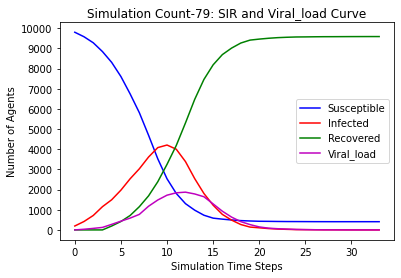

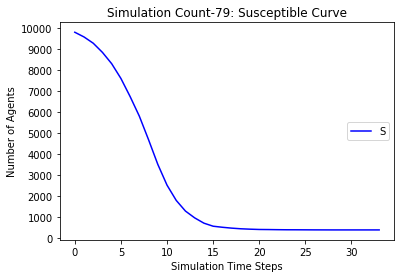

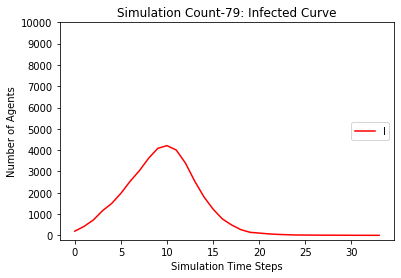

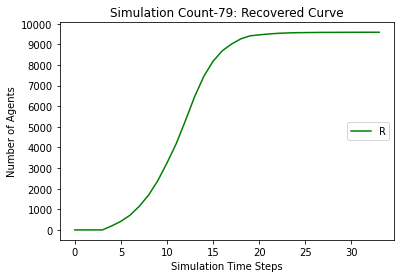

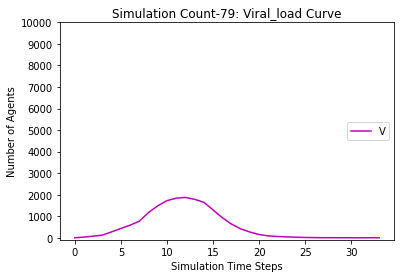

[9806, 9572, 9216, 8812, 8245, 7634, 6863, 5920, 4847, 3840, 2845, 1977, 1382, 989, 786, 658, 570, 509, 479, 453, 444, 443, 440, 439, 438, 438, 437, 435, 434, 434, 434, 434, 434]
[194, 428, 784, 1188, 1561, 1938, 2353, 2892, 3398, 3794, 4018, 3943, 3465, 2851, 2059, 1319, 812, 480, 307, 205, 126, 66, 39, 14, 6, 5, 3, 4, 4, 4, 3, 1, 0]
[0, 0, 0, 0, 194, 428, 784, 1188, 1755, 2366, 3137, 4080, 5153, 6160, 7155, 8023, 8618, 9011, 9214, 9342, 9430, 9491, 9521, 9547, 9556, 9557, 9560, 9561, 9562, 9562, 9563, 9565, 9566]
[0.0, 31.0, 77.5, 138.75, 325.375, 364.6875, 496.34375, 753.171875, 1086.5859375, 1211.29296875, 1689.646484375, 1976.8232421875, 1946.41162109375, 1930.205810546875, 1657.1029052734375, 1345.5514526367188, 962.7757263183594, 644.3878631591797, 427.19393157958984, 271.5969657897949, 168.79848289489746, 112.39924144744873, 63.199620723724365, 37.59981036186218, 18.79990518093109, 10.399952590465546, 5.199976295232773, 2.5999881476163864, 3.299994073808193, 1.6499970369040966,

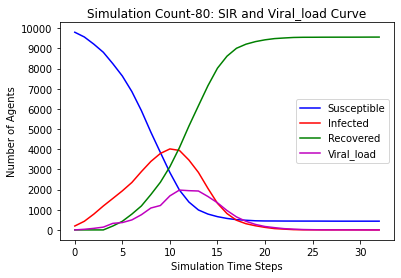

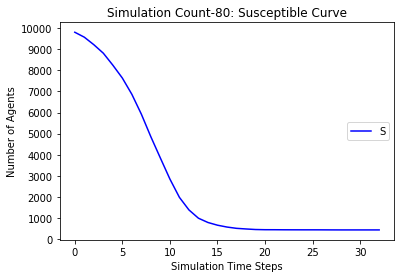

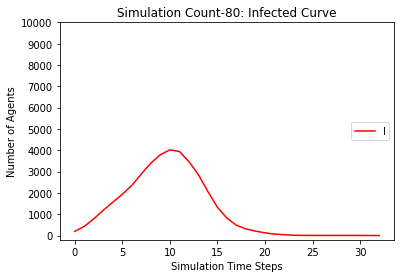

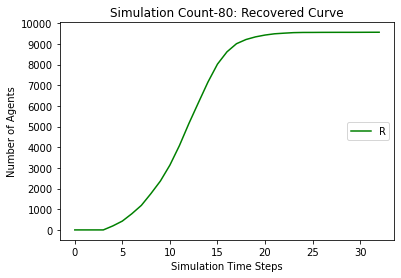

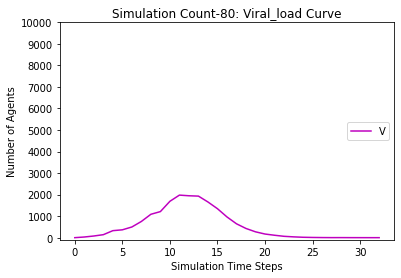

[9806, 9606, 9279, 8874, 8376, 7791, 7040, 6161, 5125, 3985, 2859, 1965, 1294, 846, 594, 437, 346, 292, 265, 240, 233, 226, 216, 215, 214, 213, 212, 212, 212, 212, 210, 209, 209, 209, 208, 208, 208, 208, 208]
[194, 394, 721, 1126, 1430, 1815, 2239, 2713, 3251, 3806, 4181, 4196, 3831, 3139, 2265, 1528, 948, 554, 329, 197, 113, 66, 49, 25, 19, 13, 4, 3, 2, 1, 2, 3, 3, 3, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 394, 721, 1126, 1624, 2209, 2960, 3839, 4875, 6015, 7141, 8035, 8706, 9154, 9406, 9563, 9654, 9708, 9735, 9760, 9767, 9774, 9784, 9785, 9786, 9787, 9788, 9788, 9788, 9788, 9790, 9791, 9791, 9791, 9792]
[0.0, 30.0, 50.0, 111.0, 284.5, 342.25, 567.125, 715.5625, 911.78125, 1345.890625, 1736.9453125, 1946.47265625, 2218.236328125, 2318.1181640625, 1994.05908203125, 1551.029541015625, 1156.5147705078125, 796.2573852539062, 537.1286926269531, 337.56434631347656, 212.78217315673828, 134.39108657836914, 80.19554328918457, 50.097771644592285, 31.048885822296143, 22.52444291114807, 15.262221455574

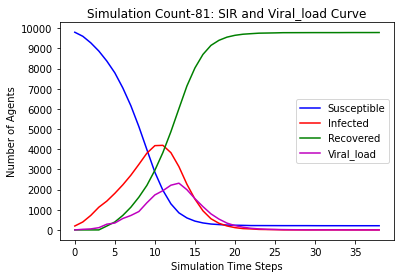

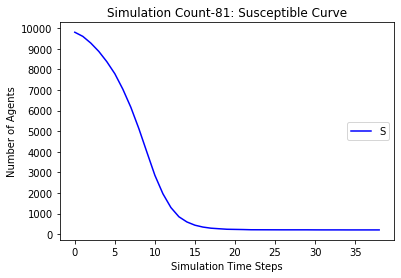

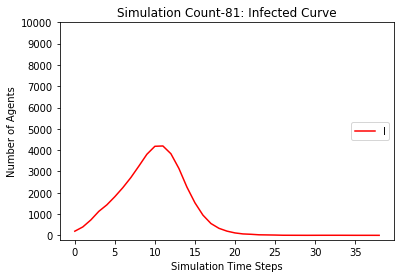

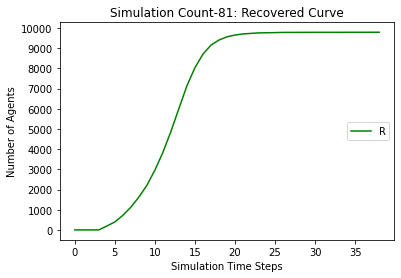

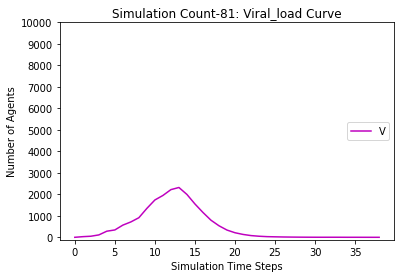

[9806, 9590, 9280, 8859, 8294, 7675, 6824, 5829, 4543, 3299, 2179, 1358, 839, 572, 391, 296, 252, 223, 214, 207, 205, 199, 197, 194, 192, 189, 189, 188, 188, 188, 188, 188]
[194, 410, 720, 1141, 1512, 1915, 2456, 3030, 3751, 4376, 4645, 4471, 3704, 2727, 1788, 1062, 587, 349, 177, 89, 47, 24, 17, 13, 13, 10, 8, 6, 4, 1, 1, 0]
[0, 0, 0, 0, 194, 410, 720, 1141, 1706, 2325, 3176, 4171, 5457, 6701, 7821, 8642, 9161, 9428, 9609, 9704, 9748, 9777, 9786, 9793, 9795, 9801, 9803, 9806, 9808, 9811, 9811, 9812]
[0.0, 28.0, 56.0, 141.0, 304.5, 387.25, 568.625, 804.3125, 1304.15625, 1595.078125, 2271.5390625, 2571.76953125, 2754.884765625, 2728.4423828125, 2354.22119140625, 1864.110595703125, 1288.0552978515625, 838.0276489257812, 521.0138244628906, 304.5069122314453, 172.25345611572266, 101.12672805786133, 59.563364028930664, 33.78168201446533, 21.890841007232666, 12.945420503616333, 8.472710251808167, 4.236355125904083, 3.1181775629520416, 2.559088781476021, 1.2795443907380104, 0.6397721953690052

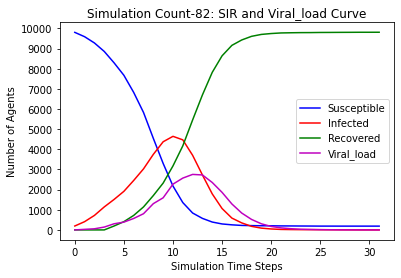

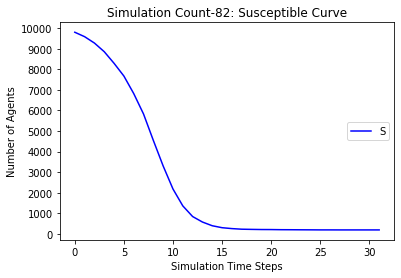

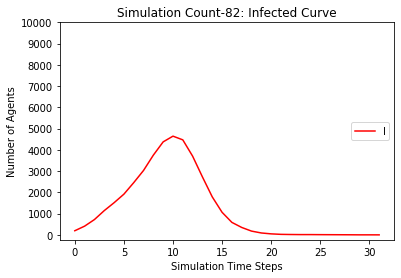

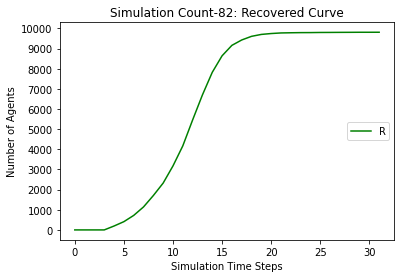

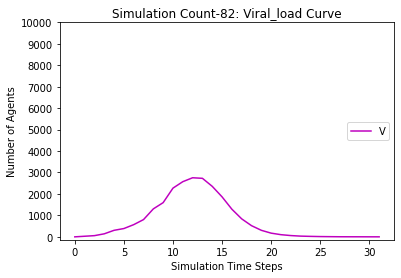

[9806, 9592, 9295, 8906, 8448, 7879, 7250, 6516, 5654, 4641, 3584, 2607, 1801, 1192, 800, 592, 465, 399, 359, 335, 321, 316, 313, 310, 310, 310, 310, 309, 307, 306, 305, 305, 305, 305, 304, 303, 303, 303, 303, 303]
[194, 408, 705, 1094, 1358, 1713, 2045, 2390, 2794, 3238, 3666, 3909, 3853, 3449, 2784, 2015, 1336, 793, 441, 257, 144, 83, 46, 25, 11, 6, 3, 1, 3, 4, 5, 4, 2, 1, 1, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 408, 705, 1094, 1552, 2121, 2750, 3484, 4346, 5359, 6416, 7393, 8199, 8808, 9200, 9408, 9535, 9601, 9641, 9665, 9679, 9684, 9687, 9690, 9690, 9690, 9690, 9691, 9693, 9694, 9695, 9695, 9695, 9695, 9696, 9697]
[0.0, 28.0, 56.0, 121.0, 236.5, 338.25, 386.125, 555.0625, 731.53125, 1088.765625, 1473.3828125, 1630.69140625, 1860.345703125, 2074.1728515625, 2001.08642578125, 1736.543212890625, 1349.2716064453125, 993.6358032226562, 681.8179016113281, 450.90895080566406, 277.45447540283203, 167.72723770141602, 99.86361885070801, 54.931809425354004, 30.465904712677002, 17.2329523563385, 8

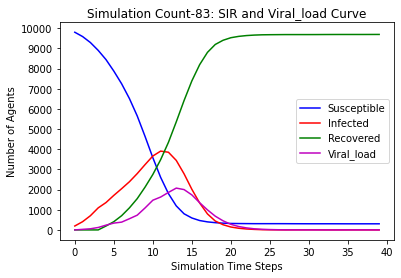

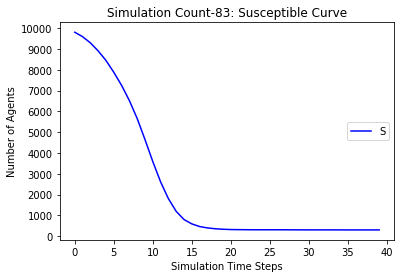

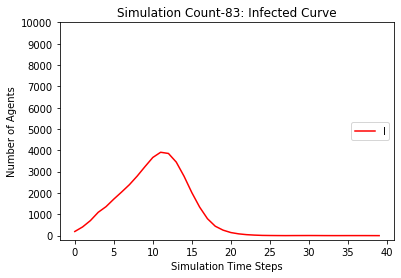

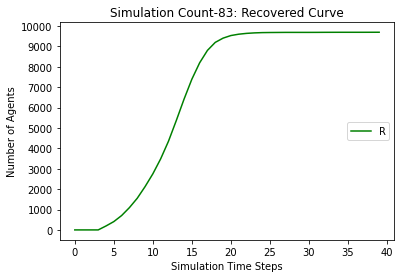

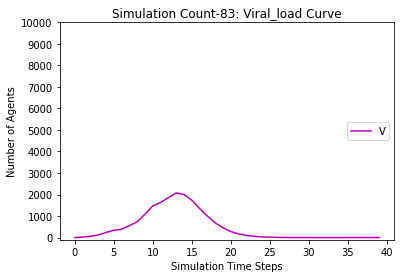

[9806, 9590, 9280, 8863, 8390, 7935, 7332, 6615, 5761, 4949, 4108, 3223, 2397, 1689, 1218, 877, 651, 522, 451, 410, 377, 362, 346, 333, 328, 323, 321, 320, 319, 319, 319, 316, 315, 315, 314, 312, 312, 312, 312, 312]
[194, 410, 720, 1137, 1416, 1655, 1948, 2248, 2629, 2986, 3224, 3392, 3364, 3260, 2890, 2346, 1746, 1167, 767, 467, 274, 160, 105, 77, 49, 39, 25, 13, 9, 4, 2, 4, 4, 4, 5, 4, 3, 3, 2, 0]
[0, 0, 0, 0, 194, 410, 720, 1137, 1610, 2065, 2668, 3385, 4239, 5051, 5892, 6777, 7603, 8311, 8782, 9123, 9349, 9478, 9549, 9590, 9623, 9638, 9654, 9667, 9672, 9677, 9679, 9680, 9681, 9681, 9681, 9684, 9685, 9685, 9686, 9688]
[0.0, 28.0, 46.0, 132.0, 232.0, 287.0, 461.5, 557.75, 718.875, 845.4375, 1148.71875, 1409.359375, 1723.6796875, 1829.83984375, 1893.919921875, 1797.9599609375, 1637.97998046875, 1311.989990234375, 964.9949951171875, 690.4974975585938, 480.2487487792969, 317.12437438964844, 196.56218719482422, 120.28109359741211, 74.14054679870605, 49.07027339935303, 29.535136699676514,

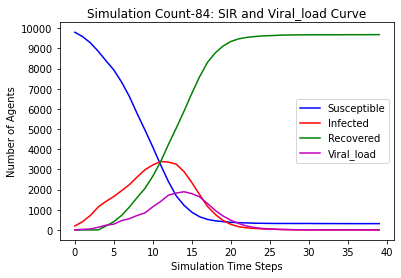

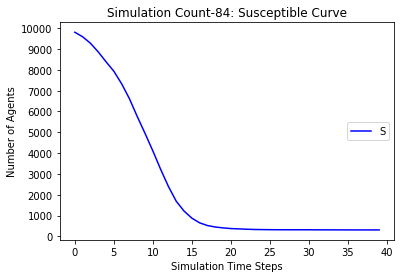

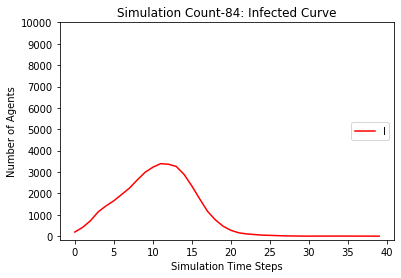

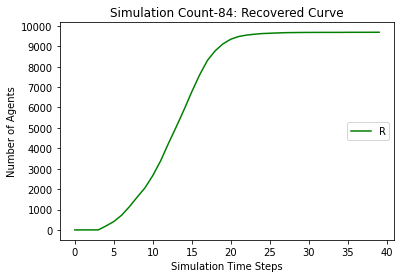

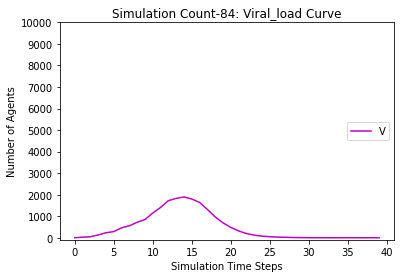

[9806, 9593, 9268, 8885, 8503, 8037, 7469, 6775, 5979, 5109, 4162, 3275, 2463, 1770, 1293, 952, 751, 586, 487, 423, 390, 360, 344, 330, 321, 317, 316, 316, 316, 316, 316, 315, 315, 315, 314, 314, 314, 314, 314]
[194, 407, 732, 1115, 1303, 1556, 1799, 2110, 2524, 2928, 3307, 3500, 3516, 3339, 2869, 2323, 1712, 1184, 806, 529, 361, 226, 143, 93, 69, 43, 28, 14, 5, 1, 0, 1, 1, 1, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 407, 732, 1115, 1497, 1963, 2531, 3225, 4021, 4891, 5838, 6725, 7537, 8230, 8707, 9048, 9249, 9414, 9513, 9577, 9610, 9640, 9656, 9670, 9679, 9683, 9684, 9684, 9684, 9684, 9684, 9685, 9685, 9685, 9686]
[0.0, 29.0, 54.5, 107.25, 190.625, 289.3125, 369.65625, 522.828125, 619.4140625, 805.70703125, 946.853515625, 1099.4267578125, 1414.71337890625, 1581.356689453125, 1543.6783447265625, 1490.8391723632812, 1346.4195861816406, 1168.2097930908203, 916.1048965454102, 647.0524482727051, 449.52622413635254, 300.76311206817627, 201.38155603408813, 134.69077801704407, 86.34538900852203, 55.1

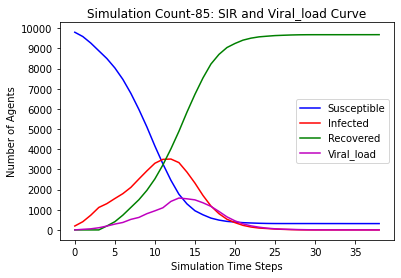

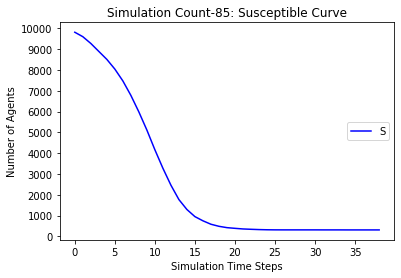

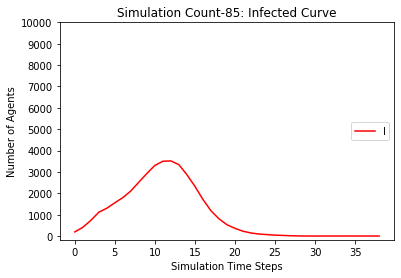

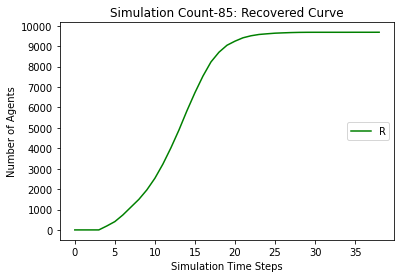

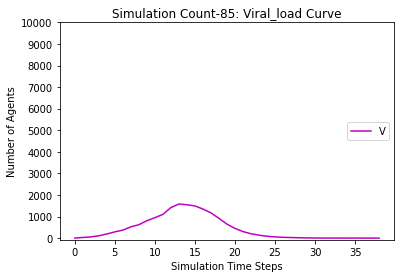

[9806, 9599, 9280, 8900, 8368, 7756, 6972, 5959, 4826, 3762, 2669, 1832, 1253, 869, 631, 481, 418, 372, 356, 346, 339, 333, 330, 329, 328, 327, 327, 326, 325, 325, 325, 325, 325]
[194, 401, 720, 1100, 1438, 1843, 2308, 2941, 3542, 3994, 4303, 4127, 3573, 2893, 2038, 1351, 835, 497, 275, 135, 79, 39, 26, 17, 11, 6, 3, 3, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 401, 720, 1100, 1632, 2244, 3028, 4041, 5174, 6238, 7331, 8168, 8747, 9131, 9369, 9519, 9582, 9628, 9644, 9654, 9661, 9667, 9670, 9671, 9672, 9673, 9673, 9674, 9675]
[0.0, 33.0, 66.5, 130.25, 301.125, 377.5625, 529.78125, 842.890625, 1212.4453125, 1418.22265625, 1871.111328125, 2121.5556640625, 2187.77783203125, 2089.888916015625, 1835.9444580078125, 1515.9722290039062, 1089.9861145019531, 736.9930572509766, 492.4965286254883, 319.24826431274414, 184.62413215637207, 106.31206607818604, 60.15603303909302, 35.07801651954651, 21.539008259773254, 13.769504129886627, 8.884752064943314, 5.442376032471657, 2.7211880162358284, 2.360594008117914,

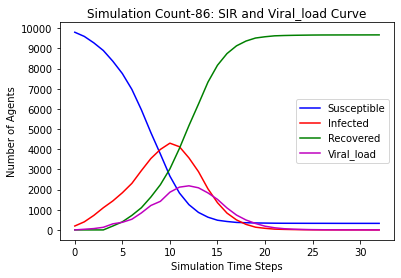

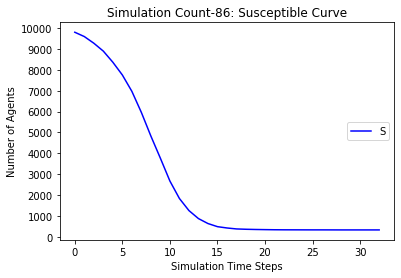

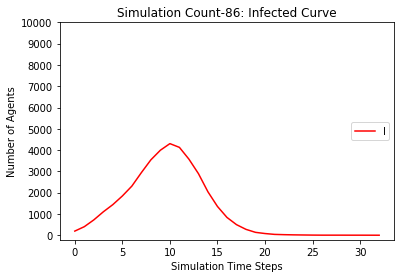

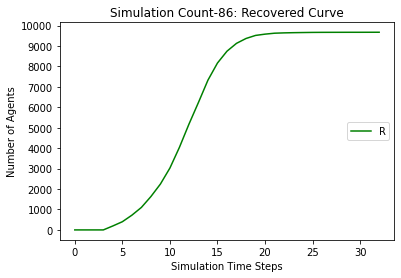

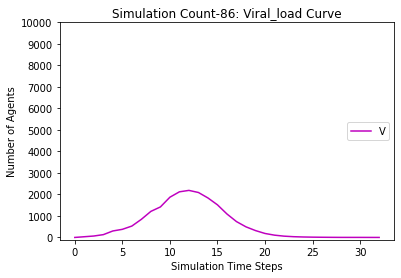

[9806, 9584, 9255, 8809, 8359, 7856, 7274, 6564, 5716, 4826, 3962, 3135, 2426, 1850, 1400, 1081, 857, 708, 602, 540, 488, 459, 442, 424, 417, 405, 397, 396, 393, 388, 386, 386, 386, 386, 385, 384, 384, 384, 384, 383, 383, 383, 381, 381, 379, 378, 376, 376, 376, 376, 376]
[194, 416, 745, 1191, 1447, 1728, 1981, 2245, 2643, 3030, 3312, 3429, 3290, 2976, 2562, 2054, 1569, 1142, 798, 541, 369, 249, 160, 116, 71, 54, 45, 28, 24, 17, 11, 10, 7, 2, 1, 2, 2, 2, 1, 1, 1, 1, 3, 2, 4, 5, 5, 5, 3, 2, 0]
[0, 0, 0, 0, 194, 416, 745, 1191, 1641, 2144, 2726, 3436, 4284, 5174, 6038, 6865, 7574, 8150, 8600, 8919, 9143, 9292, 9398, 9460, 9512, 9541, 9558, 9576, 9583, 9595, 9603, 9604, 9607, 9612, 9614, 9614, 9614, 9614, 9615, 9616, 9616, 9616, 9616, 9617, 9617, 9617, 9619, 9619, 9621, 9622, 9624]
[0.0, 32.0, 77.0, 121.5, 193.75, 314.875, 473.4375, 625.71875, 748.859375, 944.4296875, 993.21484375, 1172.607421875, 1323.3037109375, 1367.65185546875, 1477.825927734375, 1323.9129638671875, 1174.9564819335938,

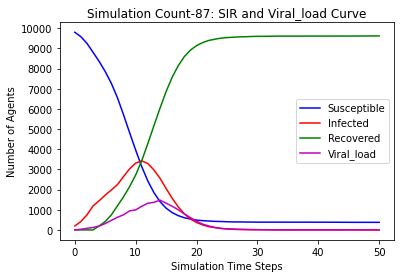

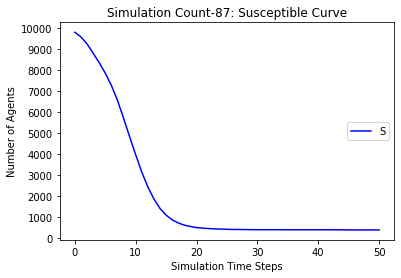

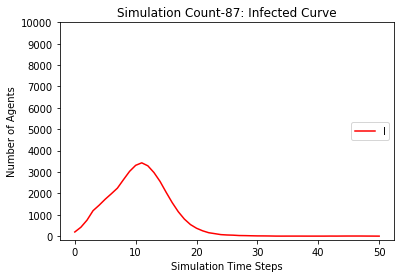

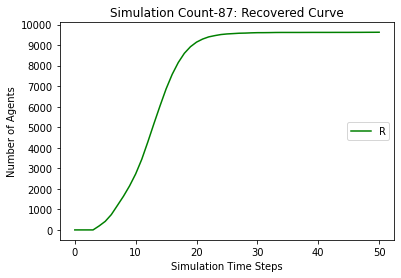

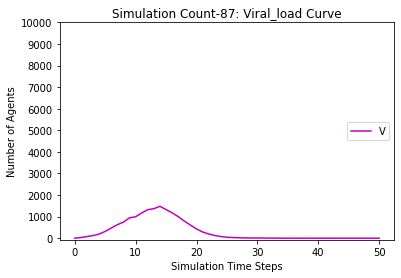

[9806, 9581, 9221, 8741, 8117, 7402, 6590, 5607, 4490, 3336, 2294, 1544, 1029, 708, 531, 452, 402, 371, 361, 352, 341, 334, 329, 328, 328, 328, 328, 327, 327, 327, 327, 327]
[194, 419, 779, 1259, 1689, 2179, 2631, 3134, 3627, 4066, 4296, 4063, 3461, 2628, 1763, 1092, 627, 337, 170, 100, 61, 37, 32, 24, 13, 6, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 419, 779, 1259, 1883, 2598, 3410, 4393, 5510, 6664, 7706, 8456, 8971, 9292, 9469, 9548, 9598, 9629, 9639, 9648, 9659, 9666, 9671, 9672, 9672, 9672, 9672, 9673]
[0.0, 30.0, 80.0, 196.0, 335.0, 452.5, 580.25, 901.125, 1308.5625, 1682.28125, 2007.140625, 2130.5703125, 2219.28515625, 2069.642578125, 1659.8212890625, 1251.91064453125, 843.955322265625, 542.9776611328125, 335.48883056640625, 196.74441528320312, 117.37220764160156, 68.68610382080078, 42.34305191040039, 23.171525955200195, 14.585762977600098, 9.292881488800049, 5.646440744400024, 2.823220372200012, 1.411610186100006, 0.705805093050003, 0.3529025465250015, 0.17645127326250076]
[[], [9806

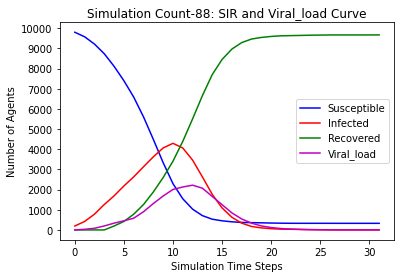

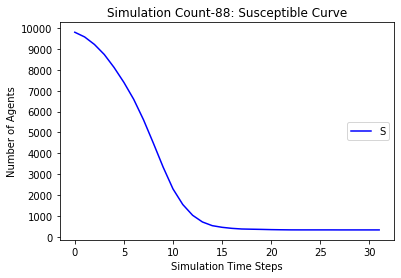

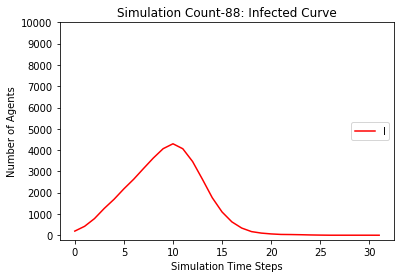

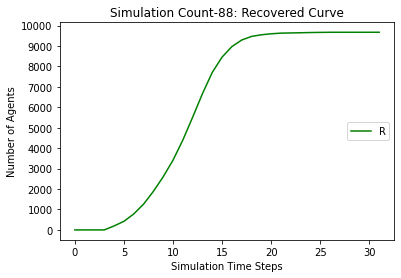

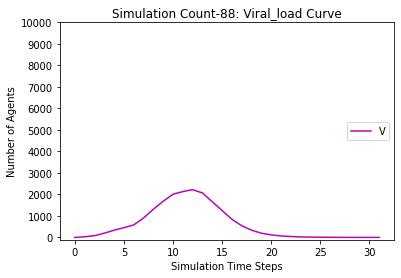

[9806, 9612, 9262, 8893, 8449, 8026, 7405, 6708, 5924, 5086, 4160, 3242, 2424, 1796, 1344, 1027, 832, 703, 608, 549, 517, 490, 474, 461, 452, 449, 445, 443, 441, 440, 439, 439, 439, 438, 437, 434, 433, 433, 433, 433, 433]
[194, 388, 738, 1107, 1357, 1586, 1857, 2185, 2525, 2940, 3245, 3466, 3500, 3290, 2816, 2215, 1592, 1093, 736, 478, 315, 213, 134, 88, 65, 41, 29, 18, 11, 9, 6, 4, 2, 2, 2, 5, 6, 5, 4, 1, 0]
[0, 0, 0, 0, 194, 388, 738, 1107, 1551, 1974, 2595, 3292, 4076, 4914, 5840, 6758, 7576, 8204, 8656, 8973, 9168, 9297, 9392, 9451, 9483, 9510, 9526, 9539, 9548, 9551, 9555, 9557, 9559, 9560, 9561, 9561, 9561, 9562, 9563, 9566, 9567]
[0.0, 28.0, 58.0, 104.0, 223.0, 250.5, 446.25, 499.125, 616.5625, 816.28125, 1102.140625, 1376.0703125, 1526.03515625, 1491.017578125, 1540.5087890625, 1487.25439453125, 1240.627197265625, 1058.3135986328125, 801.1567993164062, 578.5783996582031, 387.28919982910156, 258.6445999145508, 168.3222999572754, 112.1611499786377, 74.08057498931885, 49.040287494

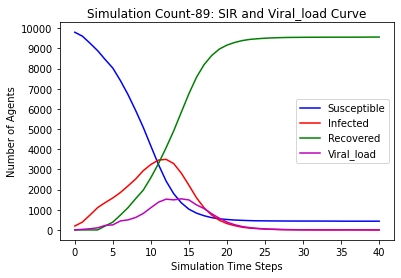

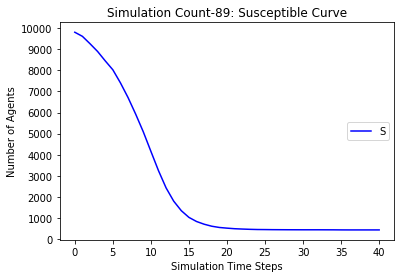

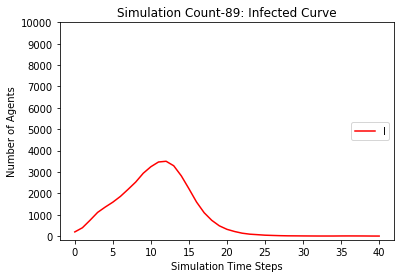

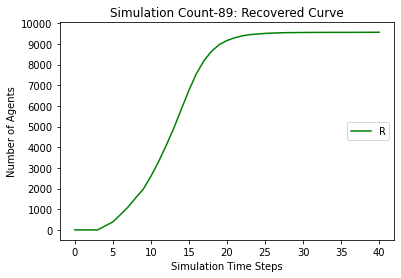

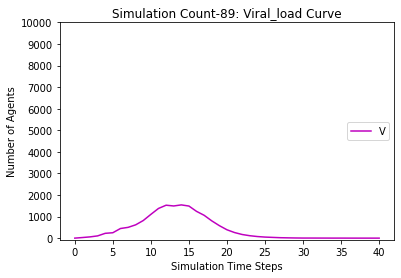

[9806, 9569, 9265, 8929, 8512, 8069, 7443, 6748, 5890, 4895, 3859, 2991, 2244, 1712, 1264, 939, 758, 621, 534, 474, 441, 419, 401, 392, 388, 382, 380, 380, 379, 378, 378, 378, 378, 378]
[194, 431, 735, 1071, 1294, 1500, 1822, 2181, 2622, 3174, 3584, 3757, 3646, 3183, 2595, 2052, 1486, 1091, 730, 465, 317, 202, 133, 82, 53, 37, 21, 12, 9, 4, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 431, 735, 1071, 1488, 1931, 2557, 3252, 4110, 5105, 6141, 7009, 7756, 8288, 8736, 9061, 9242, 9379, 9466, 9526, 9559, 9581, 9599, 9608, 9612, 9618, 9620, 9620, 9621, 9622]
[0.0, 26.0, 47.0, 98.5, 193.25, 267.625, 473.8125, 546.90625, 699.453125, 973.7265625, 1287.86328125, 1490.931640625, 1658.4658203125, 1691.23291015625, 1809.616455078125, 1632.8082275390625, 1374.4041137695312, 1086.2020568847656, 819.1010284423828, 573.5505142211914, 406.7752571105957, 267.38762855529785, 179.69381427764893, 127.84690713882446, 82.92345356941223, 49.461726784706116, 26.730863392353058, 15.365431696176529, 9.682715848088264, 5.841357

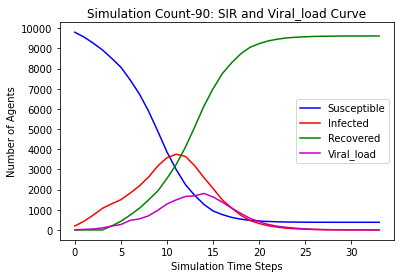

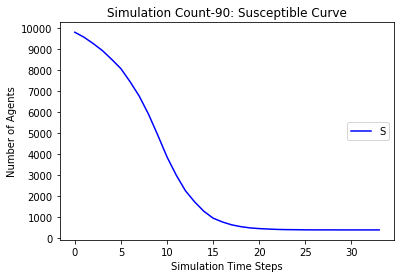

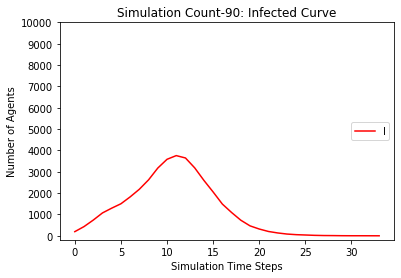

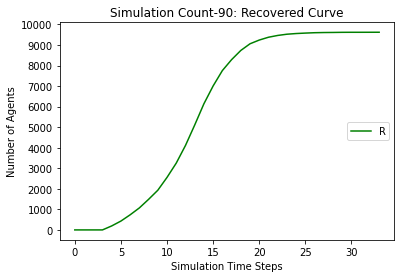

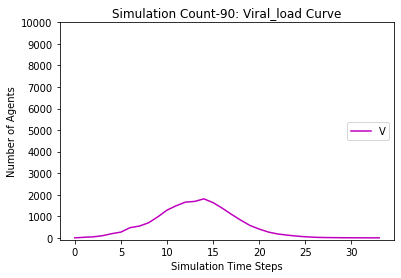

[9806, 9593, 9293, 8913, 8473, 7966, 7342, 6471, 5517, 4489, 3504, 2674, 1961, 1393, 979, 680, 484, 367, 299, 261, 238, 225, 216, 210, 205, 202, 199, 197, 195, 193, 193, 193, 192, 192, 192, 191, 191, 191, 191, 191]
[194, 407, 707, 1087, 1333, 1627, 1951, 2442, 2956, 3477, 3838, 3797, 3556, 3096, 2525, 1994, 1477, 1026, 680, 419, 246, 142, 83, 51, 33, 23, 17, 13, 10, 9, 6, 4, 3, 1, 1, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 407, 707, 1087, 1527, 2034, 2658, 3529, 4483, 5511, 6496, 7326, 8039, 8607, 9021, 9320, 9516, 9633, 9701, 9739, 9762, 9775, 9784, 9790, 9795, 9798, 9801, 9803, 9805, 9807, 9807, 9807, 9808, 9808, 9808, 9809]
[0.0, 30.0, 48.0, 102.0, 227.0, 374.5, 428.25, 637.125, 804.5625, 1112.28125, 1299.140625, 1512.5703125, 1792.28515625, 2019.142578125, 2105.5712890625, 1922.78564453125, 1670.392822265625, 1374.1964111328125, 1011.0982055664062, 728.5491027832031, 500.27455139160156, 330.1372756958008, 215.0686378479004, 138.5343189239502, 81.2671594619751, 53.63357973098755, 30.816789

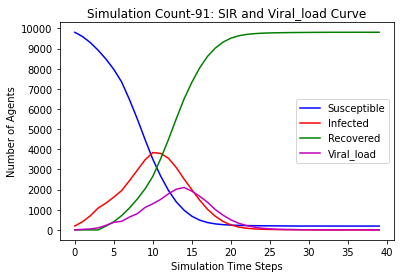

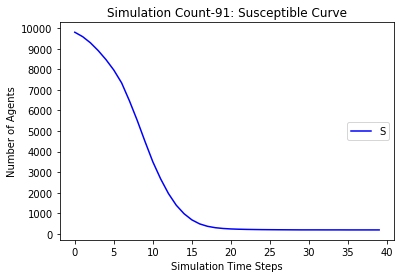

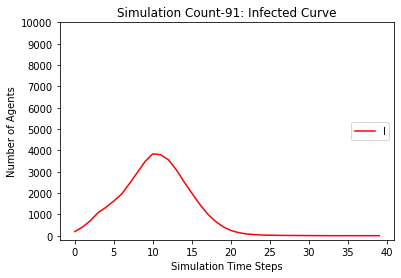

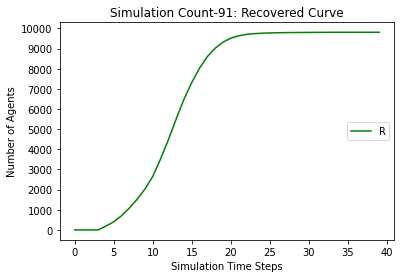

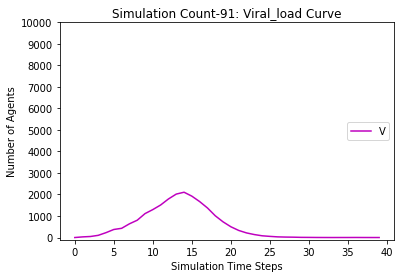

[9806, 9592, 9277, 8829, 8322, 7726, 6949, 6038, 5006, 3838, 2735, 1825, 1271, 880, 651, 545, 459, 414, 392, 372, 359, 353, 350, 347, 345, 345, 345, 345, 345, 345, 345]
[194, 408, 723, 1171, 1484, 1866, 2328, 2791, 3316, 3888, 4214, 4213, 3735, 2958, 2084, 1280, 812, 466, 259, 173, 100, 61, 42, 25, 14, 8, 5, 2, 0, 0, 0]
[0, 0, 0, 0, 194, 408, 723, 1171, 1678, 2274, 3051, 3962, 4994, 6162, 7265, 8175, 8729, 9120, 9349, 9455, 9541, 9586, 9608, 9628, 9641, 9647, 9650, 9653, 9655, 9655, 9655]
[0.0, 28.0, 57.0, 174.5, 248.25, 379.125, 516.5625, 693.28125, 1014.640625, 1503.3203125, 1825.66015625, 2183.830078125, 2352.9150390625, 2360.45751953125, 2001.228759765625, 1583.6143798828125, 1144.8071899414062, 712.4035949707031, 441.20179748535156, 257.6008987426758, 163.8004493713379, 97.90022468566895, 55.95011234283447, 35.975056171417236, 22.987528085708618, 13.493764042854309, 7.7468820214271545, 4.873441010713577, 2.4367205053567886, 1.2183602526783943, 0.6091801263391972]
[[], [9806, 9581,

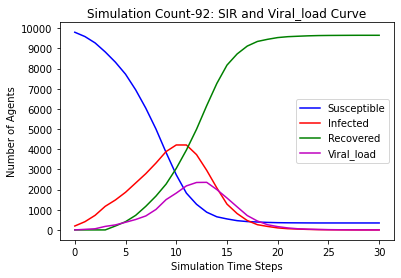

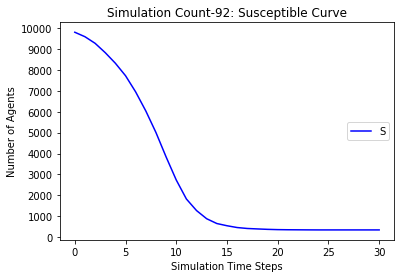

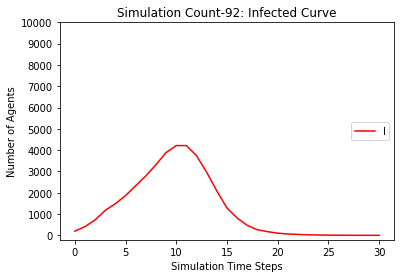

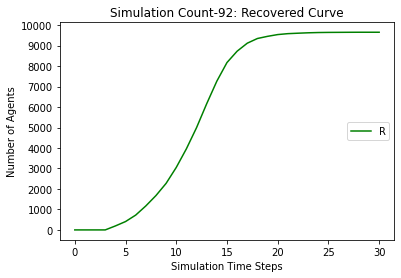

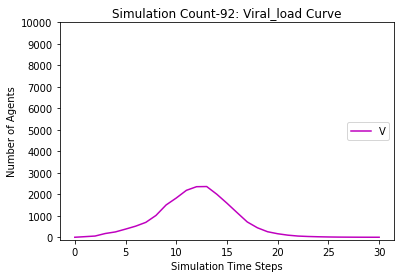

[9806, 9578, 9257, 8847, 8397, 7753, 7009, 6137, 5144, 4162, 3208, 2379, 1724, 1248, 894, 670, 510, 420, 367, 339, 320, 307, 297, 293, 291, 290, 290, 289, 289, 288, 288, 287, 285, 284, 283, 282, 282, 282, 281, 281, 281, 280, 280, 280, 280, 280]
[194, 422, 743, 1153, 1409, 1825, 2248, 2710, 3253, 3591, 3801, 3758, 3420, 2914, 2314, 1709, 1214, 828, 527, 331, 190, 113, 70, 46, 29, 17, 7, 4, 2, 2, 2, 2, 4, 4, 5, 5, 3, 2, 2, 1, 1, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 194, 422, 743, 1153, 1603, 2247, 2991, 3863, 4856, 5838, 6792, 7621, 8276, 8752, 9106, 9330, 9490, 9580, 9633, 9661, 9680, 9693, 9703, 9707, 9709, 9710, 9710, 9711, 9711, 9712, 9712, 9713, 9715, 9716, 9717, 9718, 9718, 9718, 9719, 9719, 9719, 9720]
[0.0, 29.0, 56.5, 139.25, 247.625, 403.8125, 518.90625, 702.453125, 1037.2265625, 1179.61328125, 1396.806640625, 1727.4033203125, 1854.70166015625, 1917.350830078125, 1790.6754150390625, 1726.3377075195312, 1450.1688537597656, 1106.0844268798828, 821.0422134399414, 565.5211067199707, 358.760

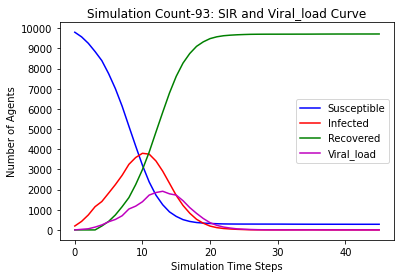

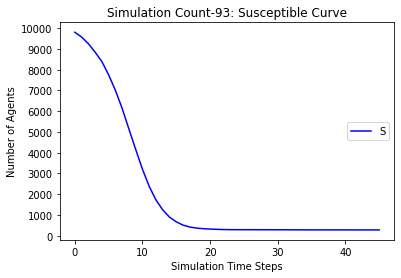

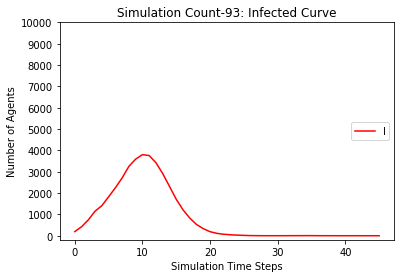

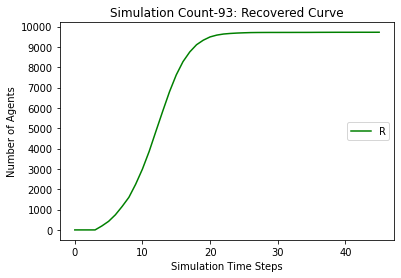

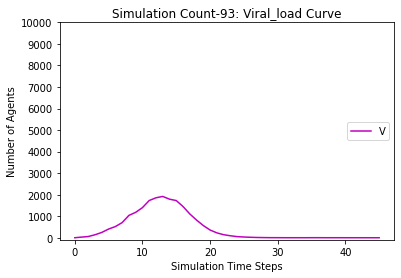

[9806, 9572, 9229, 8808, 8299, 7708, 6952, 6037, 4987, 3891, 2804, 1874, 1219, 786, 539, 391, 331, 283, 258, 239, 230, 223, 216, 213, 213, 212, 211, 211, 211, 210, 209, 207, 207, 204, 203, 202, 201, 201, 201, 200, 200, 200, 199, 199, 199, 199, 198, 196, 194, 194, 194, 194, 194, 194, 194]
[194, 428, 771, 1192, 1507, 1864, 2277, 2771, 3312, 3817, 4148, 4163, 3768, 3105, 2265, 1483, 888, 503, 281, 152, 101, 60, 42, 26, 17, 11, 5, 2, 2, 2, 2, 4, 4, 6, 6, 5, 6, 3, 2, 2, 1, 1, 2, 1, 1, 1, 1, 3, 5, 5, 4, 2, 0, 0, 0]
[0, 0, 0, 0, 194, 428, 771, 1192, 1701, 2292, 3048, 3963, 5013, 6109, 7196, 8126, 8781, 9214, 9461, 9609, 9669, 9717, 9742, 9761, 9770, 9777, 9784, 9787, 9787, 9788, 9789, 9789, 9789, 9790, 9791, 9793, 9793, 9796, 9797, 9798, 9799, 9799, 9799, 9800, 9800, 9800, 9801, 9801, 9801, 9801, 9802, 9804, 9806, 9806, 9806]
[0.0, 27.0, 53.5, 120.75, 288.375, 403.1875, 531.59375, 775.796875, 973.8984375, 1334.94921875, 1738.474609375, 2113.2373046875, 2253.61865234375, 2401.809326171875, 228

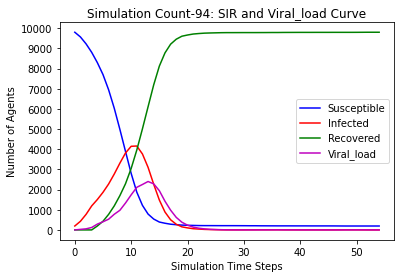

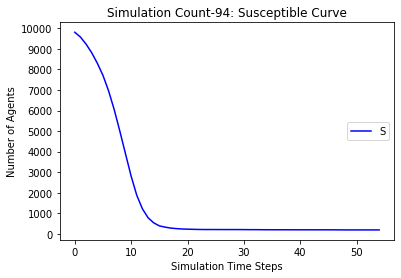

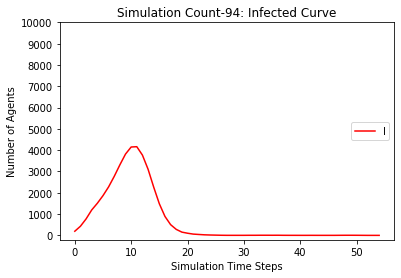

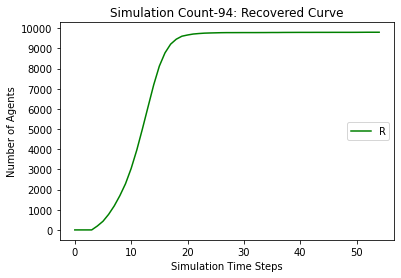

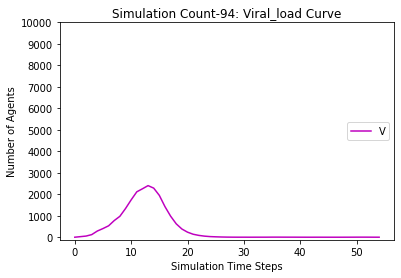

[9806, 9570, 9240, 8840, 8429, 7951, 7254, 6448, 5574, 4582, 3582, 2652, 1898, 1360, 1037, 805, 645, 546, 500, 460, 438, 426, 417, 407, 404, 400, 398, 397, 395, 395, 394, 394, 393, 392, 392, 392, 392, 392]
[194, 430, 760, 1160, 1377, 1619, 1986, 2392, 2855, 3369, 3672, 3796, 3676, 3222, 2545, 1847, 1253, 814, 537, 345, 207, 120, 83, 53, 34, 26, 19, 10, 9, 5, 4, 3, 2, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 430, 760, 1160, 1571, 2049, 2746, 3552, 4426, 5418, 6418, 7348, 8102, 8640, 8963, 9195, 9355, 9454, 9500, 9540, 9562, 9574, 9583, 9593, 9596, 9600, 9602, 9603, 9605, 9605, 9606, 9606, 9607, 9608]
[0.0, 28.0, 58.0, 119.0, 207.5, 282.75, 552.375, 752.1875, 729.09375, 1002.546875, 1197.2734375, 1538.63671875, 1718.318359375, 1752.1591796875, 1662.07958984375, 1585.039794921875, 1304.5198974609375, 989.2599487304688, 716.6299743652344, 480.3149871826172, 319.1574935913086, 204.5787467956543, 128.28937339782715, 85.14468669891357, 52.57234334945679, 30.286171674728394, 20.143085837364197, 13.071

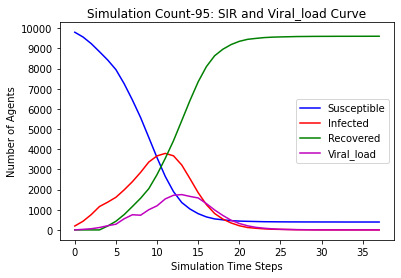

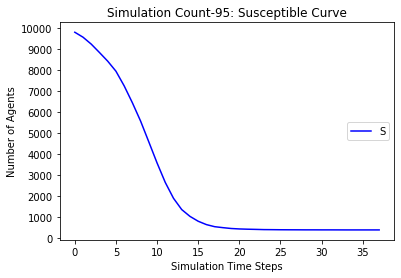

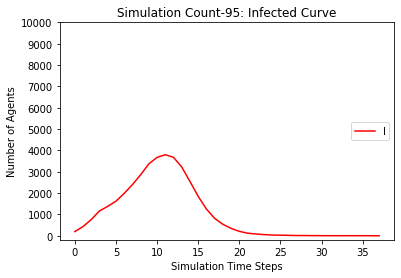

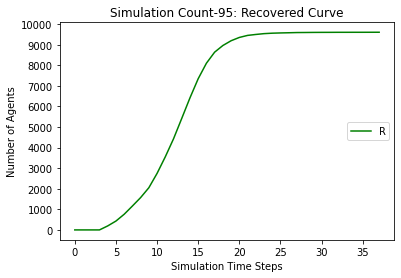

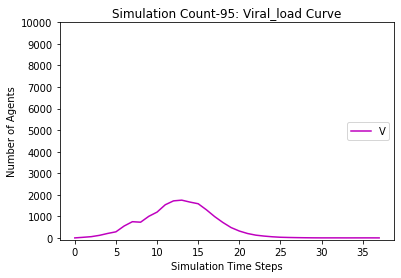

[9806, 9598, 9237, 8849, 8312, 7720, 6937, 5984, 4764, 3527, 2458, 1586, 1030, 681, 493, 403, 340, 311, 290, 280, 272, 263, 258, 257, 257, 257, 257, 257, 256, 254, 253, 253, 253, 253, 253]
[194, 402, 763, 1151, 1494, 1878, 2300, 2865, 3548, 4193, 4479, 4398, 3734, 2846, 1965, 1183, 690, 370, 203, 123, 68, 48, 32, 23, 15, 6, 1, 0, 1, 3, 4, 4, 3, 1, 0]
[0, 0, 0, 0, 194, 402, 763, 1151, 1688, 2280, 3063, 4016, 5236, 6473, 7542, 8414, 8970, 9319, 9507, 9597, 9660, 9689, 9710, 9720, 9728, 9737, 9742, 9743, 9743, 9743, 9743, 9743, 9744, 9746, 9747]
[0.0, 34.0, 78.0, 123.0, 264.5, 377.25, 589.625, 916.8125, 1373.40625, 1725.703125, 2214.8515625, 2701.42578125, 2712.712890625, 2608.3564453125, 2213.17822265625, 1655.589111328125, 1149.7945556640625, 725.8972778320312, 452.9486389160156, 262.4743194580078, 150.2371597290039, 88.11857986450195, 54.05928993225098, 37.02964496612549, 24.514822483062744, 12.257411241531372, 6.128705620765686, 3.064352810382843, 1.5321764051914215, 1.766088202595710

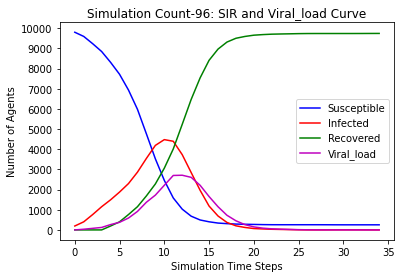

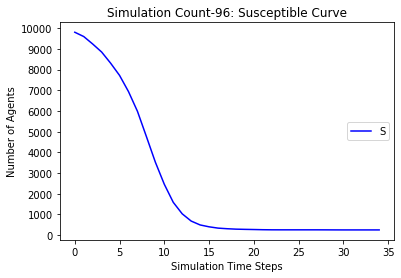

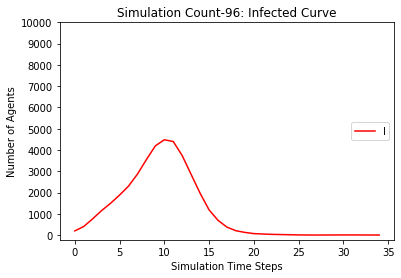

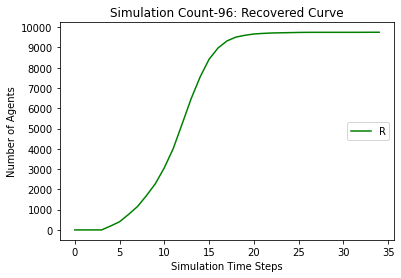

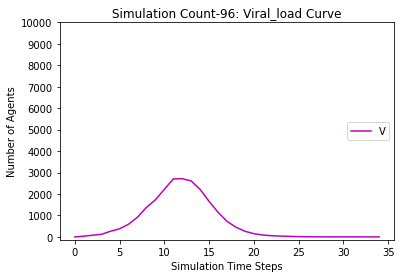

[9806, 9598, 9261, 8864, 8433, 7936, 7097, 6091, 5015, 3959, 2822, 1913, 1290, 846, 597, 449, 372, 337, 317, 300, 292, 286, 285, 280, 277, 274, 272, 272, 271, 270, 269, 267, 267, 267, 267, 266, 265, 265, 265, 265, 265]
[194, 402, 739, 1136, 1373, 1662, 2164, 2773, 3418, 3977, 4275, 4178, 3725, 3113, 2225, 1464, 918, 509, 280, 149, 80, 51, 32, 20, 15, 12, 13, 8, 6, 4, 3, 5, 4, 3, 2, 1, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 194, 402, 739, 1136, 1567, 2064, 2903, 3909, 4985, 6041, 7178, 8087, 8710, 9154, 9403, 9551, 9628, 9663, 9683, 9700, 9708, 9714, 9715, 9720, 9723, 9726, 9728, 9728, 9729, 9730, 9731, 9733, 9733, 9733, 9733, 9734, 9735]
[0.0, 32.0, 65.0, 120.5, 184.25, 357.125, 598.5625, 772.28125, 932.140625, 1184.0703125, 1876.03515625, 2089.017578125, 2158.5087890625, 2260.25439453125, 2048.127197265625, 1702.0635986328125, 1224.0317993164062, 836.0158996582031, 531.0079498291016, 331.5039749145508, 199.7519874572754, 119.8759937286377, 66.93799686431885, 41.468998432159424, 27.73449921607971

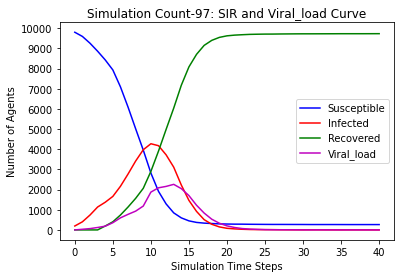

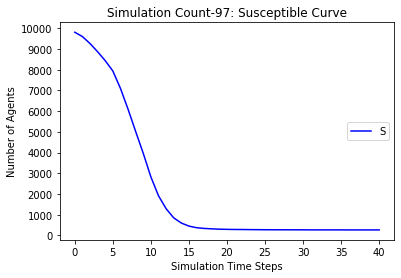

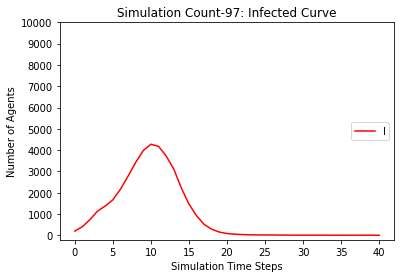

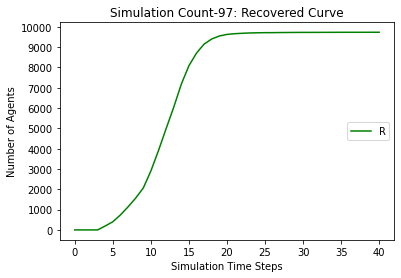

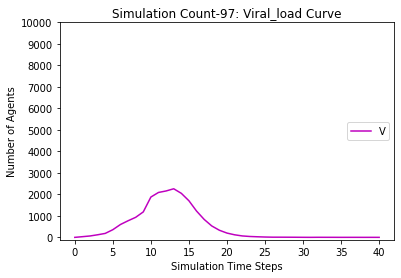

[9806, 9588, 9267, 8879, 8343, 7646, 6724, 5625, 4458, 3374, 2478, 1667, 1157, 858, 686, 574, 494, 446, 428, 418, 409, 405, 397, 396, 396, 394, 394, 393, 391, 390, 390, 389, 389, 388, 388, 387, 385, 384, 380, 380, 379, 378, 376, 376, 376, 376, 376]
[194, 412, 733, 1121, 1463, 1942, 2543, 3254, 3885, 4272, 4246, 3958, 3301, 2516, 1792, 1093, 663, 412, 258, 156, 85, 41, 31, 22, 13, 11, 3, 3, 5, 4, 4, 4, 2, 2, 2, 2, 4, 4, 8, 7, 6, 6, 4, 4, 3, 2, 0]
[0, 0, 0, 0, 194, 412, 733, 1121, 1657, 2354, 3276, 4375, 5542, 6626, 7522, 8333, 8843, 9142, 9314, 9426, 9506, 9554, 9572, 9582, 9591, 9595, 9603, 9604, 9604, 9606, 9606, 9607, 9609, 9610, 9610, 9611, 9611, 9612, 9612, 9613, 9615, 9616, 9620, 9620, 9621, 9622, 9624]
[0.0, 29.0, 49.5, 126.75, 286.375, 466.1875, 726.09375, 960.046875, 1344.0234375, 1659.01171875, 1856.505859375, 2310.2529296875, 2345.12646484375, 2037.563232421875, 1673.7816162109375, 1312.8908081054688, 886.4454040527344, 579.2227020263672, 352.6113510131836, 220.3056755065918,

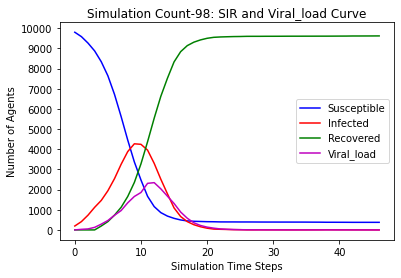

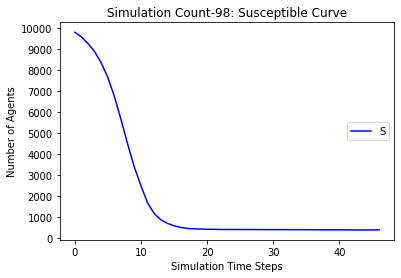

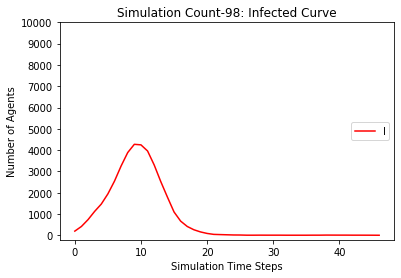

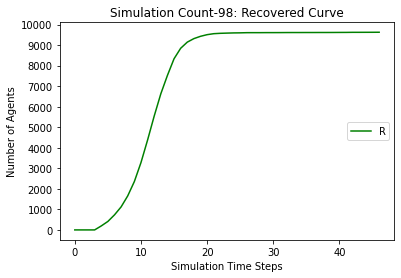

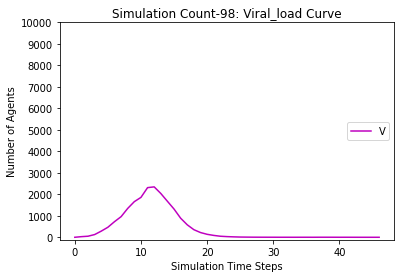

[9806, 9603, 9265, 8852, 8408, 7883, 7212, 6415, 5388, 4190, 3105, 2264, 1583, 1085, 766, 578, 478, 418, 380, 360, 351, 349, 345, 340, 339, 338, 337, 336, 335, 335, 334, 334, 334, 334, 334]
[194, 397, 735, 1148, 1398, 1720, 2053, 2437, 3020, 3693, 4107, 4151, 3805, 3105, 2339, 1686, 1105, 667, 386, 218, 127, 69, 35, 20, 12, 11, 8, 4, 4, 3, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 194, 397, 735, 1148, 1592, 2117, 2788, 3585, 4612, 5810, 6895, 7736, 8417, 8915, 9234, 9422, 9522, 9582, 9620, 9640, 9649, 9651, 9655, 9660, 9661, 9662, 9663, 9664, 9665, 9665, 9666]
[0.0, 26.0, 75.0, 135.5, 203.75, 329.875, 457.9375, 684.96875, 1006.484375, 1413.2421875, 1626.62109375, 1792.310546875, 2151.1552734375, 2321.57763671875, 2179.788818359375, 1793.8944091796875, 1369.9472045898438, 951.9736022949219, 629.9868011474609, 403.99340057373047, 252.99670028686523, 147.49835014343262, 92.74917507171631, 54.374587535858154, 32.18729376792908, 19.09364688396454, 12.54682344198227, 9.273411720991135, 4.636705860495567, 

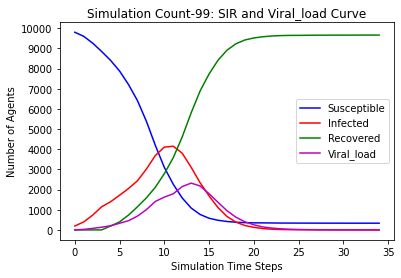

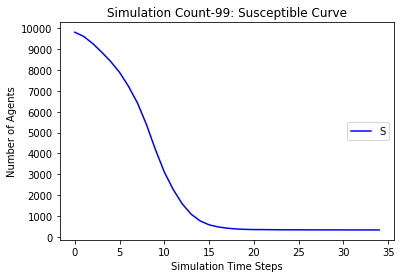

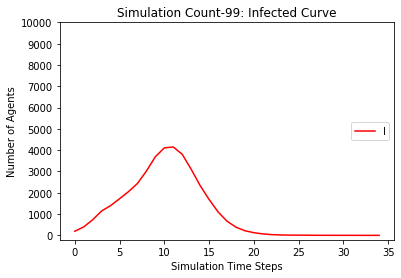

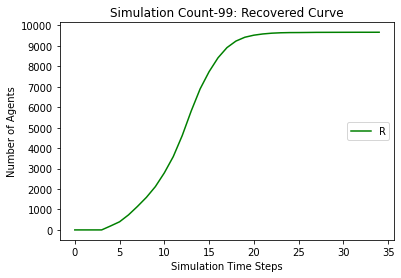

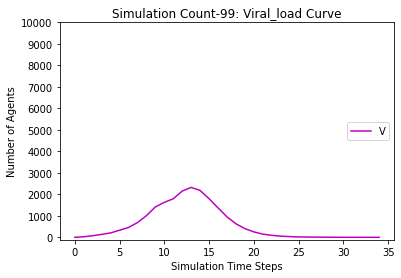

[9806, 9563, 9239, 8871, 8442, 7882, 7095, 6197, 5238, 4183, 3119, 2218, 1465, 979, 676, 521, 398, 342, 311, 297, 287, 281, 278, 278, 276, 275, 275, 275, 275, 275, 275]
[194, 437, 761, 1129, 1364, 1681, 2144, 2674, 3204, 3699, 3976, 3979, 3773, 3204, 2443, 1697, 1067, 637, 365, 224, 111, 61, 33, 19, 11, 6, 3, 3, 1, 0, 0]
[0, 0, 0, 0, 194, 437, 761, 1129, 1558, 2118, 2905, 3803, 4762, 5817, 6881, 7782, 8535, 9021, 9324, 9479, 9602, 9658, 9689, 9703, 9713, 9719, 9722, 9722, 9724, 9725, 9725]
[0.0, 33.0, 67.5, 111.75, 236.875, 405.4375, 552.71875, 684.359375, 852.1796875, 1230.08984375, 1546.044921875, 1882.0224609375, 2015.01123046875, 2061.505615234375, 1953.7528076171875, 1725.8764038085938, 1347.9382019042969, 963.9691009521484, 647.9845504760742, 422.9922752380371, 270.49613761901855, 149.24806880950928, 87.62403440475464, 50.81201720237732, 31.40600860118866, 18.70300430059433, 9.351502150297165, 4.6757510751485825, 2.3378755375742912, 1.1689377687871456, 0.5844688843935728]
[[], [9

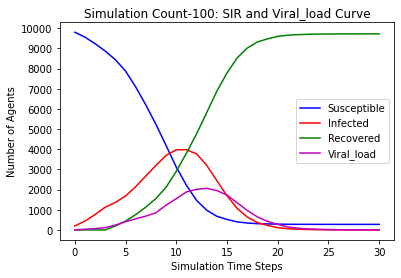

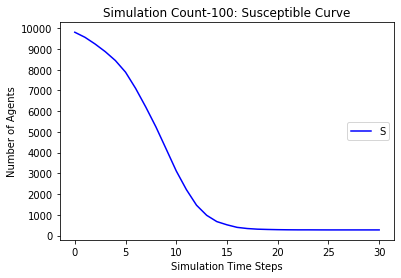

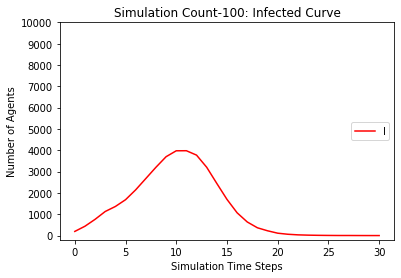

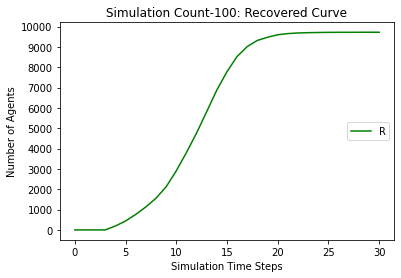

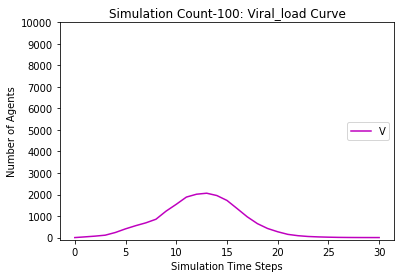

In [10]:
SS,II,RR,VV,TT = [[]],[[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj,Vj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,V,T = [],[],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  V.append(Vj)
  T.append(j)

  while Ij > 0 or Vj >= 1 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    Sj,Ij,Rj,Vj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    V.append(Vj)
    T.append(j)
    
  print(S)
  print(I)
  print(R)
  print(V)
  SS.append(S)
  II.append(I)
  RR.append(R)
  VV.append(V)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  print(VV)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g',T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': SIR and Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Susceptible Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Infected Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Recovered Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

  plt.plot(T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Viral_load"),loc='center right')
  plt.show()  

Susceptible Average (100 Simulations): [9806, 9596.501649567312, 9261.933413101786, 8859.057668010144, 8387.577567795252, 7818.238470657489, 7053.4966828971965, 6141.9251339903585, 5066.835237312494, 3923.2638273182274, 2883.9578431868194, 2035.6512211483318, 1411.1309751602707, 979.0972522651322, 714.5030594537071, 555.5097743726851, 463.71458133332385, 410.34272584107487, 380.41702016552915, 363.14838853126616, 353.76714953863166, 349.7783733209408, 344.8131660855864, 340.9432977068584, 339.93176396332404, 338.39340275378015, 337.5544697577695, 336.76006784971446, 335.50374896150026]
Infected Average(100 Simulations): [194, 403.4983504326895, 738.0665868982137, 1140.9423319898565, 1418.4224322047494, 1778.2631789098214, 2208.43673020459, 2717.1325340197845, 3320.742330482756, 3894.974643339262, 4169.538839710377, 4106.273912842027, 3655.7042621522237, 2944.166575053095, 2169.454783733112, 1480.1414467756467, 947.4163938269469, 568.7545264240573, 334.086039288178, 192.36138584141887, 

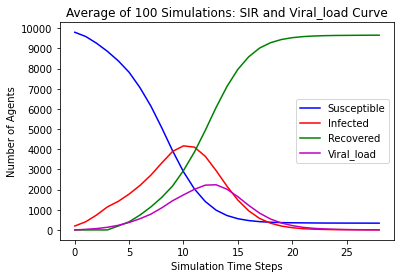

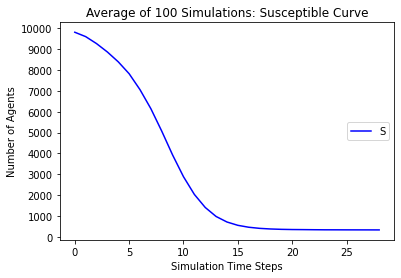

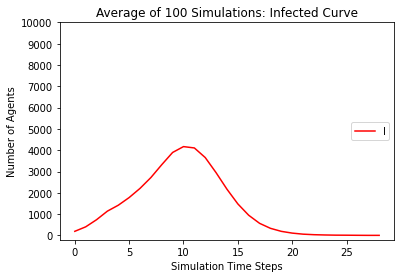

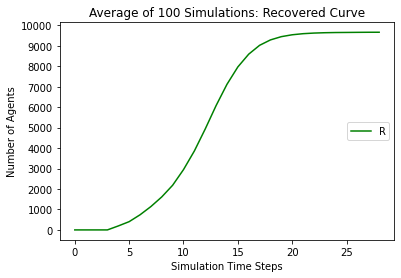

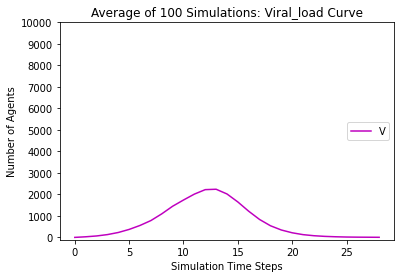

In [11]:
SC = SS[1]
IC = II[1]
RC = RR[1]
VT = VV[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  VT = [mean(i) for i in zip(VT,VV[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

print("Susceptible Average (100 Simulations):", SC)
print("Infected Average(100 Simulations):", IC)
print("Recovered Average(100 Simulations):", RC)
print("Viral_load Average(100 Simulations):", VT) 
print("Time Steps:", TC) 



plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g', TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: SIR and Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Infected Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))

plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Recovered"),loc='center right')
plt.show()  

plt.plot(TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Viral_load"),loc='center right')
plt.show() 



  
